In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_context('notebook', font_scale=1.5, rc={'lines.markeredgewidth': 2})

In [2]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

In [3]:
import matplotlib
print('matplotlib:', matplotlib.__version__)
import numpy
print('numpy:', numpy.__version__)
import scipy
print('scipy:', scipy.__version__)
import pandas 
print('pandas:', pandas.__version__)
import seaborn
print('seaborn:', seaborn.__version__)
import allensdk
print('allensdk:', allensdk.__version__)

matplotlib: 3.4.2
numpy: 1.20.3
scipy: 1.4.1
pandas: 1.5.3
seaborn: 0.12.2
allensdk: 2.16.2


In [4]:
import visual_behavior.data_access.utilities as utilities
from visual_behavior.data_access import loading as loading

import visual_behavior.visualization.utils as utils
import visual_behavior.visualization.ophys.platform_paper_figures as ppf

from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorOphysProjectCache

In [5]:
experience_levels = utils.get_new_experience_levels()
colors = utils.get_experience_level_colors()
cell_types = utils.get_cell_types()

### load experiments and cells tables

In [6]:
loading.get_platform_analysis_cache_dir()

'\\\\allen\\programs\\braintv\\workgroups\\nc-ophys\\visual_behavior\\platform_paper_cache_new'

In [50]:
from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorOphysProjectCache

platform_cache_dir = loading.get_platform_analysis_cache_dir()
cache = VisualBehaviorOphysProjectCache.from_s3_cache(cache_dir = platform_cache_dir)
experiments_table = cache.get_ophys_experiment_table()
print(len(experiments_table))

1936


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


In [8]:
# metadata tables
experiments_table = pd.read_csv(os.path.join(platform_cache_dir, 'all_ophys_experiments_table.csv'), index_col=0)
platform_experiments = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_ophys_experiments_table.csv'), index_col=0)
platform_cells_table = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_ophys_cells_table.csv'), index_col=0)
matched_cells_table = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_matched_ophys_cells_table.csv'), index_col=0)

# ### Define model version
# glm_version = '24_events_all_L2_optimize_by_session'
 
# # glm outputs
# run_params = pd.read_pickle(os.path.join(platform_cache_dir, 'glm_results', glm_version+'_run_params.pkl'))
# all_weights_df = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'weights_df.h5'), key='df')
# all_results = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'all_results.h5'), key='df')
# all_results_pivoted = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'results_pivoted.h5'), key='df')

# # # split out csid and oeid for results table
# # all_results['cell_specimen_id'] = [int(identifier.split('_')[1]) for identifier in all_results.identifier.values]
# # all_results['ophys_experiment_id'] = [int(identifier.split('_')[0]) for identifier in all_results.identifier.values]

# # # get results and weights just for platform paper experiments
# # results_pivoted = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'platform_results_pivoted.h5'), key='df')
# weights_df = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'platform_results_weights_df.h5'), key='df')
# results_pivoted = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'across_session_normalized_platform_results_pivoted.h5'), key='df')
# now drop ophys_experiment_id
# results_pivoted = results_pivoted.drop(columns=['ophys_experiment_id'])

# clustering results
# feature_matrix = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'clustering_feature_matrix.h5'), key='df')
# cluster_meta = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'cluster_meta.h5'), key='df')

# get lists of matched cells and expts
matched_cells = matched_cells_table.cell_specimen_id.unique()
matched_experiments = matched_cells_table.ophys_experiment_id.unique()

# get cre_lines and cell types for plot labels
cre_lines = np.sort(platform_cells_table.cre_line.unique())
cell_types = utilities.get_cell_types_dict(cre_lines, platform_experiments)


In [9]:
print(len(experiments_table.mouse_id.unique()), 'mice')
print(len(experiments_table.ophys_container_id.unique()), 'containers')
print(len(experiments_table.index.unique()), 'experiments')

107 mice
326 containers
1936 experiments


In [10]:
print(len(platform_experiments.mouse_id.unique()), 'mice')
print(len(platform_experiments.ophys_container_id.unique()), 'containers')
print(len(platform_experiments.index.unique()), 'experiments')

66 mice
134 containers
402 experiments


### get useful info

In [11]:
palette = utilities.get_experience_level_colors()

In [12]:
save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_figures_final\figure_2'

folder = 'population_activity'

## Load response metrics

In [13]:
import visual_behavior.ophys.response_analysis.cell_metrics as cm
import visual_behavior.dimensionality_reduction.clustering.processing as processing

c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\statsmodels\compat\pandas.py:61: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentat

#### Trace metrics

In [190]:
# data_type = 'events'
# condition = 'traces'
# stimuli = 'full_session'
# session_subset = 'full_session'
# inclusion_criteria = 'platform_experiment_table'


# trace_metrics = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

# # filepath = cm.get_metrics_df_filepath('all_experiments', condition, stimuli, session_subset,
# #                                        data_type=data_type, interpolate=True, output_sampling_rate=30)
# # trace_metrics.to_hdf(filepath, key='df')

# print(len(trace_metrics.ophys_experiment_id.unique()))

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 0/402 [00:00<?, ?it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_traces_full_session_full_session_events.h5


  1%|          | 4/402 [00:00<00:39, 10.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_traces_full_session_full_session_events.h5


  2%|▏         | 9/402 [00:00<00:25, 15.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\

  3%|▎         | 13/402 [00:01<00:32, 11.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_traces_full_session_full_session_events.h5


  4%|▎         | 15/402 [00:01<00:32, 12.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_traces_full_session_full_session_events.h5


  5%|▍         | 19/402 [00:01<00:30, 12.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_traces_full_session_full_session_events.h5


  6%|▌         | 23/402 [00:01<00:26, 14.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_traces_full_session_full_session_events.h5


  7%|▋         | 27/402 [00:02<00:24, 15.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_traces_full_session_full_session_events.h5


  8%|▊         | 31/402 [00:02<00:23, 15.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_traces_full_session_full_session_events.h5


  8%|▊         | 33/402 [00:02<00:24, 14.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_traces_full_session_full_session_events.h5


  9%|▉         | 37/402 [00:02<00:25, 14.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_traces_full_session_full_session_events.h5


 10%|█         | 41/402 [00:03<00:23, 15.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_traces_full_session_full_session_events.h5


 11%|█         | 44/402 [00:03<00:21, 16.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_traces_full_session_full_session_events.h5


 12%|█▏        | 48/402 [00:03<00:21, 16.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_traces_full_session_full_session_events.h5


 13%|█▎        | 52/402 [00:03<00:21, 16.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_traces_full_session_full_session_events.h5


 14%|█▍        | 56/402 [00:03<00:20, 17.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_traces_full_session_full_session_events.h5


 15%|█▍        | 60/402 [00:04<00:20, 16.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_traces_full_session_full_session_events.h5


 16%|█▌        | 64/402 [00:04<00:20, 16.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_traces_full_session_full_session_events.h5


 17%|█▋        | 68/402 [00:04<00:23, 14.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_traces_full_session_full_session_events.h5


 18%|█▊        | 72/402 [00:04<00:20, 15.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_traces_full_session_full_session_events.h5


 19%|█▉        | 78/402 [00:05<00:17, 18.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_traces_full_session_full_session_events.h5


 20%|██        | 81/402 [00:05<00:16, 20.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_traces_full_session_full_session_events.h5


 21%|██        | 84/402 [00:05<00:18, 16.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_traces_full_session_full_session_events.h5


 21%|██▏       | 86/402 [00:05<00:21, 14.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_traces_full_session_full_session_events.h5


 22%|██▏       | 90/402 [00:06<00:24, 13.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_traces_full_session_full_session_events.h5


 23%|██▎       | 93/402 [00:06<00:19, 15.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_traces_full_session_full_session_events.h5


 24%|██▍       | 98/402 [00:06<00:16, 18.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_traces_full_session_full_session_events.h5


 25%|██▍       | 100/402 [00:06<00:17, 17.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_traces_full_session_full_session_events.h5


 26%|██▌       | 104/402 [00:07<00:44,  6.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_traces_full_session_full_session_events.h5


 27%|██▋       | 107/402 [00:07<00:32,  9.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_traces_full_session_full_session_events.h5


 28%|██▊       | 112/402 [00:08<00:24, 11.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_traces_full_session_full_session_events.h5


 29%|██▉       | 117/402 [00:08<00:19, 14.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\

 30%|███       | 122/402 [00:09<00:22, 12.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_traces_full_session_full_session_events.h5


 32%|███▏      | 127/402 [00:14<02:29,  1.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_traces_full_session_full_session_events.h5


 33%|███▎      | 133/402 [00:17<02:01,  2.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_traces_full_session_full_session_events.h5


 34%|███▍      | 138/402 [00:17<01:05,  4.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_traces_full_session_full_session_events.h5


 35%|███▌      | 142/402 [00:18<00:45,  5.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_traces_full_session_full_session_events.h5


 36%|███▋      | 146/402 [00:18<00:31,  8.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_traces_full_session_full_session_events.h5


 37%|███▋      | 148/402 [00:18<00:26,  9.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_traces_full_session_full_session_events.h5


 38%|███▊      | 152/402 [00:18<00:21, 11.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_traces_full_session_full_session_events.h5


 38%|███▊      | 154/402 [00:23<02:54,  1.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_traces_full_session_full_session_events.h5


 40%|███▉      | 159/402 [00:24<01:36,  2.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_traces_full_session_full_session_events.h5


 40%|████      | 161/402 [00:24<01:12,  3.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_traces_full_session_full_session_events.h5


 41%|████▏     | 166/402 [00:24<00:38,  6.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_traces_full_session_full_session_events.h5


 43%|████▎     | 171/402 [00:24<00:24,  9.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_traces_full_session_full_session_events.h5


 43%|████▎     | 174/402 [00:24<00:19, 11.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_traces_full_session_full_session_events.h5


 45%|████▍     | 180/402 [00:25<00:13, 16.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_traces_full_session_full_session_events.h5


 46%|████▌     | 183/402 [00:25<00:12, 17.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_traces_full_session_full_session_events.h5


 47%|████▋     | 189/402 [00:25<00:11, 18.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_traces_full_session_full_session_events.h5


 48%|████▊     | 192/402 [00:25<00:11, 18.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_traces_full_session_full_session_events.h5


 49%|████▉     | 198/402 [00:25<00:11, 18.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_traces_full_session_full_session_events.h5


 50%|█████     | 202/402 [00:26<00:11, 18.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_traces_full_session_full_session_events.h5


 51%|█████     | 206/402 [00:26<00:10, 17.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_traces_full_session_full_session_events.h5


 52%|█████▏    | 210/402 [00:26<00:10, 17.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_traces_full_session_full_session_events.h5


 53%|█████▎    | 214/402 [00:26<00:10, 17.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_traces_full_session_full_session_events.h5


 54%|█████▍    | 219/402 [00:27<00:09, 18.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_traces_full_session_full_session_events.h5


 56%|█████▌    | 224/402 [00:27<00:09, 19.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_traces_full_session_full_session_events.h5


 56%|█████▌    | 226/402 [00:27<00:09, 17.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_traces_full_session_full_session_events.h5


 57%|█████▋    | 230/402 [00:27<00:10, 16.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_traces_full_session_full_session_events.h5


 58%|█████▊    | 233/402 [00:27<00:09, 18.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_traces_full_session_full_session_events.h5


 59%|█████▉    | 237/402 [00:28<00:10, 15.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_traces_full_session_full_session_events.h5


 60%|█████▉    | 241/402 [00:28<00:11, 13.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_traces_full_session_full_session_events.h5


 60%|██████    | 243/402 [00:28<00:11, 14.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_traces_full_session_full_session_events.h5


 61%|██████▏   | 247/402 [00:28<00:10, 14.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_traces_full_session_full_session_events.h5


 62%|██████▏   | 249/402 [00:29<00:10, 14.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_traces_full_session_full_session_events.h5


 63%|██████▎   | 253/402 [00:30<00:20,  7.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_traces_full_session_full_session_events.h5


 64%|██████▍   | 258/402 [00:30<00:12, 11.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_traces_full_session_full_session_events.h5


 65%|██████▌   | 263/402 [00:30<00:09, 14.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_traces_full_session_full_session_events.h5


 66%|██████▋   | 267/402 [00:30<00:08, 15.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_traces_full_session_full_session_events.h5


 68%|██████▊   | 272/402 [00:31<00:07, 17.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_traces_full_session_full_session_events.h5


 68%|██████▊   | 274/402 [00:31<00:07, 17.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_traces_full_session_full_session_events.h5


 69%|██████▉   | 278/402 [00:31<00:07, 15.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_traces_full_session_full_session_events.h5


 70%|███████   | 282/402 [00:31<00:07, 16.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_traces_full_session_full_session_events.h5


 71%|███████   | 284/402 [00:31<00:07, 15.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_traces_full_session_full_session_events.h5


 72%|███████▏  | 289/402 [00:32<00:08, 13.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_traces_full_session_full_session_events.h5


 73%|███████▎  | 295/402 [00:32<00:06, 17.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_traces_full_session_full_session_events.h5


 75%|███████▍  | 300/402 [00:32<00:05, 19.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_traces_full_session_full_session_events.h5


 75%|███████▌  | 303/402 [00:32<00:05, 18.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_traces_full_session_full_session_events.h5


 76%|███████▌  | 305/402 [00:33<00:05, 18.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_traces_full_session_full_session_events.h5


 77%|███████▋  | 309/402 [00:33<00:05, 15.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_traces_full_session_full_session_events.h5


 78%|███████▊  | 314/402 [00:33<00:05, 16.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_traces_full_session_full_session_events.h5


 79%|███████▊  | 316/402 [00:33<00:04, 17.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_traces_full_session_full_session_events.h5


 80%|████████  | 322/402 [00:34<00:04, 19.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_traces_full_session_full_session_events.h5


 81%|████████  | 325/402 [00:34<00:03, 20.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_traces_full_session_full_session_events.h5


 82%|████████▏ | 330/402 [00:34<00:04, 17.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_traces_full_session_full_session_events.h5


 83%|████████▎ | 334/402 [00:34<00:04, 15.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_traces_full_session_full_session_events.h5


 84%|████████▎ | 336/402 [00:34<00:04, 14.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_traces_full_session_full_session_events.h5


 85%|████████▍ | 340/402 [00:35<00:04, 14.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_traces_full_session_full_session_events.h5


 86%|████████▌ | 344/402 [00:35<00:03, 15.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_traces_full_session_full_session_events.h5


 87%|████████▋ | 348/402 [00:35<00:03, 15.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_traces_full_session_full_session_events.h5


 88%|████████▊ | 352/402 [00:35<00:03, 15.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_traces_full_session_full_session_events.h5


 89%|████████▉ | 357/402 [00:36<00:02, 16.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_traces_full_session_full_session_events.h5


 89%|████████▉ | 359/402 [00:36<00:02, 17.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_traces_full_session_full_session_events.h5


 90%|█████████ | 363/402 [00:36<00:02, 16.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_traces_full_session_full_session_events.h5


 91%|█████████ | 365/402 [00:36<00:03, 11.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_traces_full_session_full_session_events.h5


 92%|█████████▏| 369/402 [00:37<00:02, 12.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_traces_full_session_full_session_events.h5


 93%|█████████▎| 372/402 [00:37<00:02, 14.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_traces_full_session_full_session_events.h5


 93%|█████████▎| 374/402 [00:37<00:03,  8.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_traces_full_session_full_session_events.h5


 94%|█████████▍| 378/402 [00:38<00:02, 11.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_traces_full_session_full_session_events.h5


 95%|█████████▌| 383/402 [00:38<00:01, 14.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_traces_full_session_full_session_events.h5


 97%|█████████▋| 389/402 [00:38<00:00, 18.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_traces_full_session_full_session_events.h5


 98%|█████████▊| 395/402 [00:38<00:00, 19.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_traces_full_session_full_session_events.h5


 99%|█████████▉| 398/402 [00:39<00:00, 20.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_traces_full_session_full_session_events.h5


100%|██████████| 402/402 [00:39<00:00, 10.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_traces_full_session_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_traces_full_session_full_session_events.h5
there are 402 experiments in the returned cell_metrics table


#### Merged table of cell metrics across conditions

In [14]:

data_type = 'filtered_events'

session_subset = 'full_session'
    
inclusion_criteria = 'platform_experiment_table'

filtered_events_metrics_table = processing.generate_merged_table_of_model_free_metrics(data_type=data_type, session_subset=session_subset,
                                                inclusion_criteria=inclusion_criteria, save_dir=platform_cache_dir)

original_metrics_table = filtered_events_metrics_table.copy()
metrics_table = filtered_events_metrics_table.copy()
len(metrics_table.ophys_experiment_id.unique())


filepath: \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\merged_model_free_metrics_table_filtered_events_platform_experiment_table.csv
loading model free metrics table


402

In [15]:

metrics_table = metrics_table.merge(platform_experiments.reset_index(), on=['ophys_experiment_id', 'experience_level'])
print(len(metrics_table.ophys_experiment_id.unique()))
print(len(metrics_table.cell_specimen_id.unique()))

402
14495


## load multi_session_dfs 

In [87]:
data_type = 'events'

interpolate = True
output_sampling_rate = 30

inclusion_criteria = 'platform_experiment_table'

In [88]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

multi_session_df = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

# limit to changes, convert experience level and merge with cluster IDs
change_mdf = multi_session_df[multi_session_df.is_change==True]

# limit to non-changes, convert experience level and merge with cluster IDs
image_mdf = multi_session_df[(multi_session_df.is_change==False)]


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_is_change_platform_experiment_table.pkl
there are 1881 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 400 experiments in the multi_session_df after limiting to platform experiments
there are 400 experiments after filtering for inclusion criteria -  platform_experiment_table


In [89]:
multi_session_df.experience_level.unique()

array(['Familiar', 'Novel', 'Novel +'], dtype=object)

In [90]:
# change_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in change_mdf.experience_level.values]

In [91]:
print(len(change_mdf.mouse_id.unique()), 'mice')
print(len(change_mdf.ophys_container_id.unique()), 'containers')
print(len(change_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(change_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
400 experiments
14493 cells


In [92]:
# limit to platform paper expts
image_mdf = image_mdf[image_mdf.ophys_experiment_id.isin(platform_experiments.index.values)]
change_mdf = change_mdf[change_mdf.ophys_experiment_id.isin(platform_experiments.index.values)]

In [93]:
print(len(change_mdf.mouse_id.unique()), 'mice')
print(len(change_mdf.ophys_container_id.unique()), 'containers')
print(len(change_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(change_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
400 experiments
14493 cells


In [94]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

omission_mdf = omission_mdf[omission_mdf.omitted==True]


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_omitted_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_omitted_platform_experiment_table.pkl
there are 1879 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


In [95]:
print(len(omission_mdf.mouse_id.unique()), 'mice')
print(len(omission_mdf.ophys_container_id.unique()), 'containers')
print(len(omission_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(omission_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
401 experiments
14494 cells


### per image mdf

In [96]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change', 'image_name']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

each_image_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_image_name_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_is_change_image_name_platform_experiment_table.pkl
there are 1885 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


## population averages & heatmaps of cell responses

### images

In [97]:
data_type = 'events'

interpolate = True
output_sampling_rate = 30

# set inclusion criteria
# options: ['active_only', 'closest_familiar_and_novel', 'containers_with_all_levels']
# inclusion_criteria = 'platform_experiment_table'
inclusion_criteria = 'platform_experiment_table'

In [98]:
folder = 'population_averages'

267


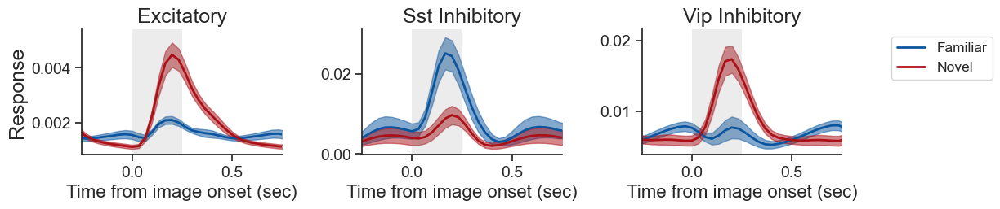

In [99]:
df = image_mdf.copy()
# for just familiar & novel (no novel+)
df = df[df.ophys_experiment_id.isin(platform_experiments.index.values)]
df = df[df.experience_level.isin(['Familiar', 'Novel'])]
print(len(df.ophys_experiment_id.unique()))
# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-0.25, 0.75]

suffix = '_images_F_N'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'all', axes_column, hue_column, 
                                                        horizontal=True, xlabel='Time from image onset (sec)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


400


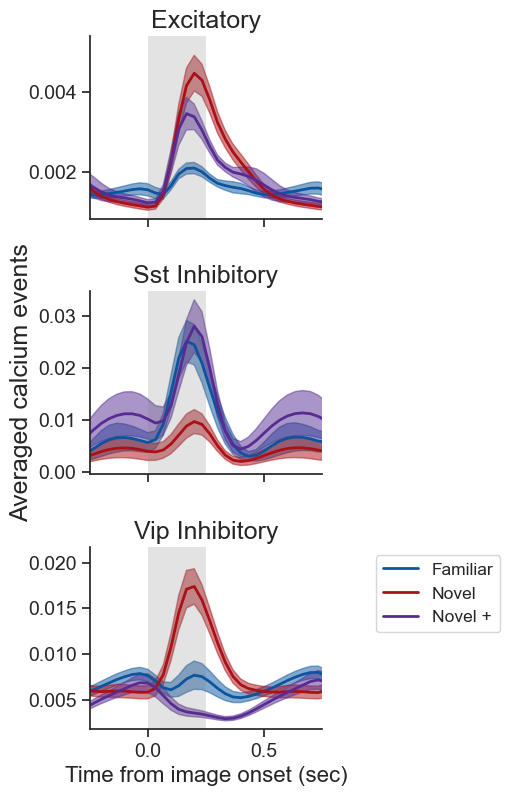

In [100]:
# with Novel +
df = image_mdf.copy()
# for just familiar & novel (no novel+)
# df = df[df.experience_level.isin(['Familiar', 'Novel 1'])]
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-0.25, 0.75]

suffix = '_images'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'all', axes_column, hue_column,
                                                    horizontal=False, xlabel='Time from image onset (sec)',
                                                    ylabel='Averaged calcium events', legend=True,
                                                    xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                    palette=palette, ax=None, title=None, suptitle=None,
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory\ncells'>,
       <AxesSubplot:title={'center':'Novel'}>,
       <AxesSubplot:title={'center':'Novel +'}>,
       <AxesSubplot:ylabel='Sst Inhibitory\ncells'>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:ylabel='Vip Inhibitory\ncells'>,
       <AxesSubplot:xlabel='Time from image onset (sec)'>, <AxesSubplot:>],
      dtype=object)

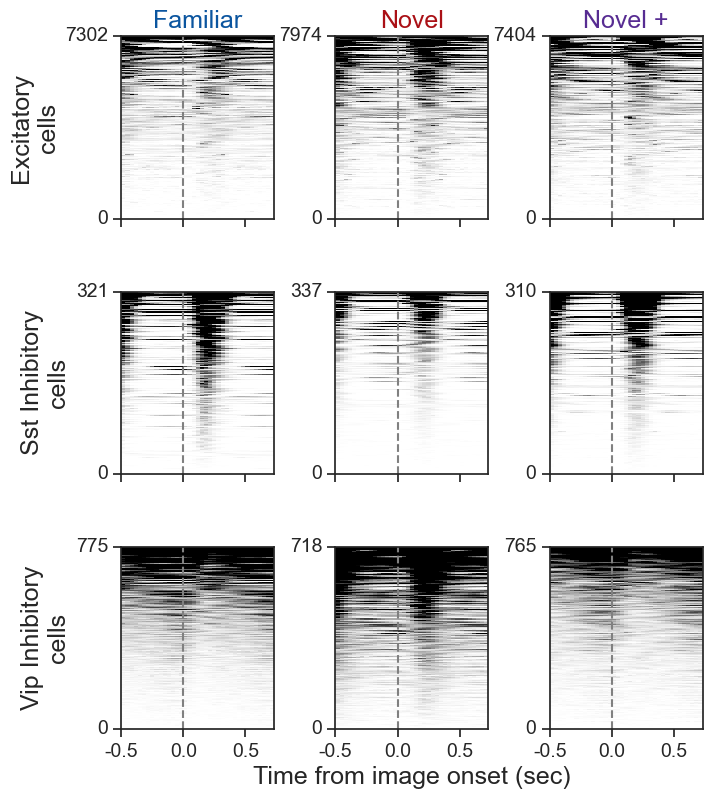

In [101]:
df = image_mdf.copy()

xlim_seconds = [-0.5, 0.75]

event_type = 'all'

timestamps = df.trace_timestamps.values[0]
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type, row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time from image onset (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='', ax=None)


# ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
#                                           row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
#                                           microscope=None, vmax=None, xlim_seconds=[-2, 2], match_cells=False, cbar=True,
#                                           save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory\ncells'>,
       <AxesSubplot:title={'center':'Novel'}>,
       <AxesSubplot:title={'center':'Novel +'}>,
       <AxesSubplot:ylabel='Sst Inhibitory\ncells'>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:ylabel='Vip Inhibitory\ncells'>,
       <AxesSubplot:xlabel='Time from image onset (sec)'>, <AxesSubplot:>],
      dtype=object)

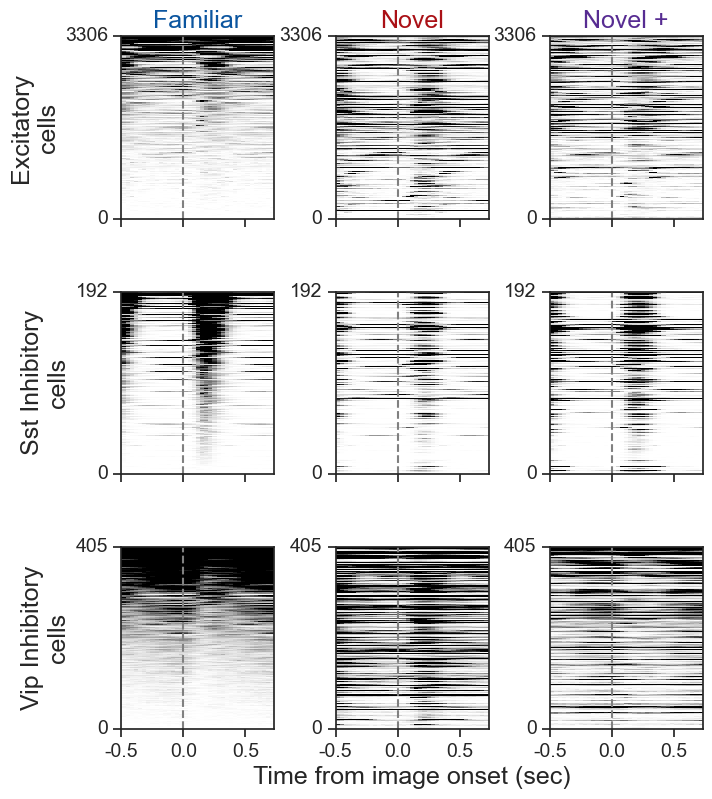

In [102]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(image_mdf)
xlim_seconds = [-0.5, 0.75]

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'all', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time from image onset (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_matched', ax=None)


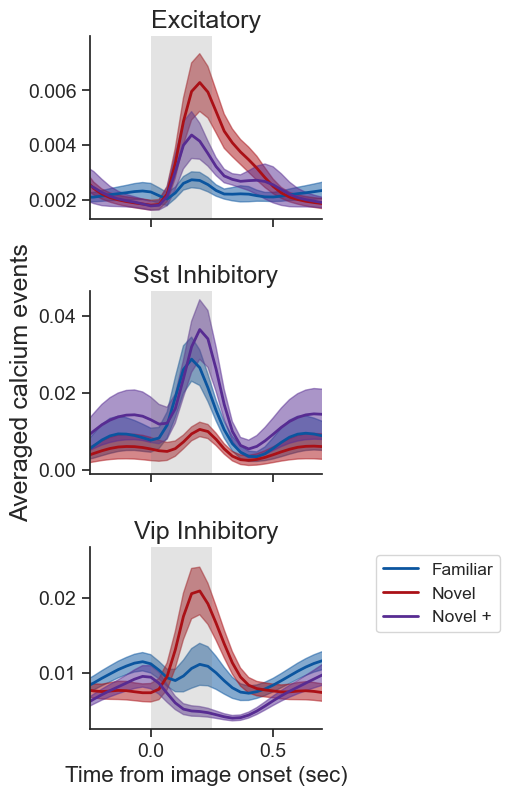

In [103]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(image_mdf)
xlim_seconds = [-0.25, 0.7]

suffix = '_images_matched'

ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'all', axes_column, hue_column,
                                                    horizontal=False, xlabel='Time from image onset (sec)',
                                                    ylabel='Averaged calcium events', legend=True,
                                                    xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                    palette=palette, ax=None, title=None, suptitle=None,
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


## changes

400


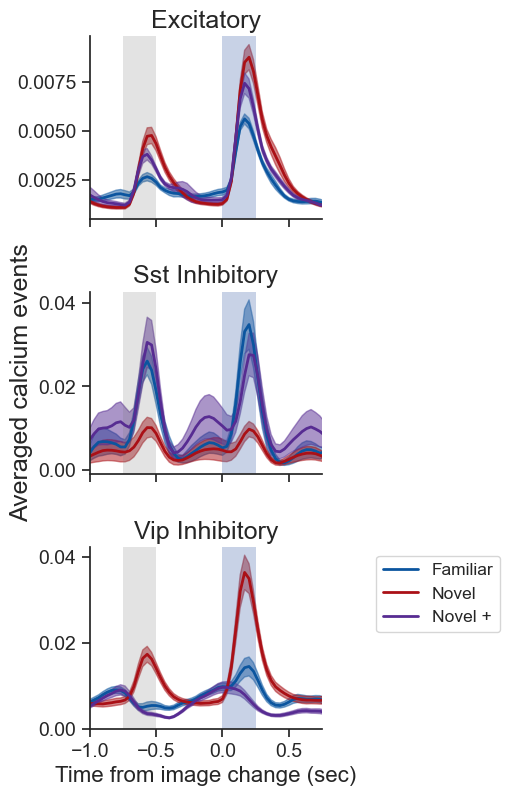

In [104]:
# with Novel +
df = change_mdf.copy()
# for just familiar & novel (no novel+)
# df = df[df.experience_level.isin(['Familiar', 'Novel 1'])]
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-1, 0.75]

suffix = '_changes'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, ylabel='Averaged calcium events',
                                                        horizontal=False, xlabel='Time from image change (sec)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5, legend=True,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory\ncells'>,
       <AxesSubplot:title={'center':'Novel'}>,
       <AxesSubplot:title={'center':'Novel +'}>,
       <AxesSubplot:ylabel='Sst Inhibitory\ncells'>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:ylabel='Vip Inhibitory\ncells'>,
       <AxesSubplot:xlabel='Time from image change (sec)'>,
       <AxesSubplot:>], dtype=object)

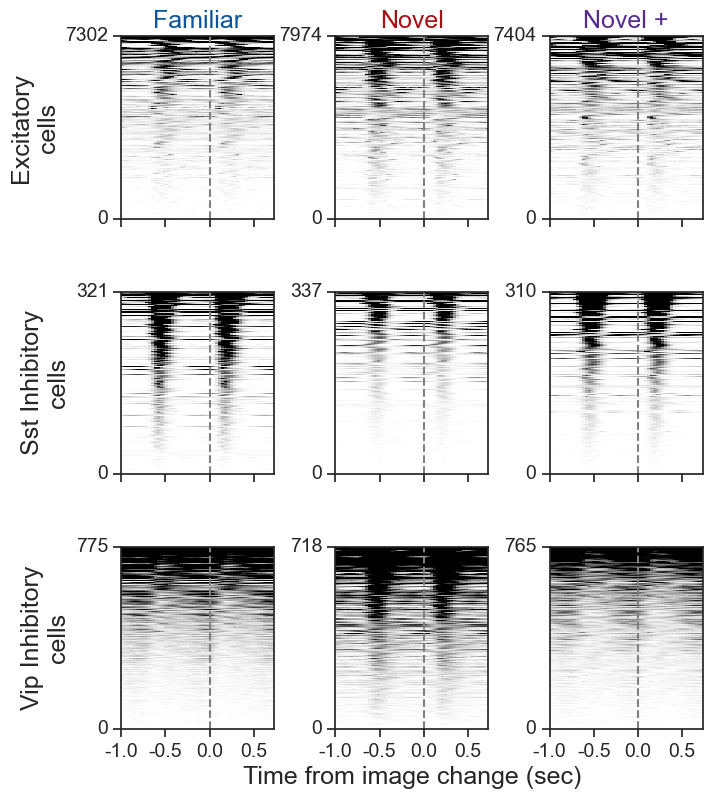

In [105]:
df = image_mdf.copy()

xlim_seconds = [-1, 0.75]

event_type = 'all'

timestamps = df.trace_timestamps.values[0]
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type, row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time from image change (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='', ax=None)

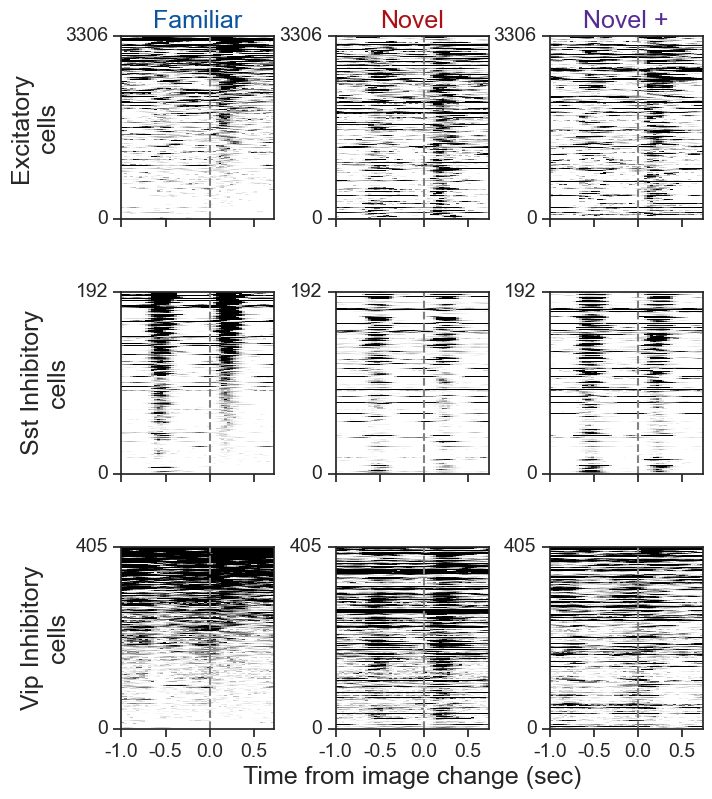

In [106]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(change_mdf)
xlim_seconds = [-1, 0.75]


ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'all', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time from image change (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_matched', ax=None);


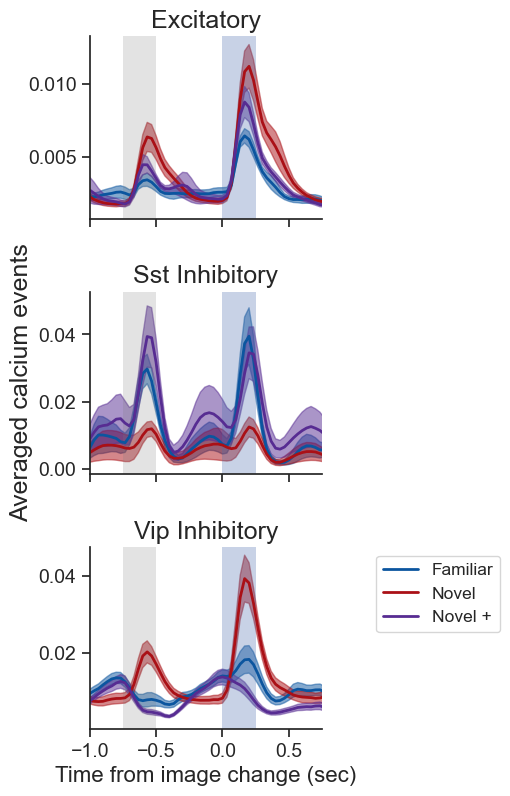

In [107]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(change_mdf)
xlim_seconds = [-1, 0.75]

suffix = '_changes_matched'

ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'changes', axes_column, hue_column, 
                                                        ylabel='Averaged calcium events', legend=True,
                                                        horizontal=False, xlabel='Time from image change (sec)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


### omissions

401


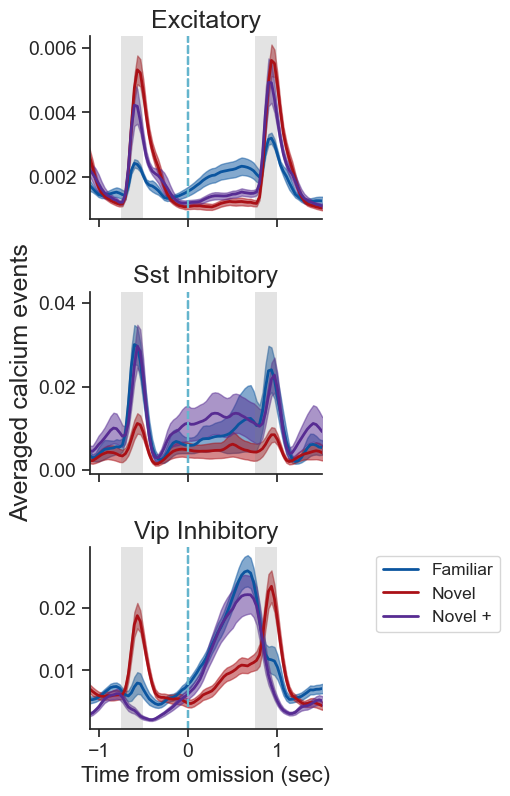

In [108]:

df = omission_mdf.copy()
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.1, 1.5]

suffix = '_omissions'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions', axes_column, hue_column, 
                                                ylabel='Averaged calcium events', legend=True,
                                                horizontal=False, xlabel='Time from omission (sec)',
                                                xlim_seconds=xlim_seconds, interval_sec=1,
                                                palette=palette, ax=None, title=None, suptitle=None,
                                                save_dir=save_dir, folder=folder, suffix=suffix)


array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Vip Inhibitory\ncells'>,
       <AxesSubplot:title={'center':'Novel'}, xlabel='Time from omission (sec)'>,
       <AxesSubplot:title={'center':'Novel +'}>], dtype=object)

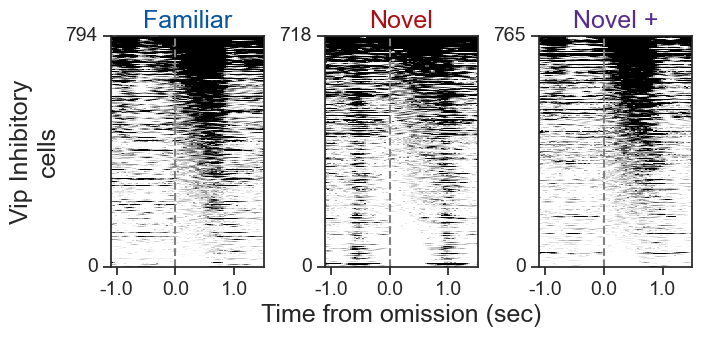

In [109]:
# Vip only
df = omission_mdf.copy()
df = df[df.cre_line=='Vip-IRES-Cre']

xlim_seconds = [-1.1, 1.5]

timestamps = df.trace_timestamps.values[0]
timestamps = np.asarray([np.round(time,3) for time in timestamps])
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, 'omissions', row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time from omission (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_vip', ax=None)


# ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
#                                           row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
#                                           microscope=None, vmax=None, xlim_seconds=[-2, 2], match_cells=False, cbar=True,
#                                           save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory\ncells'>,
       <AxesSubplot:title={'center':'Novel'}>,
       <AxesSubplot:title={'center':'Novel +'}>,
       <AxesSubplot:ylabel='Sst Inhibitory\ncells'>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:ylabel='Vip Inhibitory\ncells'>,
       <AxesSubplot:xlabel='Time from omission (sec)'>, <AxesSubplot:>],
      dtype=object)

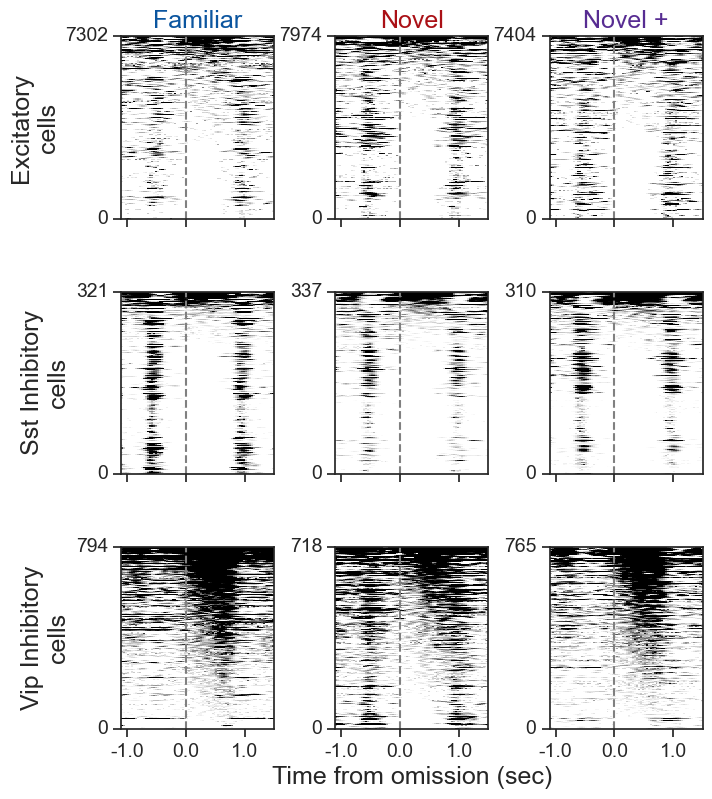

In [110]:
df = omission_mdf.copy()

xlim_seconds = [-1.1, 1.5]

timestamps = df.trace_timestamps.values[0]
timestamps = np.asarray([np.round(time,3) for time in timestamps])
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, 'omissions', row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time from omission (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='', ax=None)


# ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
#                                           row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
#                                           microscope=None, vmax=None, xlim_seconds=[-2, 2], match_cells=False, cbar=True,
#                                           save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory\ncells'>,
       <AxesSubplot:title={'center':'Novel'}>,
       <AxesSubplot:title={'center':'Novel +'}>,
       <AxesSubplot:ylabel='Sst Inhibitory\ncells'>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:ylabel='Vip Inhibitory\ncells'>,
       <AxesSubplot:xlabel='Time from omission (sec)'>, <AxesSubplot:>],
      dtype=object)

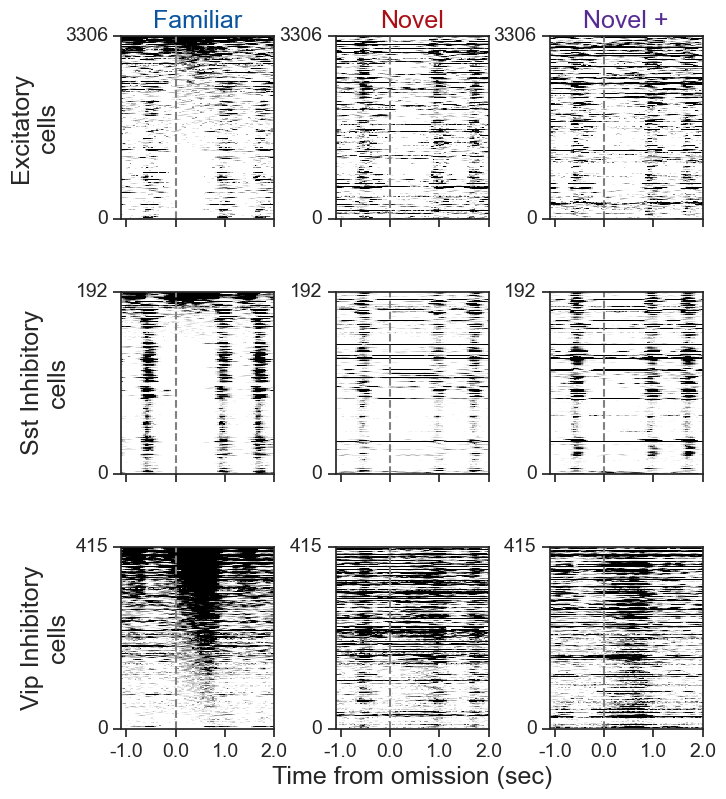

In [111]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)
xlim_seconds = [-1.1, 2]

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'omissions', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time from omission (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_matched', ax=None)


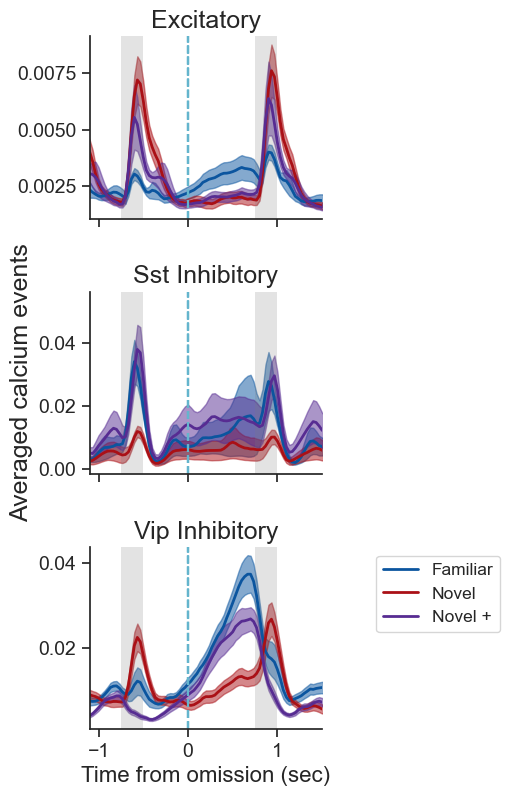

In [112]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)
xlim_seconds = [-1.1, 1.5]
suffix = '_omissions_matched'

ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'omissions', axes_column, hue_column, 
                                                horizontal=False, xlabel='Time from omission (sec)',
                                                ylabel='Averaged calcium events', legend=True,
                                                xlim_seconds=xlim_seconds, interval_sec=1,
                                                palette=palette, ax=None, title=None, suptitle=None,
                                                save_dir=save_dir, folder=folder, suffix=suffix)


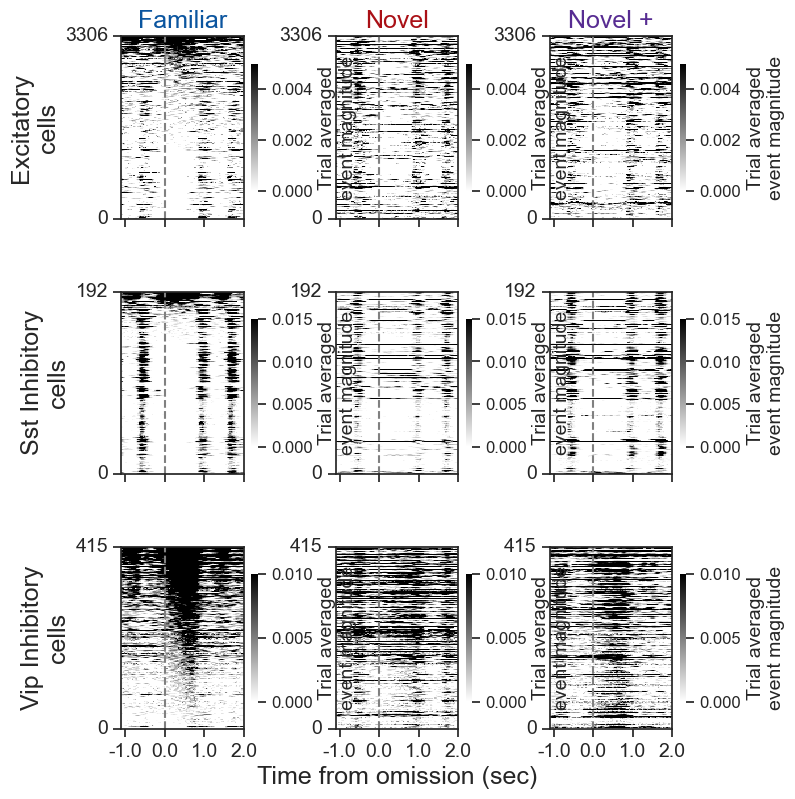

In [113]:
timestamps = omission_mdf.trace_timestamps.values[0]
timestamps = np.asarray([np.round(time,3) for time in timestamps])

matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)
xlim_seconds = [-1.1, 2]

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'omissions', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time from omission (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=True,
                                          cbar_label='Trial averaged\nevent magnitude', save_dir=save_dir, folder=folder, suffix='_cbar', ax=None);


#### Change and omission population averages for each cohort

In [407]:
# compare cell counts for areas & depths after matching over cohorts
import visual_behavior.data_access.utilities as utilities

df = change_mdf.copy()
# limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
matched_oeids = utils.get_experiments_matched_across_project_codes(df)
df = df[df.ophys_experiment_id.isin(matched_oeids)]

utilities.count_mice_expts_containers_cells(df, conditions_to_group=['cell_type', 'project_code', 'binned_depth'], include_matched_cells=True)

n_mouse_id  \
cell_type      project_code             binned_depth               
Excitatory     VisualBehavior           175                    6   
                                        375                    7   
               VisualBehaviorMultiscope 175                    3   
                                        375                    6   
               VisualBehaviorTask1B     175                    7   
                                        375                    6   
Sst Inhibitory VisualBehavior           275                    6   
               VisualBehaviorMultiscope 275                    3   
               VisualBehaviorTask1B     275                    4   
Vip Inhibitory VisualBehavior           175                    6   
               VisualBehaviorMultiscope 175                    3   
               VisualBehaviorTask1B     175                    5   

                                                      n_ophys_session_id  \
cell_type      project_code             binned_depth                       
Excitatory     VisualBehavior           175                           18   
                                        375                           21   
               VisualBehaviorMultiscope 175                            9   
                                        375                           18   
               VisualBehaviorTask1B     175                           21   
                                        375                           18   
Sst Inhibitory VisualBehavior           275                           18   
               VisualBehaviorMultiscope 275                           10   
               VisualBehaviorTask1B     275                           12   
Vip Inhibitory VisualBehavior           175                           18   
               VisualBehaviorMultiscope 175                            9   
               VisualBehaviorTask1B     175                           15   

                                                      n_ophys_experiment_id  \
cell_type      project_code             binned_depth                          
Excitatory     VisualBehavior           175                              18   
                                        375                              21   
               VisualBehaviorMultiscope 175                               9   
                                        375                              18   
               VisualBehaviorTask1B     175                              21   
                                        375                              18   
Sst Inhibitory VisualBehavior           275                              18   
               VisualBehaviorMultiscope 275                              12   
               VisualBehaviorTask1B     275                              12   
Vip Inhibitory VisualBehavior           175                              18   
               VisualBehaviorMultiscope 175                               9   
               VisualBehaviorTask1B     175                              15   

                                                      n_ophys_container_id  \
cell_type      project_code             binned_depth                         
Excitatory     VisualBehavior           175                              6   
                                        375                              7   
               VisualBehaviorMultiscope 175                              3   
                                        375                              6   
               VisualBehaviorTask1B     175                              7   
                                        375                              6   
Sst Inhibitory VisualBehavior           275                              6   
               VisualBehaviorMultiscope 275                              4   
               VisualBehaviorTask1B     275                              4   
Vip Inhibitory VisualBehavior           175                            

189


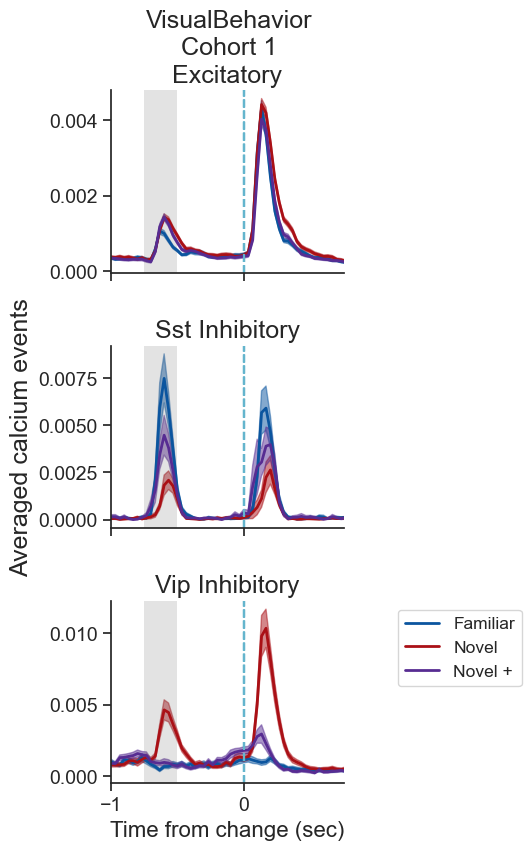

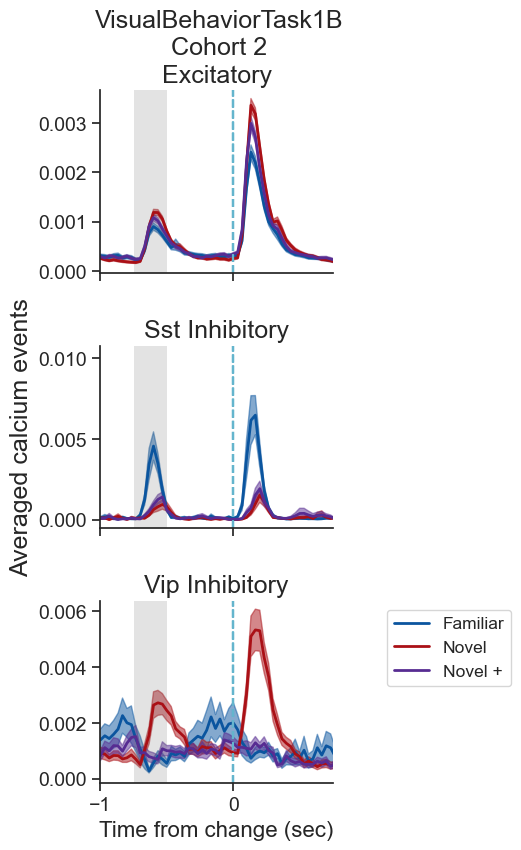

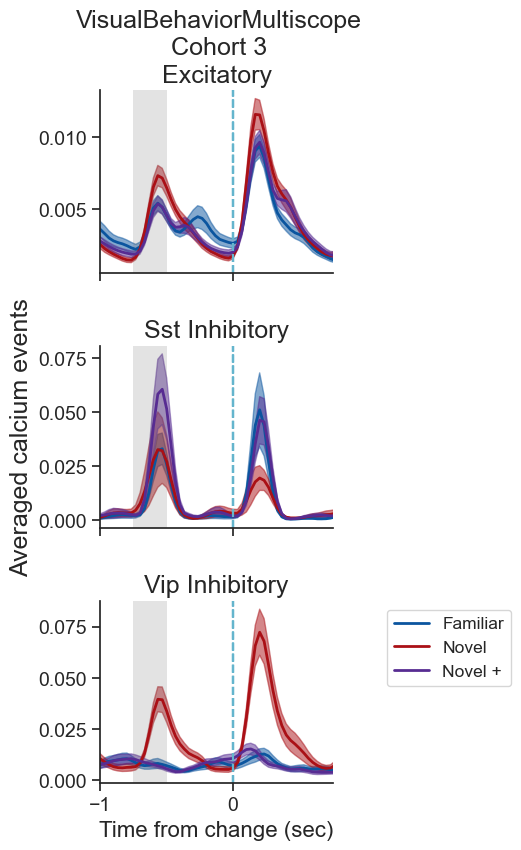

In [416]:

df = change_mdf.copy()
# limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
matched_oeids = utils.get_experiments_matched_across_project_codes(df)
df = df[df.ophys_experiment_id.isin(matched_oeids)]
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1, 0.75]

project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

for i, project_code in enumerate(project_codes): 
    suffix = '_changes_'+project_code
    suptitle = project_code+'\nCohort '+str(i+1)
    tmp = df[df.project_code==project_code]
    tmp = tmp[tmp.mean_response<np.percentile(tmp.mean_response.values, 99.7)]
    ax = ppf.plot_population_averages_for_conditions(tmp, data_type, 'omissions', axes_column, hue_column, 
                                                    ylabel='Averaged calcium events', legend=True,
                                                    horizontal=False, xlabel='Time from change (sec)',
                                                    xlim_seconds=xlim_seconds, interval_sec=1,
                                                    palette=palette, ax=None, title=None, suptitle=suptitle,
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


189


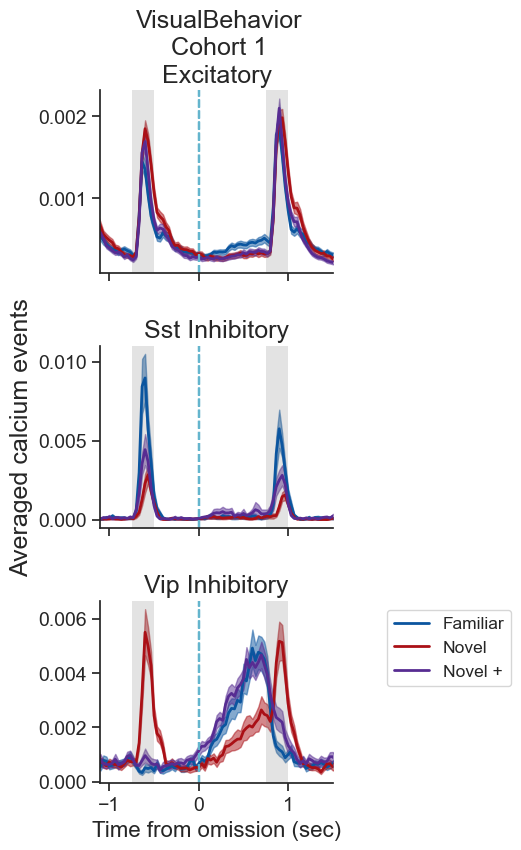

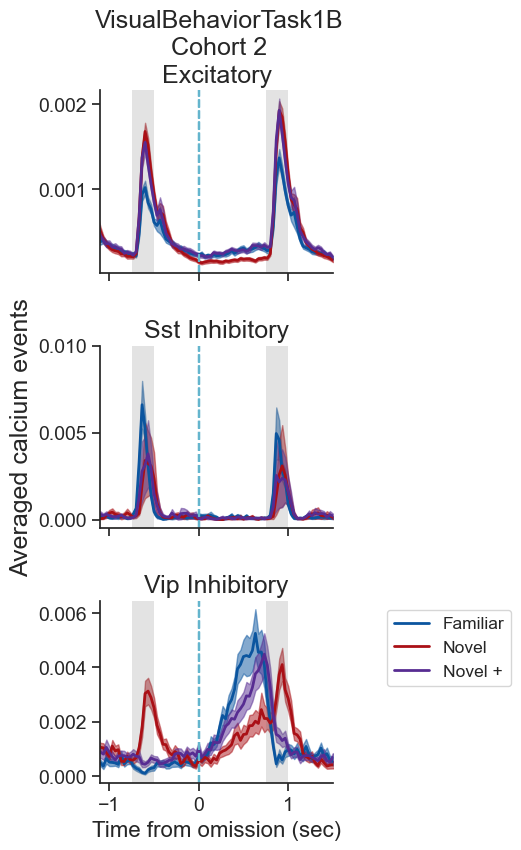

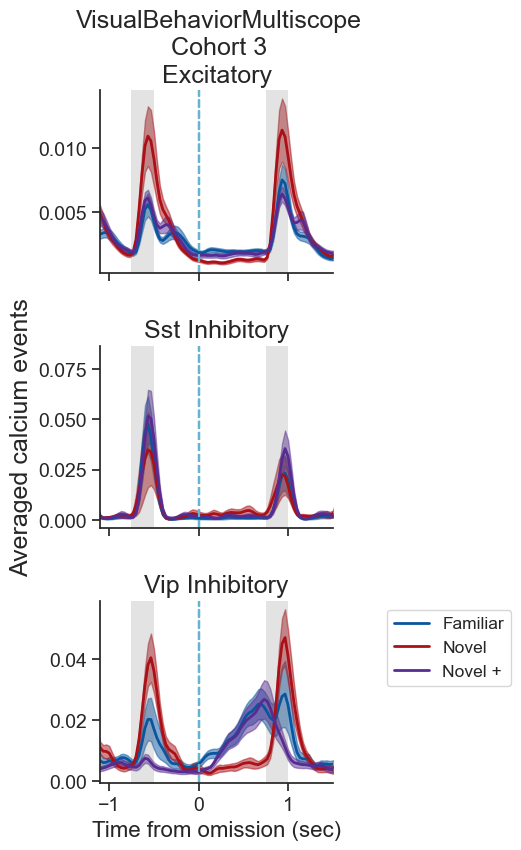

In [408]:

df = omission_mdf.copy()
# limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
matched_oeids = utils.get_experiments_matched_across_project_codes(df)
df = df[df.ophys_experiment_id.isin(matched_oeids)]
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.1, 1.5]

project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

for i, project_code in enumerate(project_codes): 
    suffix = '_omissions_'+project_code
    suptitle = project_code+'\nCohort '+str(i+1)
    tmp = df[df.project_code==project_code]
    tmp = tmp[tmp.mean_response<np.percentile(tmp.mean_response.values, 99.7)]
    ax = ppf.plot_population_averages_for_conditions(tmp, data_type, 'omissions', axes_column, hue_column, 
                                                    ylabel='Averaged calcium events', legend=True,
                                                    horizontal=False, xlabel='Time from omission (sec)',
                                                    xlim_seconds=xlim_seconds, interval_sec=1,
                                                    palette=palette, ax=None, title=None, suptitle=suptitle,
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


### fraction responsive cells 

In [278]:
folder = 'response_metrics'

array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Fraction image responsive cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

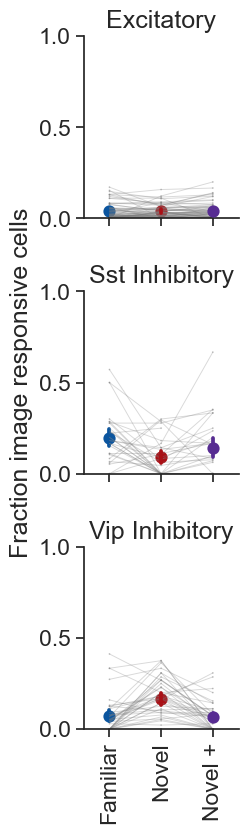

In [116]:
ppf.plot_fraction_responsive_cells(image_mdf, responsiveness_threshold=0.1, ylim=(0,1), ylabel='Fraction image responsive cells',
                                    save_dir=save_dir, folder=folder, suffix='_images', horizontal=False, ax=None)


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Fraction image change responsive cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

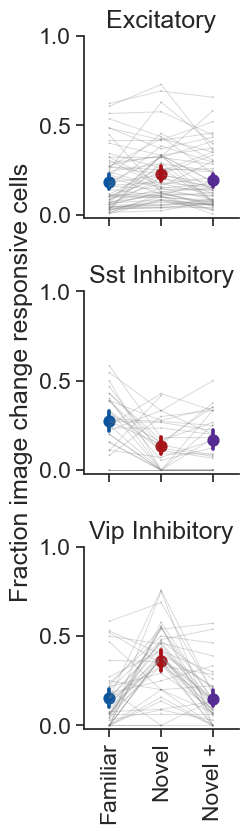

In [117]:
ppf.plot_fraction_responsive_cells(change_mdf, responsiveness_threshold=0.1, ylim=(-0.02, 1), ylabel='Fraction image change responsive cells',
                                    save_dir=save_dir, folder=folder, suffix=change_suffix, horizontal=False, ax=None)


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Fraction omission responsive cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

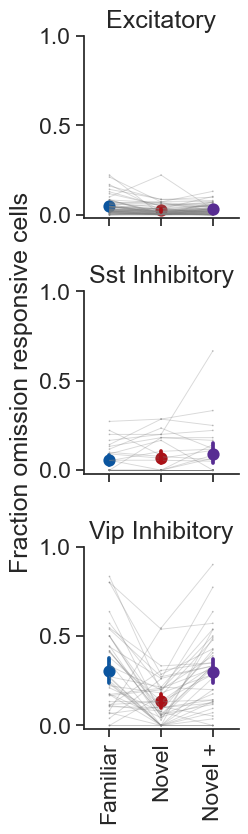

In [118]:
ppf.plot_fraction_responsive_cells(omission_mdf, responsiveness_threshold=0.1, ylim=(-0.02, 1), ylabel='Fraction omission responsive cells',
                                    save_dir=save_dir, folder=folder, suffix=change_suffix, horizontal=False, ax=None)


## Response metrics

In [121]:
metrics_table.keys()

Index(['cell_specimen_id', 'experience_level', 'ophys_experiment_id',
       'mean_response_pref_image', 'reliability_pref_image',
       'fraction_significant_p_value_gray_screen_pref_image',
       'fano_factor_pref_image', 'running_modulation_pref_image',
       'mean_response_all_images', 'lifetime_sparseness_images',
       'reliability_all_images',
       'fraction_significant_p_value_gray_screen_all_images',
       'fano_factor_all_images', 'running_modulation_all_images',
       'mean_response_omissions', 'reliability_omissions',
       'fraction_significant_p_value_gray_screen_omissions',
       'fano_factor_omissions', 'running_modulation_omissions',
       'omission_modulation_index', 'mean_response_changes',
       'mean_response_pre_change', 'lifetime_sparseness_changes',
       'reliability_changes',
       'fraction_significant_p_value_gray_screen_changes',
       'fano_factor_changes', 'running_modulation_changes',
       'change_modulation_index', 'hit_miss_index', 'be

#### Fraction responsive cells with metrics tables

In [417]:
# # fraction responsive cells - changes, pref image

# tmp = metrics_table.copy()
# tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_pref_image

# ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.1, ylim=(-0.02, 1), 
#                                     ylabel='Fraction responsive cells - preferred image',
#                                     save_dir=save_dir, folder=folder, suffix='_pref_stim_images', horizontal=False, ax=None)


In [418]:
# # fraction responsive cells - changes, all images
# tmp = metrics_table.copy()
# tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_changes

# ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.1, ylim=(-0.02, 1), 
#                                     ylabel='Fraction image change responsive cells',
#                                     save_dir=save_dir, folder=folder, suffix='_changes', horizontal=False, ax=None)


In [419]:
# # fraction responsive cells - omissions
# tmp = metrics_table.copy()
# tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_omissions

# ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.1, ylim=(-0.02, 1), 
#                                     ylabel='Fraction omission responsive cells',
#                                     save_dir=save_dir, folder=folder, suffix='_omissions', horizontal=False, ax=None)


### Experience modulation - images

400 experiments in metric_data before merging with cells_table
14493 cells in metric_data before merging with cells_table
400 experiments in metric_data after merging with cells_table
14493 cells in metric_data after merging with cells_table


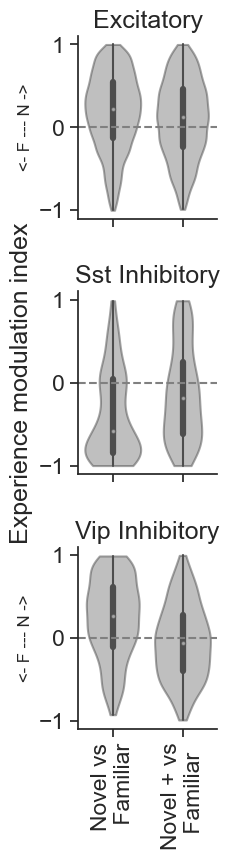

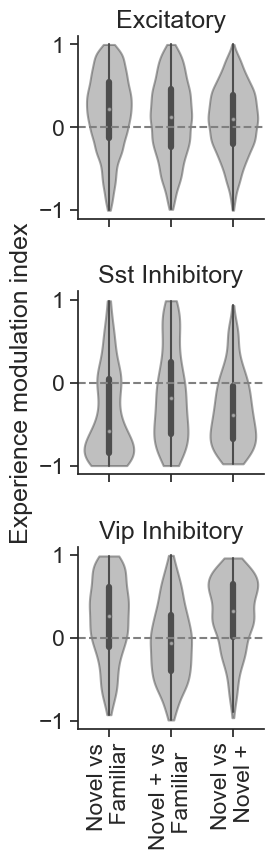

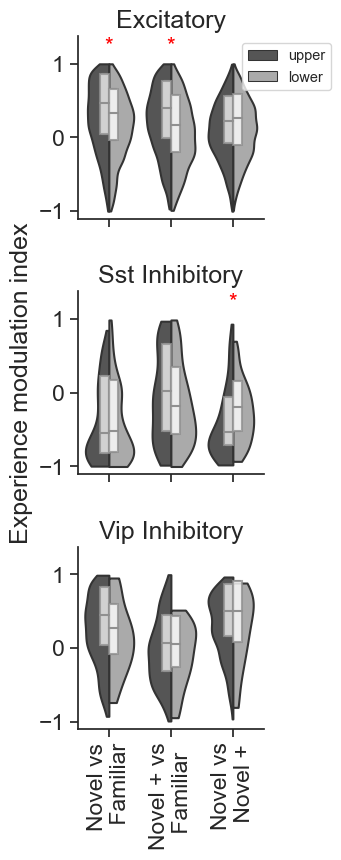

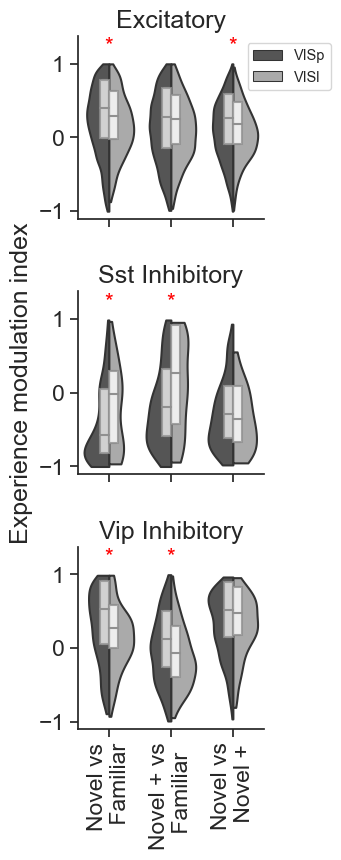

In [420]:
metric = 'mean_response'
event_type = 'images'

exp_mod = cm.compute_experience_modulation_index(image_mdf, metric, platform_cells_table)
exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='pointplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='pointplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

### Experience modulation - changes

400 experiments in metric_data before merging with cells_table
14493 cells in metric_data before merging with cells_table
400 experiments in metric_data after merging with cells_table
14493 cells in metric_data after merging with cells_table


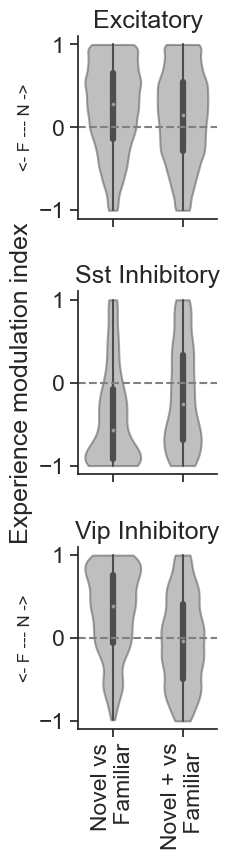

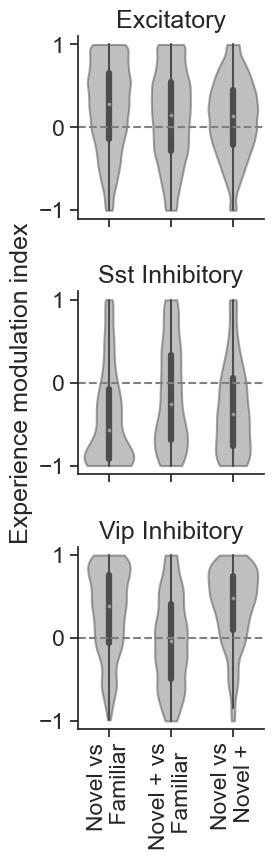

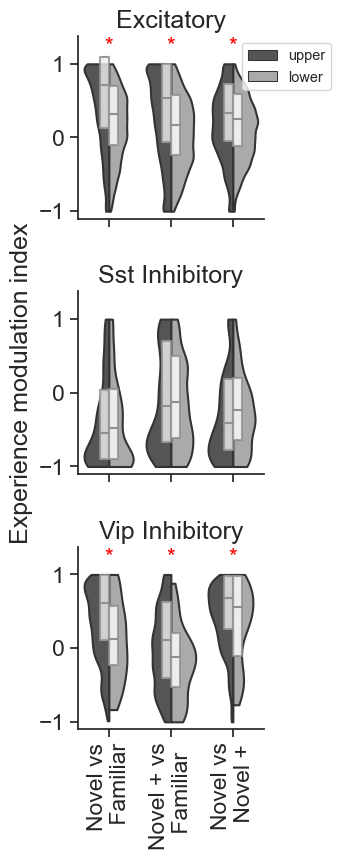

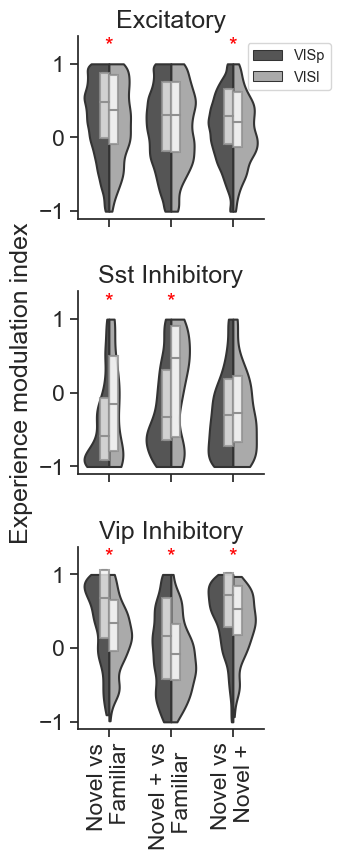

In [421]:
metric = 'mean_response'
event_type = 'changes'

exp_mod = cm.compute_experience_modulation_index(change_mdf, metric, platform_cells_table)


ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='pointplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='pointplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


##### Experience modulation - each cohort - changes

In [423]:
metric = 'mean_response'
event_type = 'changes'

exp_mod = cm.compute_experience_modulation_index(change_mdf, metric, platform_cells_table)

400 experiments in metric_data before merging with cells_table
14493 cells in metric_data before merging with cells_table
400 experiments in metric_data after merging with cells_table
14493 cells in metric_data after merging with cells_table


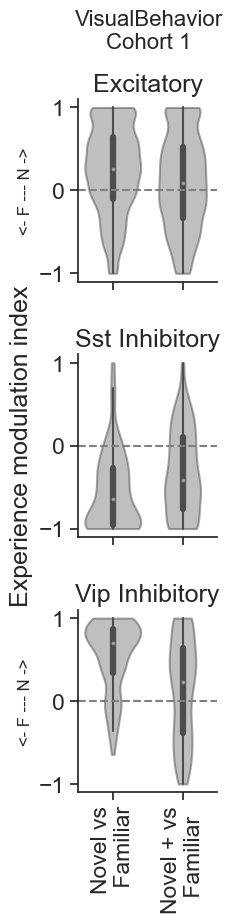

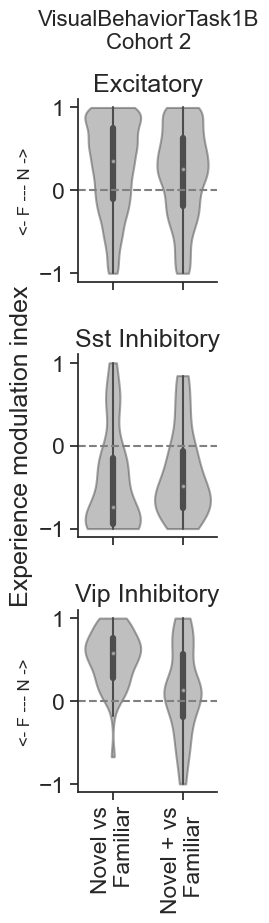

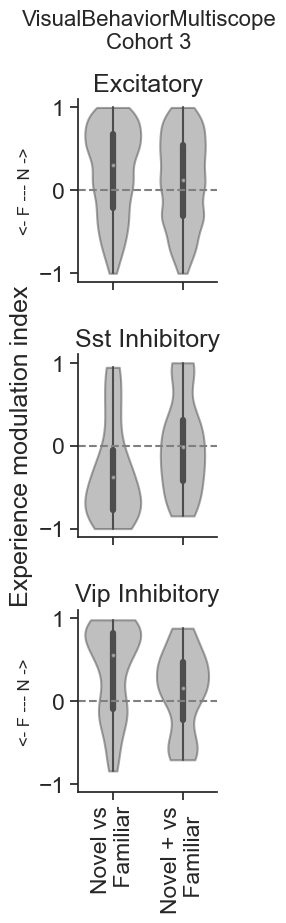

In [424]:
df = exp_mod.copy()
# limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
matched_oeids = utils.get_experiments_matched_across_project_codes(df)
df = df[df.ophys_experiment_id.isin(matched_oeids)]

# each project code
metric = 'mean_response'
event_type = 'changes'

project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

for i, project_code in enumerate(project_codes): 
    suffix = '_changes_'+project_code
    suptitle = project_code+'\nCohort '+str(i+1)
    tmp = df[df.project_code==project_code]

    ppf.plot_experience_modulation_index(tmp, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), 
                                        suptitle=suptitle, suffix=suffix, include_all_comparisons=False, save_dir=save_dir)


#### Experience modulation - compare across cohorts directly

In [360]:
# metric = 'mean_response'
# event_type = 'images'

# exp_mod = cm.compute_experience_modulation_index(image_mdf, metric, platform_cells_table)

# # ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
# # ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


400 experiments in metric_data after merging with cells_table


In [359]:
# def plot_experience_modulation_index(metric_data, event_type, hue=None, plot_type='pointplot', ylims=(-1, 1),
#                                      include_all_comparisons=True, save_dir=None):
#     """
#     plots experience modulation for some event_type, which is the mean repsonse in familiar vs. novel 1 over the sum,
#     and the mean response in novel 1 vs. novel >1 over the sum, giving a value between -1 and 1
#     metric_data is the output of visual_behavior.ophys.response_analysis.cell_metrics.compute_experience_modulation_index()

#     :param metric_data:
#     :param event_type:
#     :param save_dir:
#     :return:
#     """

#     if include_all_comparisons:
#         value_vars = ['Novel vs. Familiar', 'Novel + vs. Familiar',  'Novel vs. Novel +']
#         data = metric_data[['cell_specimen_id', 'Novel vs. Familiar',  'Novel + vs. Familiar', 'Novel vs. Novel +',
#                             'cell_type', 'targeted_structure', 'layer']]
#         xorder = ['Novel vs. Familiar', 'Novel + vs. Familiar', 'Novel vs. Novel +']
#         fig_width = 2.4
#         suffix = '_all_comparisons'
#     else:
#         value_vars = ['Novel vs. Familiar', 'Novel + vs. Familiar', ]
#         data = metric_data[['cell_specimen_id', 'Novel vs. Familiar', 'Novel + vs. Familiar',
#                             'cell_type', 'targeted_structure', 'layer']]
#         xorder = ['Novel vs. Familiar', 'Novel + vs. Familiar']
#         fig_width = 1.8
#         suffix = ''       
        
#     if hue:
#         data = data.melt(id_vars=['cell_specimen_id', 'cell_type', hue], var_name='comparison', value_vars=value_vars)
#     else:
#         data = data.melt(id_vars=['cell_specimen_id', 'cell_type'], var_name='comparison', value_vars=value_vars)

#     metric = 'value'
#     x = 'comparison'

#     cell_types = np.sort(data.cell_type.unique())

#     # colors = utils.get_experience_level_colors()
#     figsize = (fig_width, 9)
#     fig, ax = plt.subplots(3, 1, figsize=figsize, sharex=True, sharey=True)
#     for i, cell_type in enumerate(cell_types):
#         ct_data = data[data.cell_type == cell_type]
#     #     ax[i] = sns.barplot(data=ct_data,  x=x, order=xorder, y=metric, dodge=0.5, ax=ax[i])
#     #     change_width(ax[i], 0.3)
#         if hue:
#             hue_order = np.sort(ct_data[hue].unique())[::-1]
#             suffix = suffix + '_' + hue
#             if plot_type == 'pointplot':
#                 ylims = (-0.5, 0.5)
#                 dodge = 0.1 * (len(ct_data[hue].unique()))
#                 ax[i] = sns.pointplot(data=ct_data, order=xorder, join=False, hue=hue, hue_order=hue_order, dodge=dodge,
#                                       x=x, y=metric, palette='gray', ax=ax[i])
#             elif plot_type == 'boxplot':
#                 ax[i] = sns.boxplot(data=ct_data, order=xorder, hue=hue, hue_order=hue_order, width=0.5, boxprops=dict(alpha=0.8),
#                                     x=x, y=metric, palette='gray', ax=ax[i])
#             elif plot_type == 'violinplot':
#                 ax[i] = sns.violinplot(data=ct_data, order=xorder, cut=0, hue=hue, hue_order=hue_order, inner=None,
#                                        x=x, y=metric, palette='gray', split=True, fill=False, ax=ax[i])
#                 ax2 = ax[i].twinx()
#                 ax2 = sns.boxplot(data=ct_data, order=xorder, hue=hue, hue_order=hue_order, x=x, y=metric, color='white',
#                                     width=0.3, boxprops=dict(alpha=0.8, zorder=2), whis=0, showfliers=False, ax=ax2)
#                 ax2.get_legend().remove()
#                 ax2.axis('off')
#                 ax2.set_ylim(ylims)

#             ax[i].get_legend().remove()
#             ax[i].set_ylim(ylims)

#             # add stats to plot for hues
#             tukey = pd.DataFrame()
#             ax[i], tukey_table = add_stats_to_plot_for_hues(ct_data, metric, ax[i],
#                                                             xorder=xorder, x=x, hue=hue)
#             # ax[i], tukey_table = add_stats_to_plot(ct_data, metric, ax[i], ymax=ymax)
#             # aggregate stats
#             tukey_table['hue'] = hue
#             tukey_table['metric'] = metric
#             tukey_table['cell_type'] = cell_type
#             tukey = pd.concat([tukey, tukey_table])
#         else:
#             if plot_type == 'pointplot':
#                 ax[i] = sns.pointplot(data=ct_data, order=xorder, join=False,
#                                   x=x, y=metric, color='gray', ax=ax[i])
#             elif plot_type == 'boxplot':
#                 ax[i] = sns.boxplot(data=ct_data, order=xorder, width=0.5,  boxprops=dict(alpha=0.8),
#                                       x=x, y=metric, color='gray', ax=ax[i])
#             elif plot_type == 'violinplot':
#                 ax[i] = sns.violinplot(data=ct_data, order=xorder, cut=0,
#                                       x=x, y=metric, color='gray', ax=ax[i])
#                 for violin in ax[i].collections:
#                     violin.set_alpha(0.5)
#             ax[i].set_ylim(ylims)

#         if not hue:
#             ax[i].axhline(y=0, xmin=0, xmax=1, color='gray', linestyle='--')
#         ax[i].set_title(cell_type)
#         ax[i].set_xlabel('')
#         ax[i].set_ylabel('')
#         ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')

#     if hue:
#         ax[0].legend(fontsize='xx-small', title='', bbox_to_anchor=(1.4, 1))
#     ax[1].set_ylabel('Experience modulation index')
#     if xorder == ['Novel vs. Familiar', 'Novel + vs. Familiar']:
#         ax[0].set_ylabel('<- F --- N ->', fontsize=12)
#         ax[2].set_ylabel('<- F --- N ->', fontsize=12)
#     fig.subplots_adjust(hspace=0.4, wspace=0.4)
#     if save_dir:
#         filename = 'experience_modulation_' + event_type + '_' + plot_type + suffix
#         utils.save_figure(fig, figsize, save_dir, 'metric_distributions', filename)


14493

### Mean change response 

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Mean change response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

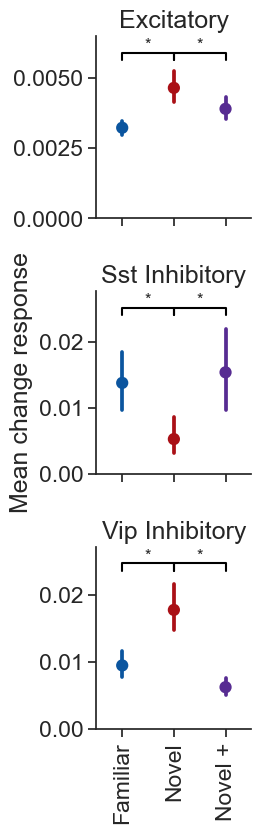

In [316]:
metric = 'mean_response_changes'
ylabel = 'Mean change response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


##### Mean change response for each cohort

saving_stats
saving_stats
saving_stats


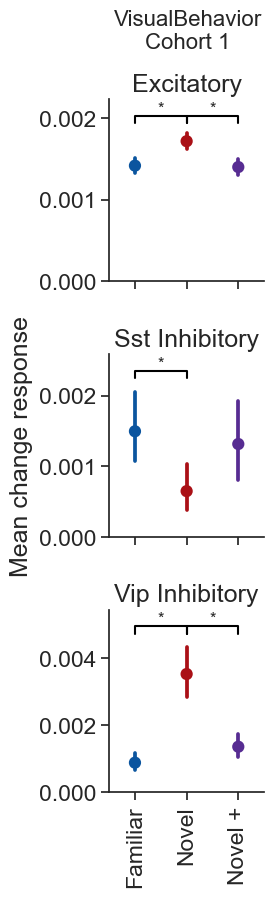

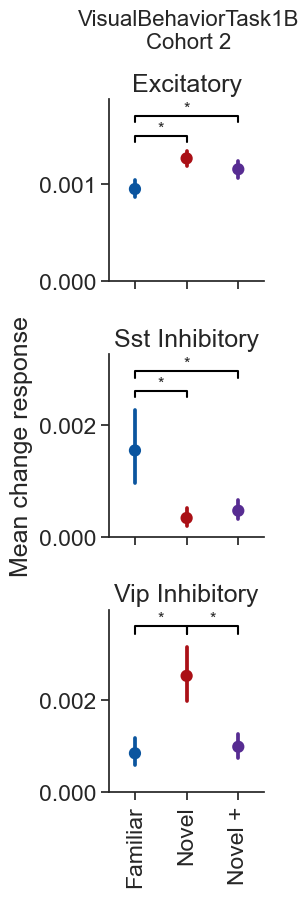

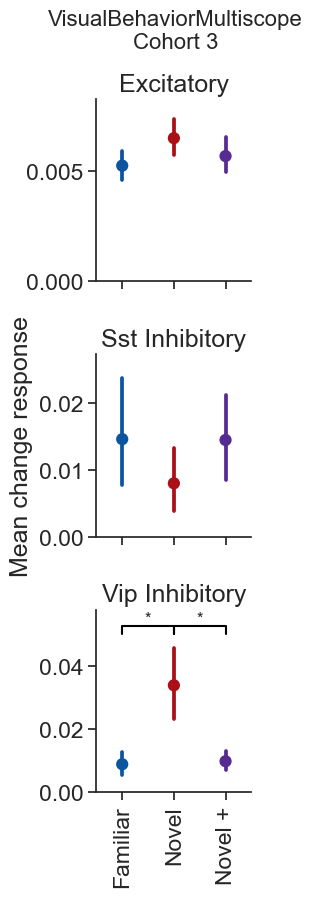

In [425]:
# each project code

metric = 'mean_response_changes'
ylabel = 'Mean change response'

event_type = 'changes'

df = metrics_table.copy()
# limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
matched_oeids = utils.get_experiments_matched_across_project_codes(df)
df = df[df.ophys_experiment_id.isin(matched_oeids)]


ylims = None #(-0.001, 0.025)

project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

for i, project_code in enumerate(project_codes): 
    suffix = '_changes_'+project_code
    suptitle = project_code+'\nCohort '+str(i+1)
    tmp = df[df.project_code==project_code]
    tmp = tmp[tmp[metric]<np.percentile(tmp[metric].values, 99.7)]

    ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                        add_zero_line=False, event_type=event_type, data_type=data_type,
                                        ylabel=ylabel, ylims=ylims, suptitle=suptitle,
                                        suffix=suffix, save_dir=save_dir, ax=None)


##### Mean pre change response

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Mean pre-change response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

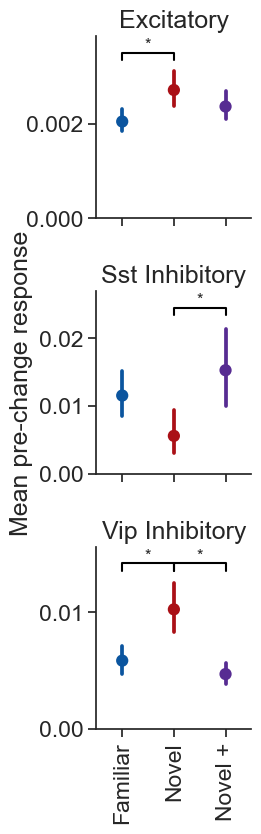

In [317]:
metric = 'mean_response_pre_change'
ylabel = 'Mean pre-change response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


#### Change response by area & depth

saving_stats
saving_stats


saving_stats


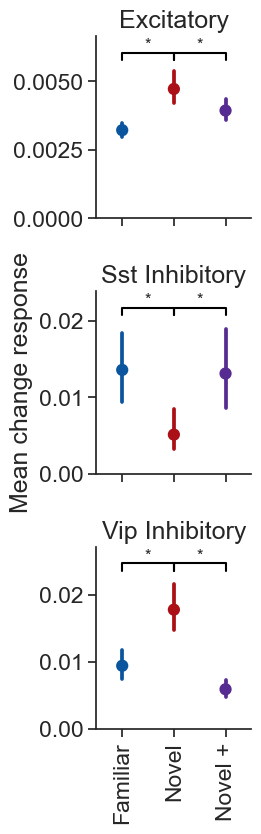

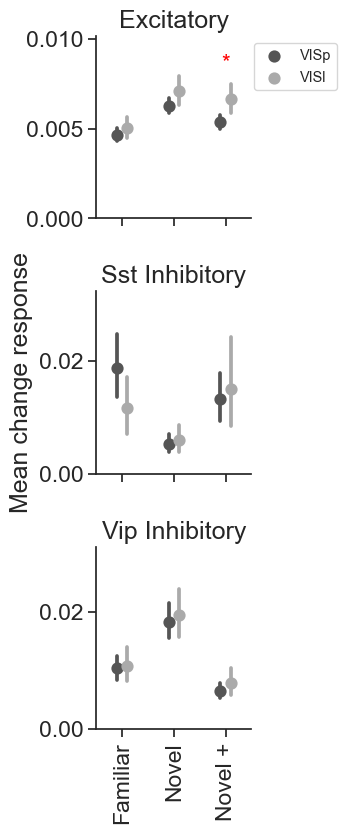

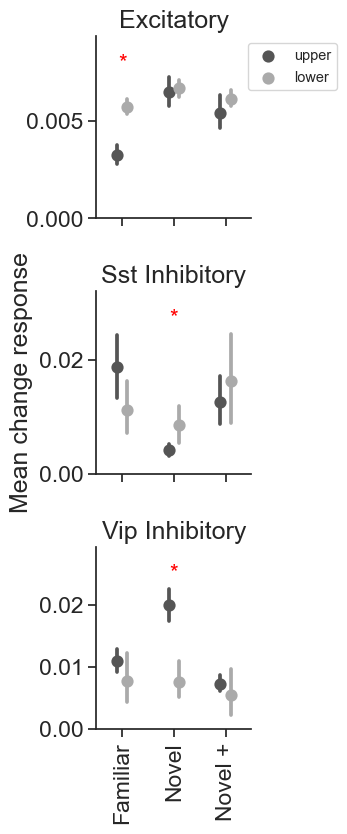

In [334]:
metric = 'mean_response'
ylabel = 'Mean change response'

event_type = 'changes'
data_type = 'filtered_events'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_all_conditions(change_mdf, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            remove_outliers=True, add_zero_line=False, save_dir=save_dir)


##### Change modulation

In [150]:
metrics_table.keys()

Index(['cell_specimen_id', 'experience_level', 'ophys_experiment_id',
       'mean_response_pref_image', 'reliability_pref_image',
       'fraction_significant_p_value_gray_screen_pref_image',
       'fano_factor_pref_image', 'running_modulation_pref_image',
       'mean_response_all_images', 'lifetime_sparseness_images',
       'reliability_all_images',
       'fraction_significant_p_value_gray_screen_all_images',
       'fano_factor_all_images', 'running_modulation_all_images',
       'mean_response_omissions', 'reliability_omissions',
       'fraction_significant_p_value_gray_screen_omissions',
       'fano_factor_omissions', 'running_modulation_omissions',
       'omission_modulation_index', 'mean_response_changes',
       'mean_response_pre_change', 'lifetime_sparseness_changes',
       'reliability_changes',
       'fraction_significant_p_value_gray_screen_changes',
       'fano_factor_changes', 'running_modulation_changes',
       'change_modulation_index', 'hit_miss_index', 'be

In [320]:
folder = 'response_metrics'

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Change modulation index'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

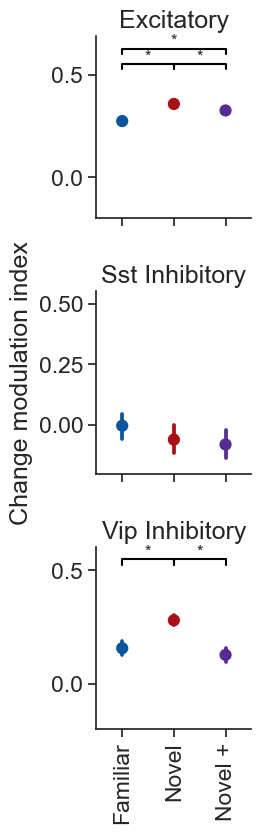

In [337]:
metric = 'change_modulation_index'
ylabel = 'Change modulation index'

event_type = 'changes'

ylims = (-0.2, 0.5)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)


saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Change modulation index'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

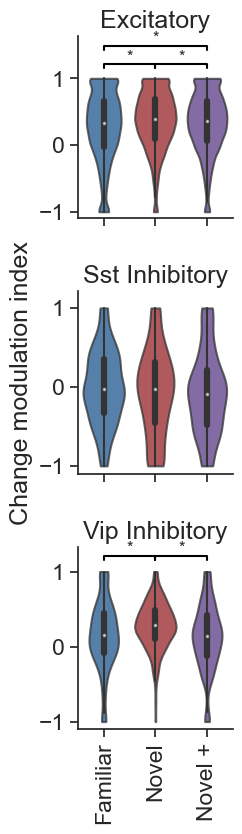

In [326]:
metric = 'change_modulation_index'
ylabel = 'Change modulation index'

event_type = 'changes'

ylims = None #(-0.5, 0.5) #None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

##### Change modulation index by area & depth

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


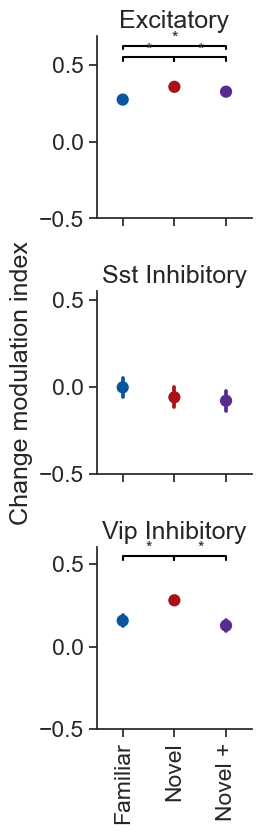

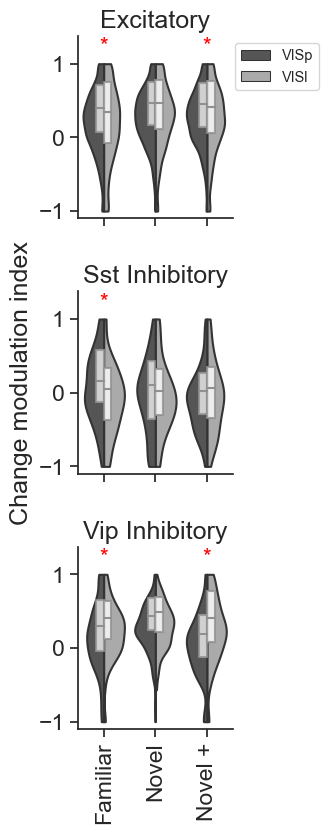

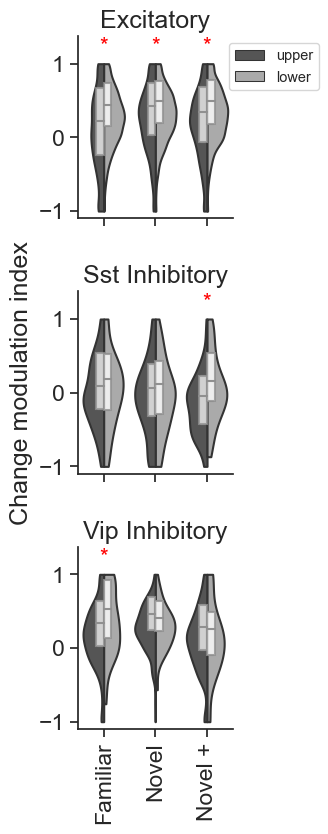

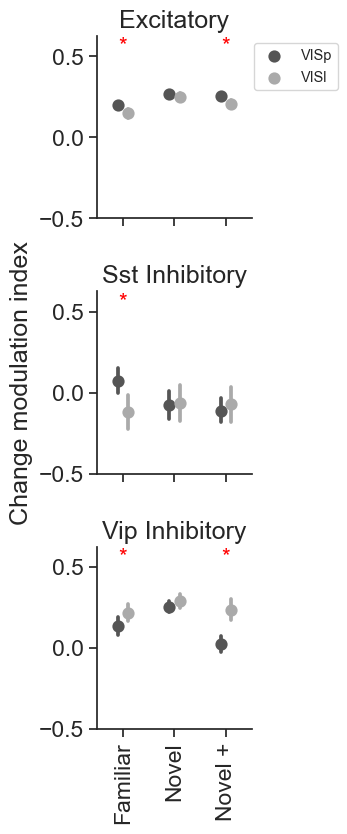

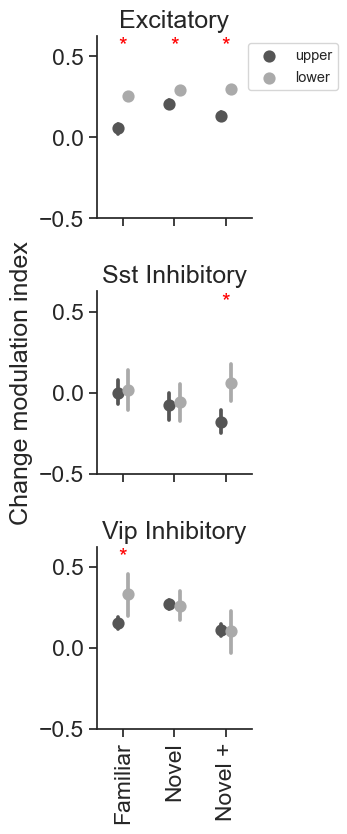

In [338]:
metric = 'change_modulation_index'
ylabel = 'Change modulation index'

event_type = 'changes'
data_type = 'filtered_events'

ylims = None #(-0.5, 0.5) #None #(-0.001, 0.025)

# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot', 
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, save_dir=save_dir)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Choice modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

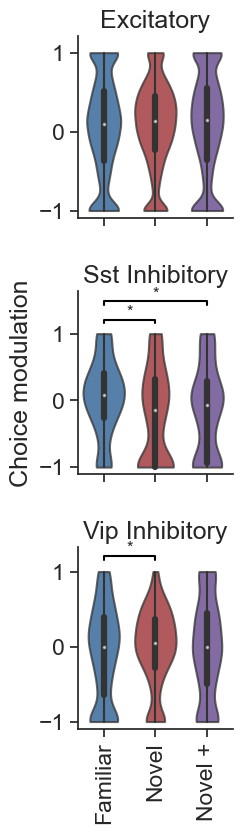

In [328]:
metric = 'hit_miss_index'
ylabel = 'Choice modulation'

event_type = 'changes'


# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=(-0.31, 0.31), save_dir=save_dir, ax=None)


ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=None, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

### Omission responses

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Omission response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

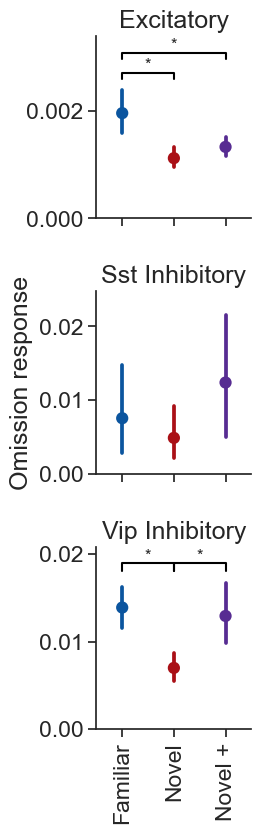

In [426]:
metric = 'mean_response'
ylabel = 'Omission response'

event_type = 'omissions'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(omission_mdf, metric, plot_type='pointplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, remove_outliers=True, save_dir=save_dir)

##### Omission response by cohort

saving_stats
saving_stats
saving_stats


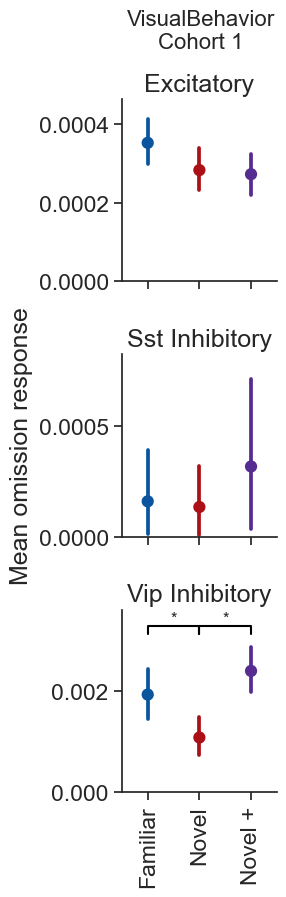

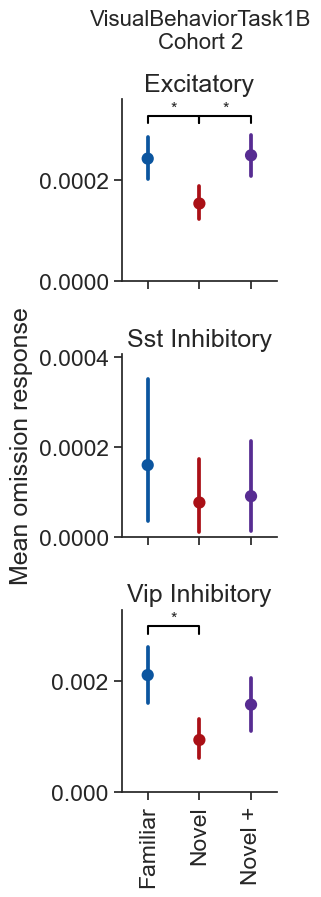

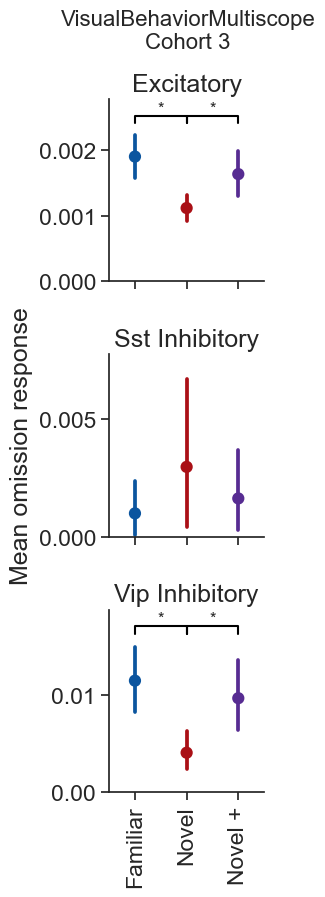

In [427]:
# with omission mdf
metric = 'mean_response'
ylabel = 'Mean omission response'

df = omission_mdf.copy()
# limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
matched_oeids = utils.get_experiments_matched_across_project_codes(df)
df = df[df.ophys_experiment_id.isin(matched_oeids)]

event_type = 'omissions'

ylims = None #(-0.001, 0.025)

project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

for i, project_code in enumerate(project_codes): 
    suffix = '_omissions_'+project_code
    suptitle = project_code+'\nCohort '+str(i+1)
    tmp = df[df.project_code==project_code]
    tmp = tmp[tmp.mean_response<np.percentile(tmp.mean_response.values, 99.7)]
        
    ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot', 
                                            add_zero_line=False, event_type=event_type, data_type=data_type,
                                            suptitle=suptitle, suffix=suffix,
                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, remove_outliers=True, save_dir=save_dir)

In [291]:
# # with metrics table 
# metric = 'mean_response_omissions'
# ylabel = 'Mean omission response'

# df = metrics_table.copy()
# event_type = 'omissions'

# ylims = None #(-0.001, 0.025)

# project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

# for i, project_code in enumerate(project_codes): 
#     suffix = '_omissions_'+project_code
#     suptitle = project_code+'\nCohort '+str(i+1)
#     tmp = df[df.project_code==project_code]
#     tmp = tmp[tmp[metric]<np.percentile(tmp[metric].values, 99.7)]
        
#     ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot', 
#                                             add_zero_line=False, event_type=event_type, data_type=data_type,
#                                             suptitle=suptitle, suffix=suffix,
#                                             ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, remove_outliers=True, save_dir=save_dir)

##### Omission response by area & depth

saving_stats
saving_stats


saving_stats


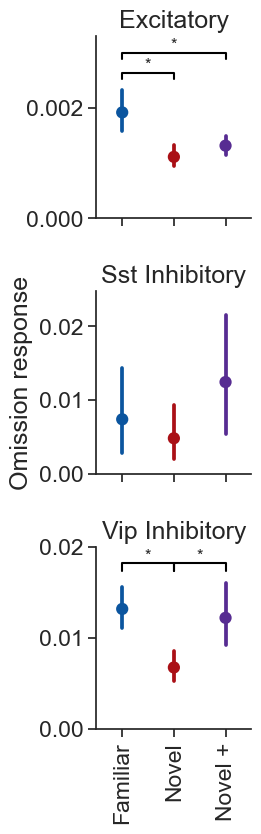

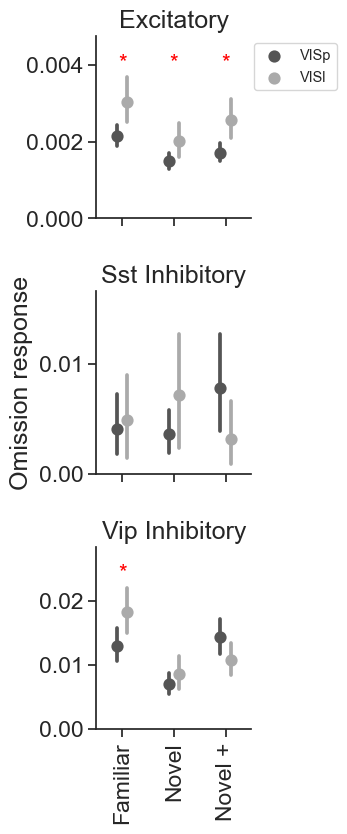

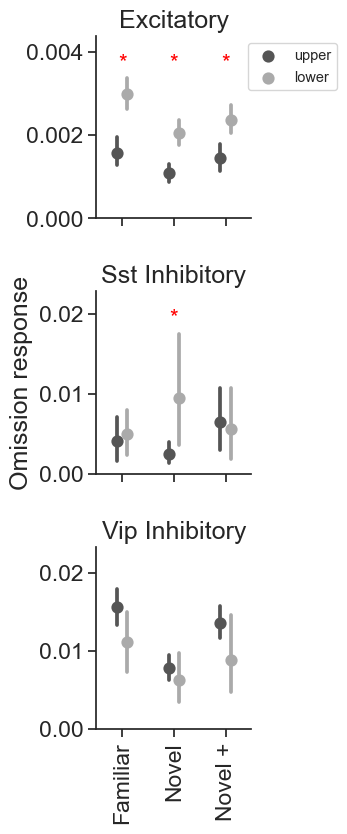

In [429]:
metric = 'mean_response_omissions'
ylabel = 'Omission response'

event_type = 'omissions'
data_type = 'filtered_events'

ylims = None #(-0.001, 0.025)

# ppf.plot_metric_distribution_by_experience(omission_mdf, metric, plot_type='pointplot', 
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, remove_outliers=True, save_dir=save_dir)

401 experiments in metric_data before merging with cells_table
14494 cells in metric_data before merging with cells_table
401 experiments in metric_data after merging with cells_table
14494 cells in metric_data after merging with cells_table


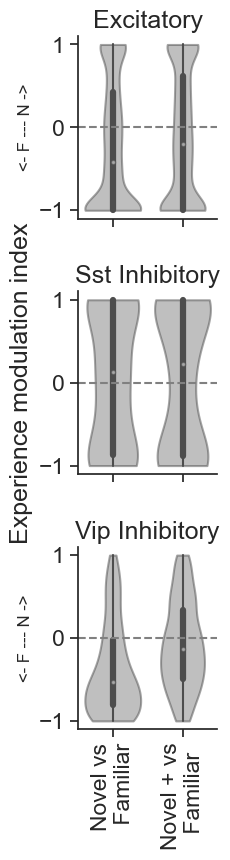

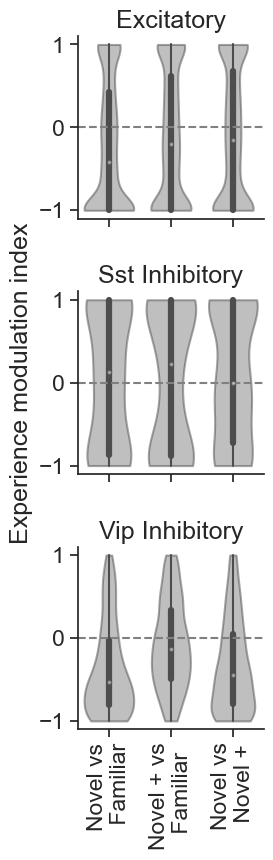

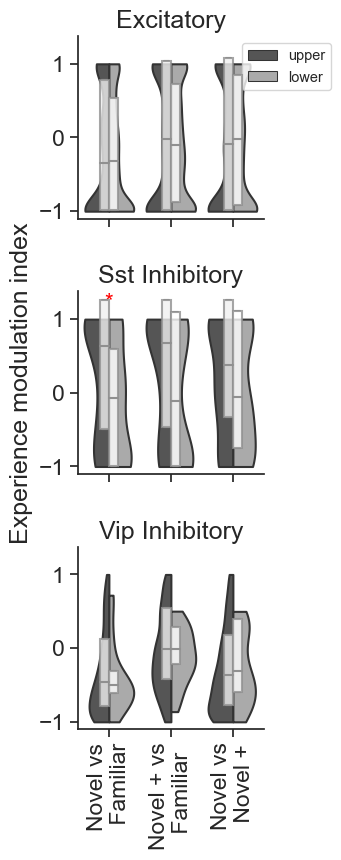

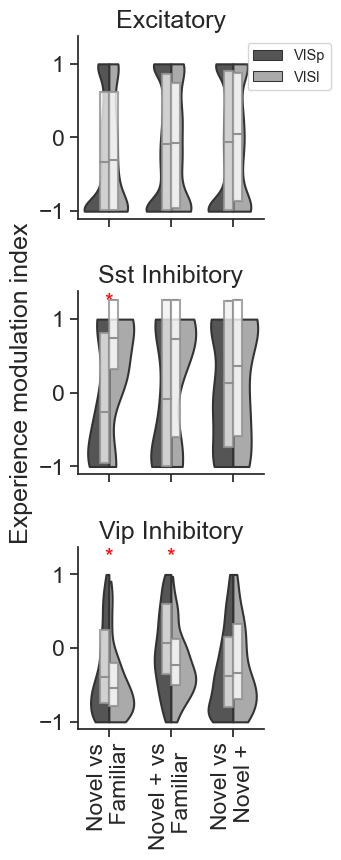

In [430]:
metric = 'mean_response'
event_type = 'omissions'

exp_mod = cm.compute_experience_modulation_index(omission_mdf, metric, platform_cells_table)
exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


In [ ]:
# metric = 'mean_response_omissions'
# ylabel = 'Omission response'

# event_type = 'omissions'

# ylims = None #(-0.001, 0.025)

# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', 
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

In [ ]:
# metric = 'mean_response_omissions'
# event_type = 'omissions'

# exp_mod = cm.compute_experience_modulation_index(metrics_table, metric, platform_cells_table)
# exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


#### Reliability

please provide ylims
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Change response reliability'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

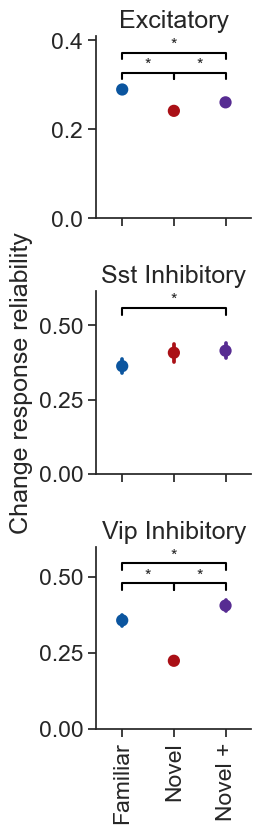

In [346]:
metric = 'reliability_changes'
ylabel = 'Change response reliability'
event_type = 'changes'
data_type = 'filtered_events'

ylims = None

df = metrics_table.copy()

ppf.plot_metric_distribution_by_experience(df, metric, plot_type='pointplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(df, metric, event_type, data_type,
#                     ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)


please provide ylims
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Change response fano factor'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

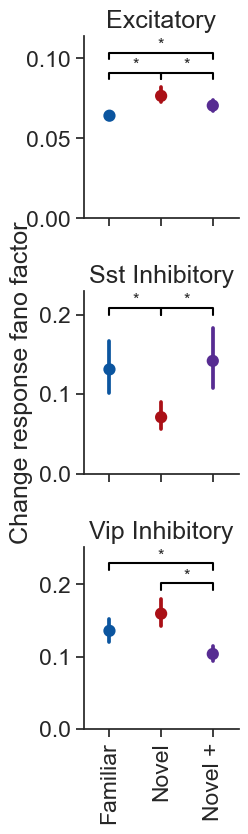

In [347]:
metric = 'fano_factor_changes'
ylabel = 'Change response fano factor'
event_type = 'changes'
data_type = 'filtered_events'

ylims = None

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type,
#                     ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)


#### Running modulation

In [ ]:
metric = 'running_modulation_index_changes'
ylabel = 'Running modulation index'
event_type = 'changes'
data_type = 'filtered_events'

ylims = (-0.6, 0.6)

metrics_table = metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type,
                            ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### Image selectivity 

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - all cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

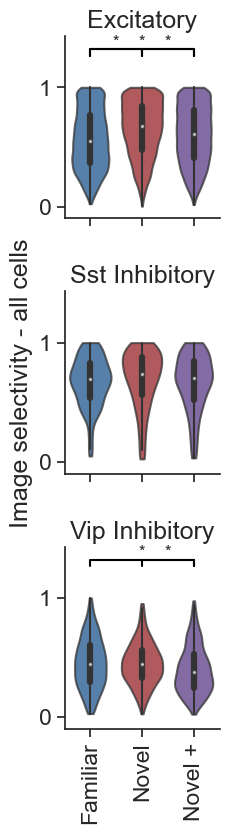

In [ ]:
# all cells 

metric = 'lifetime_sparseness_images'
ylabel = 'Image selectivity - all cells'

event_type = 'images'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - responsive cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

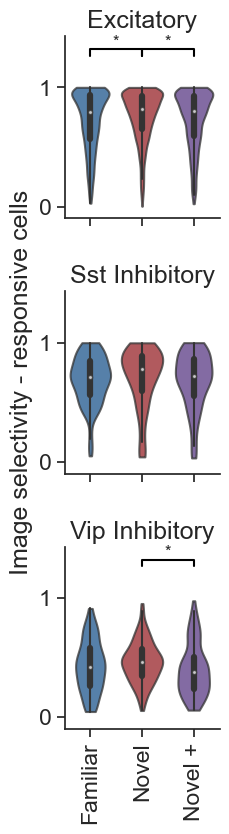

In [ ]:
# responsive cells 

metric = 'lifetime_sparseness_images'
ylabel = 'Image selectivity - responsive cells'

event_type = 'images'

ylims = [-0.1, 1.1]

tmp = metrics_table[metrics_table.fraction_significant_p_value_gray_screen_pref_image>0.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(tmp, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

saving_stats
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - changes, all cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

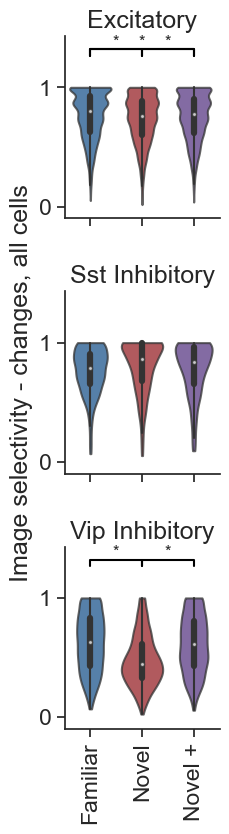

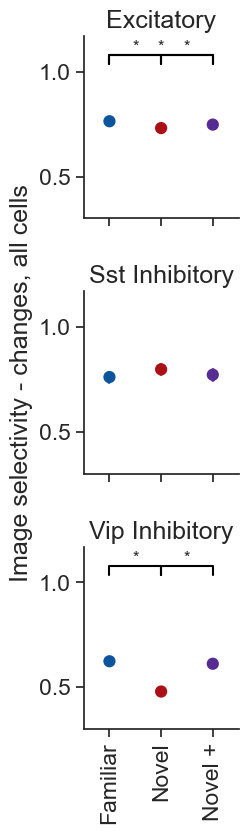

In [ ]:
# all cells 

metric = 'lifetime_sparseness_changes'
ylabel = 'Image selectivity - changes, all cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


saving_stats
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - changes, responsive cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

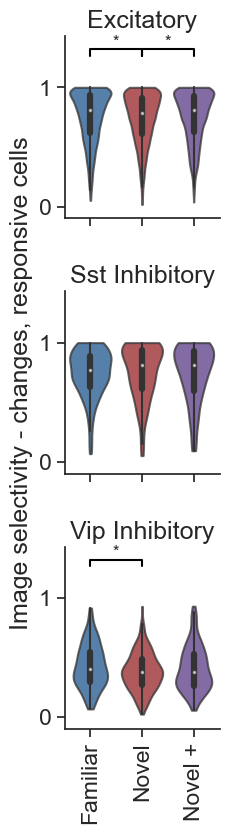

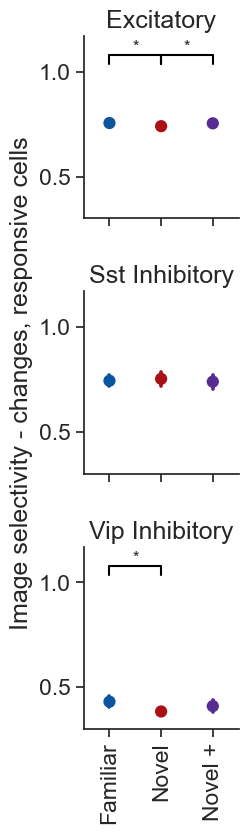

In [ ]:

# responsive cells 

metric = 'lifetime_sparseness_changes'
ylabel = 'Image selectivity - changes, responsive cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

tmpt = metrics_table[metrics_table.fraction_significant_p_value_gray_screen_changes>0.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(tmp, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

#### filter by responsiveness to preferred image for changes

In [ ]:
# # changes
# condition = 'changes'
# stimuli = 'pref_image'
# data_type = 'events'
# change_response_metrics = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)


In [ ]:
metrics_table.keys()

Index(['cell_specimen_id', 'experience_level', 'ophys_experiment_id',
       'mean_response_pref_image', 'reliability_pref_image',
       'fraction_significant_p_value_gray_screen_pref_image',
       'fano_factor_pref_image', 'running_modulation_pref_image',
       'mean_response_all_images', 'lifetime_sparseness_images',
       'reliability_all_images',
       'fraction_significant_p_value_gray_screen_all_images',
       'fano_factor_all_images', 'running_modulation_all_images',
       'mean_response_omissions', 'reliability_omissions',
       'fraction_significant_p_value_gray_screen_omissions',
       'fano_factor_omissions', 'running_modulation_omissions',
       'omission_modulation_index', 'mean_response_changes',
       'mean_response_pre_change', 'lifetime_sparseness_changes',
       'reliability_changes',
       'fraction_significant_p_value_gray_screen_changes',
       'fano_factor_changes', 'running_modulation_changes',
       'change_modulation_index', 'hit_miss_index', 'be

saving_stats
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - changes, all cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

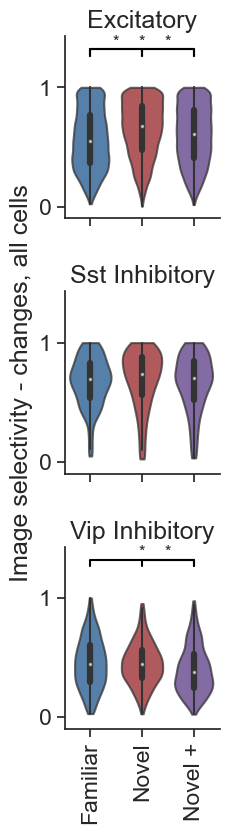

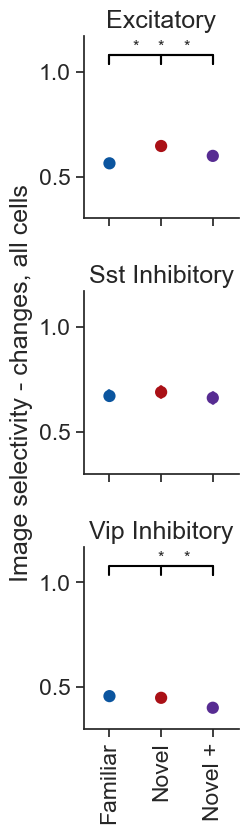

In [ ]:
# all cells

# tmp = change_response_metrics.copy()

tmp = metrics_table.copy()

metric = 'lifetime_sparseness_images'
ylabel = 'Image selectivity - changes, all cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


saving_stats
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - changes, pref image responsive cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

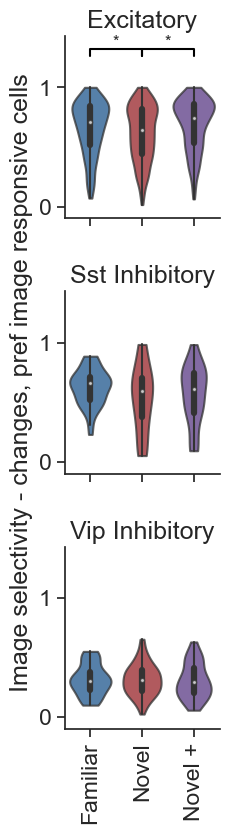

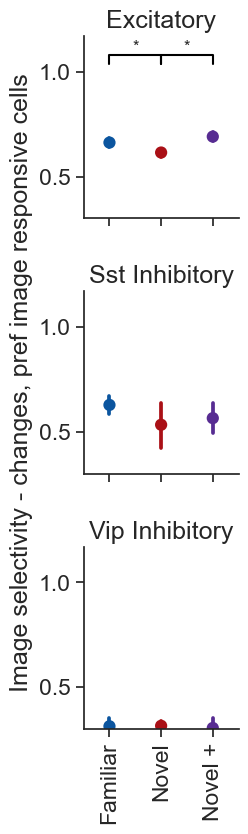

In [ ]:
# responsive cells
tmp = metrics_table.copy()
tmp = tmp[tmp.fraction_significant_p_value_gray_screen_changes>0.2]

metric = 'lifetime_sparseness_changes'
ylabel = 'Image selectivity - changes, pref image responsive cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


## Within session changes

### Changes across epochs

In [175]:
# params for stim response df creation
data_type = 'events'
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change', 'epoch']


suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

change_epoch_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=5)

change_epoch_mdf = change_epoch_mdf[change_epoch_mdf.is_change==True]

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1885 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


In [176]:
len(change_epoch_mdf.ophys_experiment_id.unique())

401

In [177]:
change_epoch_mdf.epoch.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13,  0],
      dtype=int64)

### Omissions across epochs

In [178]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted', 'epoch']


suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

epoch_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=5)
original_epoch_mdf = epoch_mdf.copy()

omission_epoch_mdf = epoch_mdf[epoch_mdf.omitted==True]
image_epoch_mdf = epoch_mdf[epoch_mdf.omitted==False]

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1879 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


In [179]:
omission_epoch_mdf.epoch.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [180]:
len(omission_epoch_mdf.ophys_experiment_id.unique())

401

In [181]:
omission_epoch_mdf.experience_level.unique()

array(['Familiar', 'Novel', 'Novel +'], dtype=object)

In [182]:
## remove truncated last epoch
# omission_epoch_mdf = omission_epoch_mdf[omission_epoch_mdf.epoch!=6]
# image_epoch_mdf = image_epoch_mdf[image_epoch_mdf.epoch!=6]

# omission_epoch_mdf['experience_epoch'] = [omission_epoch_mdf.iloc[row].experience_label + ' - ' + str(omission_epoch_mdf.iloc[row].epoch) for row in omission_epoch_mdf.index.values]
# image_epoch_mdf['experience_epoch'] = [image_epoch_mdf.iloc[row].experience_label + ' - ' + str(image_epoch_mdf.iloc[row].epoch) for row in image_epoch_mdf.index.values]

In [214]:
experience_epoch = np.sort(omission_epoch_mdf.experience_epoch.unique())
experience_epoch = np.sort(omission_epoch_mdf[omission_epoch_mdf.experience_level==experience_levels[0]].experience_epoch.unique())
experience_epoch = np.sort(omission_epoch_mdf.epoch.unique())
print(experience_epoch)

xticks = np.arange(0, len(experience_epoch), 1)
xticklabels = np.arange(0, len(experience_epoch), 1)
# xticklabels = [experience_epoch.split(' ')[1] for experience_epoch in experience_epoch]
xticklabels

[ 0  1  2  3  4  5  6  7  8  9 10 11 12]


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [207]:
omission_epoch_mdf.keys()

Index(['cell_specimen_id', 'omitted', 'epoch', 'mean_response', 'sem_response',
       'mean_trace', 'sem_trace', 'trace_timestamps', 'mean_responses',
       'mean_baseline', 'sem_baseline', 'response_window_duration',
       'fano_factor', 'peak_response', 'time_to_peak', 'p_value',
       'sd_over_baseline', 'fraction_significant_p_value_gray_screen',
       'reliability', 'ophys_experiment_id', 'behavior_session_id',
       'ophys_session_id', 'ophys_container_id', 'mouse_id', 'indicator',
       'full_genotype', 'driver_line', 'cre_line', 'reporter_line', 'sex',
       'age_in_days', 'imaging_depth', 'targeted_structure',
       'targeted_imaging_depth', 'imaging_plane_group', 'project_code',
       'session_type', 'session_number', 'image_set', 'behavior_type',
       'passive', 'experience_level', 'prior_exposures_to_session_type',
       'prior_exposures_to_image_set', 'prior_exposures_to_omissions',
       'date_of_acquisition', 'equipment_name', 'published_at',
       'isi_ex

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:301: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  epoch_df['experience_epoch'] = epoch_df[['experience_level', 'epoch']].apply(axis=1, func=merge_experience_epoch)


[ 0  1  2  3  4  5  6  7  8  9 10 11]
Excitatory
Sst Inhibitory
Vip Inhibitory


array([<AxesSubplot:title={'center':'Excitatory'}, xlabel='epoch within session', ylabel='Mean omission response'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='epoch within session', ylabel='Mean omission response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, xlabel='epoch within session', ylabel='Mean omission response'>],
      dtype=object)

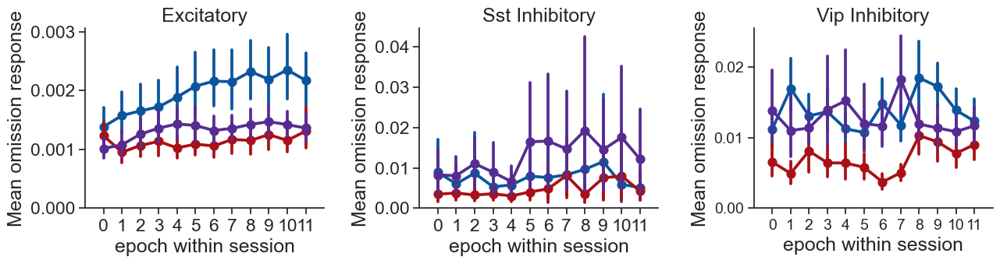

In [218]:
# plot for all cells within each cre line
suffix = '_omission_within_session'
ppf.plot_mean_response_by_epoch(omission_epoch_mdf, metric='mean_response', horizontal=True, ymin=0, ylabel='Mean omission response', estimator=np.mean,
                                save_dir=save_dir, folder='epochs', max_epoch=11, suptitle=None, suffix=suffix, ax=None)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:301: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  epoch_df['experience_epoch'] = epoch_df[['experience_level', 'epoch']].apply(axis=1, func=merge_experience_epoch)


[ 0  1  2  3  4  5  6  7  8  9 10 11]
Excitatory
Sst Inhibitory
Vip Inhibitory


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Mean response'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Mean response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, xlabel='epoch within session', ylabel='Mean response'>],
      dtype=object)

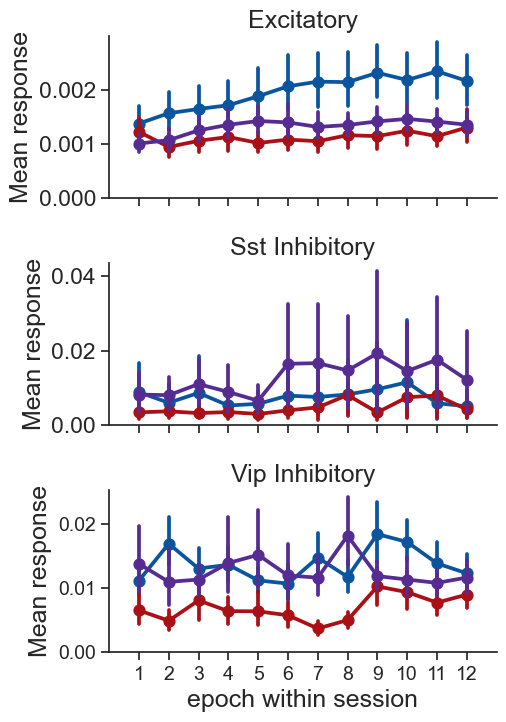

In [220]:
# plot for all cells within each cre line
suffix = '_omission_within_session'
ppf.plot_mean_response_by_epoch(omission_epoch_mdf, metric='mean_response', horizontal=False, ymin=0, ylabel='Mean response', estimator=np.mean,
                                save_dir=save_dir, folder='epochs', max_epoch=11, suptitle=None, suffix=suffix, ax=None)

#### all images within session

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:301: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  epoch_df['experience_epoch'] = epoch_df[['experience_level', 'epoch']].apply(axis=1, func=merge_experience_epoch)


[ 0  1  2  3  4  5  6  7  8  9 10 11]
Excitatory
Sst Inhibitory
Vip Inhibitory


array([<AxesSubplot:title={'center':'Excitatory'}, xlabel='epoch within session', ylabel='event magnitude'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='epoch within session', ylabel='event magnitude'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, xlabel='epoch within session', ylabel='event magnitude'>],
      dtype=object)

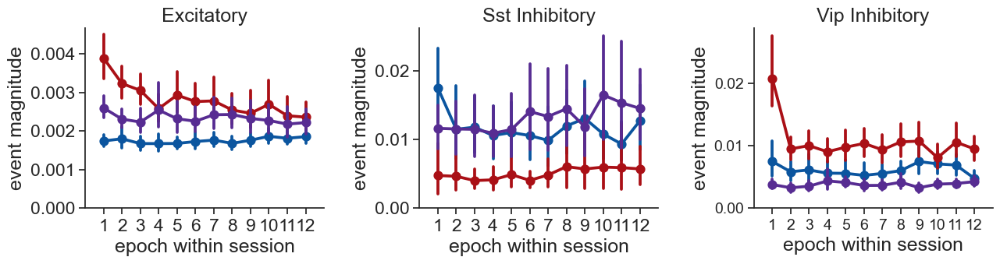

In [221]:
# plot for all cells within each cre line
suffix = '_images_within_session'
ppf.plot_mean_response_by_epoch(image_epoch_mdf, metric='mean_response', horizontal=True, ymin=0, ylabel='event magnitude', estimator=np.mean,
                                save_dir=save_dir, folder='epochs', max_epoch=11, suptitle=None, suffix=suffix, ax=None)

## Population averages for active/passive

In [222]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']

inclusion_criteria = 'None'

passive_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.omitted==True]

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_omitted_None.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_omitted_None.pkl


there are 1879 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 1878 experiments after filtering for inclusion criteria -  None


#### limit to containers in the main platform study

In [233]:
platform_containers = platform_experiments.ophys_container_id.unique()
print(len(platform_containers))

passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.ophys_container_id.isin(platform_containers)]

134


In [234]:
passive_omission_mdf.experience_level.unique()

array(['Familiar', 'Novel', 'Novel +'], dtype=object)

In [235]:
passive_expts = passive_omission_mdf.copy()
# limit to passive sessions, but keep the first novel session to count against
passive_expts = passive_expts[(passive_expts.passive==True)|(passive_expts.experience_level=='Novel')].copy()
# add column indicating session number relative to first novel session
passive_expts = utilities.add_n_relative_to_first_novel_column(passive_expts)
# identify the familiar session prior to novel session that is passive
passive_expts = utilities.add_last_familiar_column(passive_expts)
# identify the second novel session that is passive
passive_expts = utilities.add_second_novel_column(passive_expts)

In [236]:
conditions_to_group=['full_genotype', 'passive', 'second_novel', 'last_familiar']

utilities.count_mice_expts_containers_cells(passive_expts, conditions_to_group, include_matched_cells=False)

n_mouse_id  \
full_genotype                                      passive second_novel last_familiar               
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                  34   
                                                   True    False        False                  34   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                  15   
                                                   True    False        False                  15   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                  17   
                                                   True    False        False                  17   

                                                                                       n_ophys_session_id  \
full_genotype                                      passive second_novel last_familiar                       
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                          34   
                                                   True    False        False                          67   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                          15   
                                                   True    False        False                          30   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                          17   
                                                   True    False        False                          32   

                                                                                       n_ophys_experiment_id  \
full_genotype                                      passive second_novel last_familiar                          
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                             62   
                                                   True    False        False                            114   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                             30   
                                                   True    False        False                             50   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                             42   
                                                   True    False        False                             70   

                                                                                       n_ophys_container_id  \
full_genotype                                      passive second_novel last_familiar                         
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                            62   
                                                   True    False        False                            62   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                            30   
                                                   True    False        False                            30   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                            42   
                                                   True    False        False                            42   

                                                                                       n_cell_specimen_id  
full_genotype                                      passive second_novel last_familiar                      
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                        7974  
                                                   True    False        False                       10291  
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                         337  
                                                   True    False        False  

In [237]:
# limit to closest familiar and novel passive sessions to the first novel session
passive_expts = passive_expts[(passive_expts.last_familiar==True)|(passive_expts.second_novel==True)].copy()

In [238]:
len(passive_expts)

0

In [239]:
conditions_to_group=['full_genotype', 'passive', 'second_novel', 'last_familiar']

utilities.count_mice_expts_containers_cells(passive_expts, conditions_to_group, include_matched_cells=False)

,,,,n_mouse_id,n_ophys_session_id,n_ophys_experiment_id,n_ophys_container_id,n_cell_specimen_id
full_genotype,passive,second_novel,last_familiar,,,,,


In [240]:
print(len(passive_omission_mdf.mouse_id.unique()))
print(len(passive_omission_mdf.ophys_experiment_id.unique()))

66
853


In [241]:
print(len(passive_omission_mdf.mouse_id.unique()), 'mice')
print(len(passive_omission_mdf.ophys_container_id.unique()), 'containers')
print(len(passive_omission_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(passive_omission_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
853 experiments
19874 cells


In [242]:
conditions_to_group=['full_genotype', 'passive']

utilities.count_mice_expts_containers_cells(passive_omission_mdf, conditions_to_group, include_matched_cells=False)

n_mouse_id  \
full_genotype                                      passive               
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False            34   
                                                   True             34   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False            15   
                                                   True             15   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False            17   
                                                   True             17   

                                                            n_ophys_session_id  \
full_genotype                                      passive                       
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                   157   
                                                   True                     67   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                    73   
                                                   True                     30   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                    86   
                                                   True                     32   

                                                            n_ophys_experiment_id  \
full_genotype                                      passive                          
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                      277   
                                                   True                       114   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      143   
                                                   True                        50   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      199   
                                                   True                        70   

                                                            n_ophys_container_id  \
full_genotype                                      passive                         
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                      62   
                                                   True                       62   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      30   
                                                   True                       30   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      42   
                                                   True                       42   

                                                            n_cell_specimen_id  
full_genotype                                      passive                      
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                 15305  
                                                   True                  10291  
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                   562  
                                                   True                    403  
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                  1429  
                                                   True                    876

In [194]:
# # limit to mice in platform expts
# passive_omission_mdf.mouse_id = [int(mouse_id) for mouse_id in passive_omission_mdf.mouse_id.values]

# passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.mouse_id.isin(platform_expts.mouse_id.unique())]
# print(len(passive_omission_mdf.mouse_id.unique()))

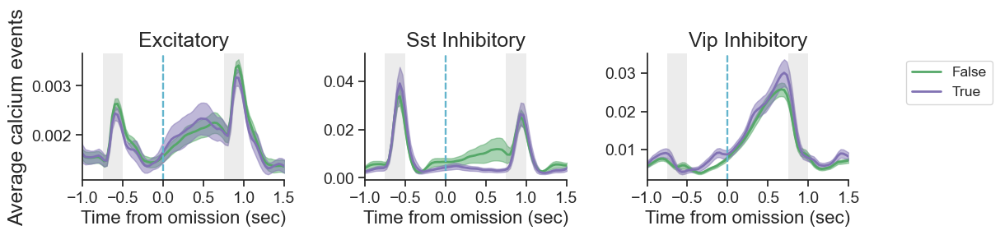

In [243]:
df = passive_omission_mdf.copy()
df = df[df.experience_level=='Familiar']

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions', axes_column, hue_column, 
                                                 horizontal=True, ylabel='Average calcium events',
                                                 xlabel='Time from omission (sec)', xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)


In [244]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']

passive_change_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, 'containers_with_all_levels', 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

passive_change_mdf = passive_change_mdf[passive_change_mdf.is_change==True]

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_containers_with_all_levels.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_is_change_containers_with_all_levels.pkl


there are 1881 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 1378 experiments after filtering for inclusion criteria -  containers_with_all_levels


In [246]:
# limit to mice in platform expts
passive_change_mdf.mouse_id = [int(mouse_id) for mouse_id in passive_change_mdf.mouse_id.values]

passive_change_mdf = passive_change_mdf[passive_change_mdf.mouse_id.isin(platform_experiments.mouse_id.unique())]
print(len(passive_change_mdf.mouse_id.unique()))

66


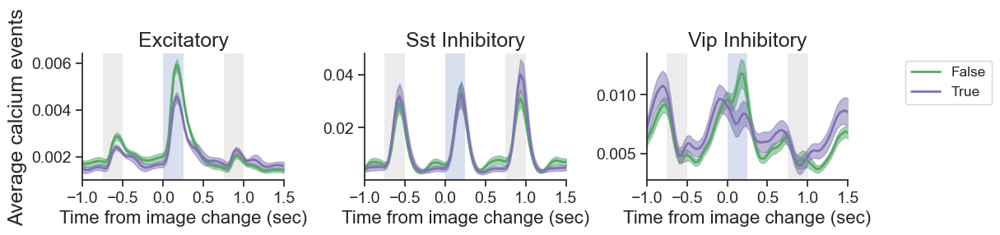

In [248]:
df = passive_change_mdf.copy()
df = df[df.experience_level=='Familiar']

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, 
                                                 horizontal=True, ylabel='Average calcium events',
                                                xlabel='Time from image change (sec)', xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)

### get cell metrics table for changes

In [251]:
import visual_behavior.ophys.response_analysis.cell_metrics as cm
import visual_behavior.dimensionality_reduction.clustering.processing as processing

In [252]:
experiments_table = platform_experiments.copy()

In [ ]:
# ophys_experiment_ids = experiments_table.index.values

# condition = 'changes'
# stimuli = 'all_images'
# session_subset = 'full_session'
    
# inclusion_criteria = 'platform_experiments'

# # metrics_table = processing.generate_merged_table_of_model_free_metrics(data_type='events', session_subset='full_session',
# #                                                 inclusion_criteria='platform_experiment_table', save_dir=save_dir)

# # original_metrics_table = metrics_table.copy()
# change_metrics_table = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

loading model free metrics table


In [253]:
print(len(metrics_table.ophys_experiment_id.unique()))

402


In [254]:
len(metrics_table.cell_specimen_id.unique())

14495

### save descriptive statistics for all metrics

In [ ]:
# conditions = ['cell_type', 'experience_level']
# filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
# metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)

# conditions = ['cell_type', 'experience_level', 'targeted_structure']
# filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
# metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)


# conditions = ['cell_type', 'experience_level', 'layer']
# filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
# metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)


# conditions = ['cell_type', 'experience_level', 'targeted_structure', 'layer']
# filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
# metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)

In [ ]:
# metrics_stats = load_descriptive_stats_for_conditions(conditions, save_dir, filename)

### plotting

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='change response'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='change response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, ylabel='change response'>],
      dtype=object)

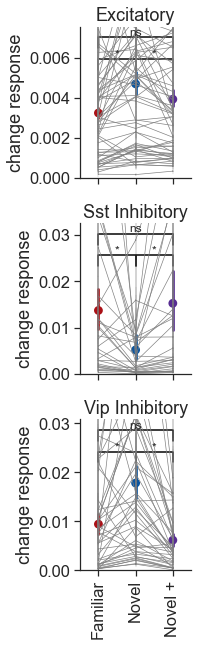

In [ ]:
metric = 'mean_response_changes'
ylabel = 'Mean change response'
event_type = 'changes'

ppf.plot_metric_distribution_by_experience(change_metrics_table, metric, event_type, stripplot=False, pointplot=True, add_zero_line=False,
                                       show_containers=True, ylabel=ylabel, ylims=None, save_dir=save_dir, ax=None) #ylims=(-0.001, 0.025)


### change response

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


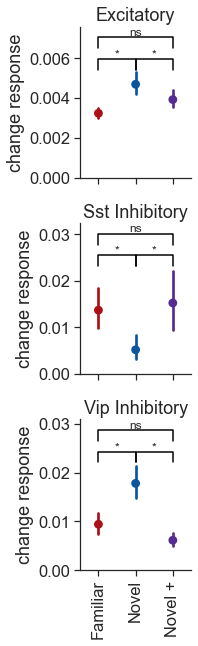

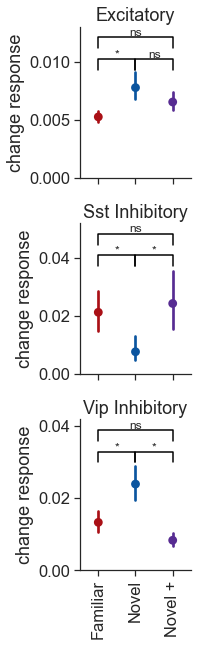

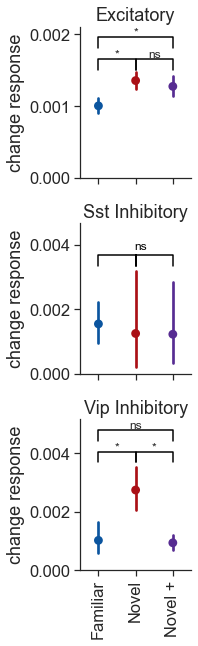

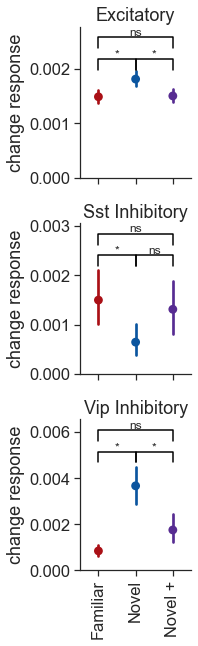

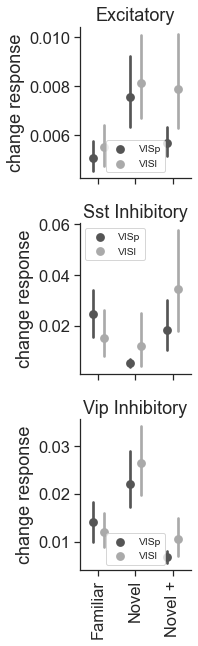

...

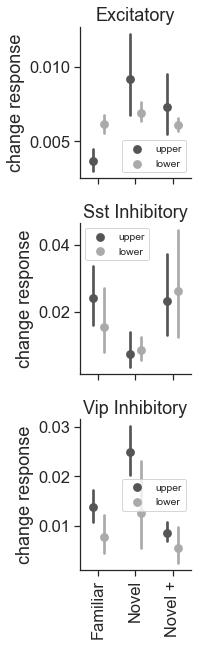

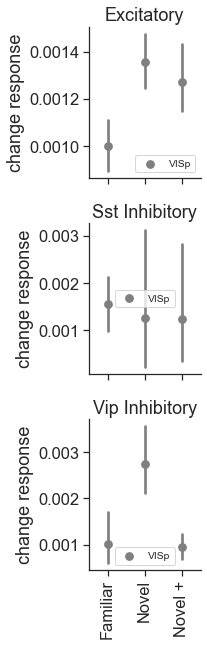

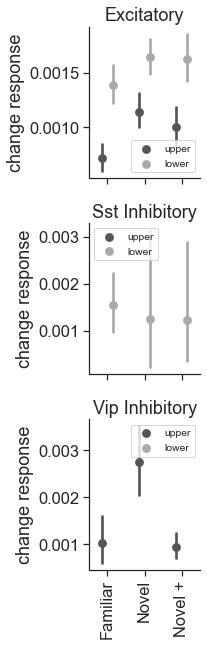

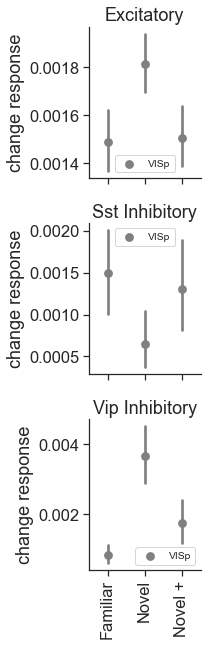

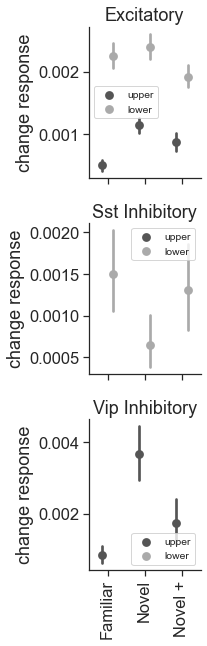

In [ ]:
# mean response across experience levels 
metric = 'change_response'
ylabel = 'change response'
ylabel = 'event magnitude'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel='change response', ylims=ylims, add_zero_line=False, save_dir=save_dir)

### pre-change response

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


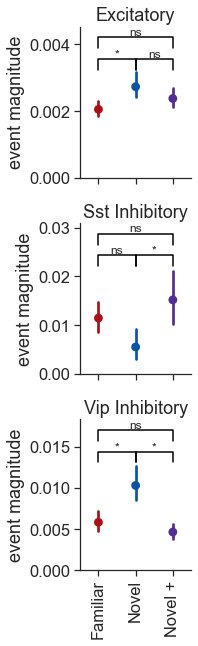

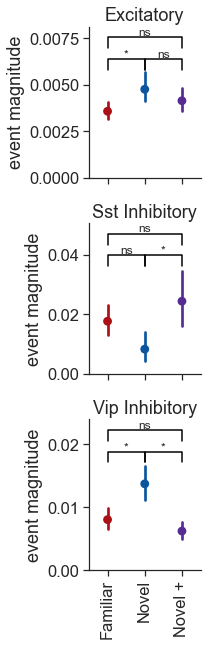

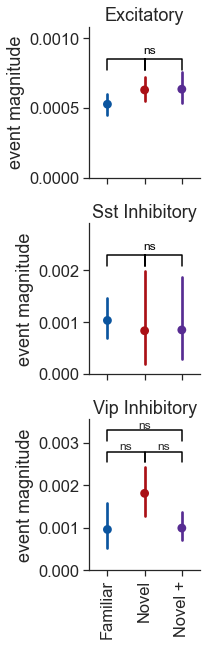

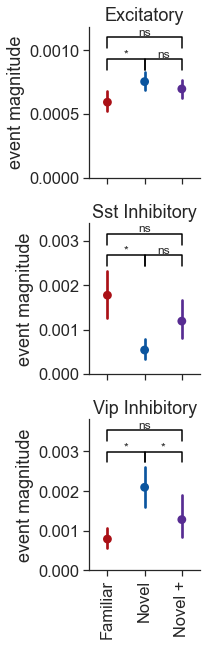

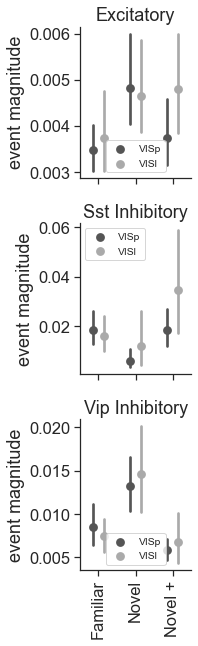

...

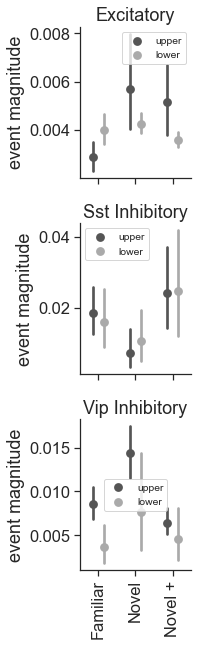

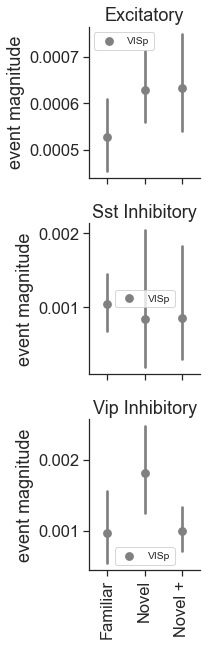

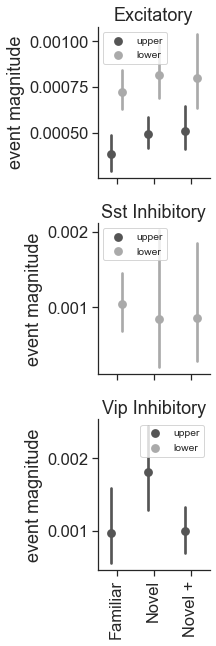

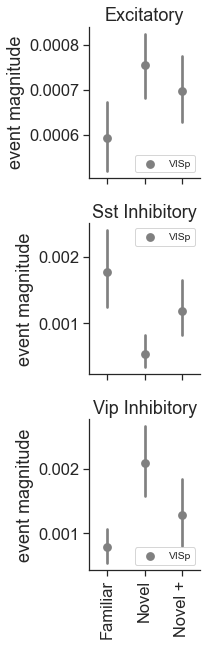

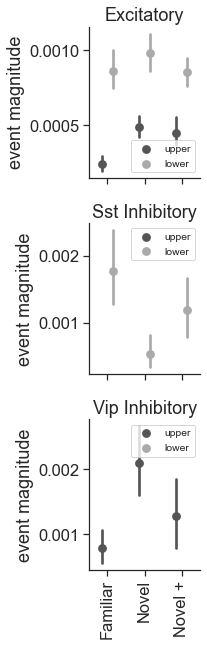

In [ ]:
# mean response across experience levels 
metric = 'pre_change_response'
ylabel = 'pre-change response'

event_type = 'pre_change'

ylims = None #(-0.001, 0.025)

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### change modulation index

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


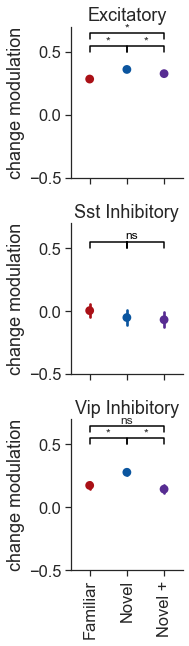

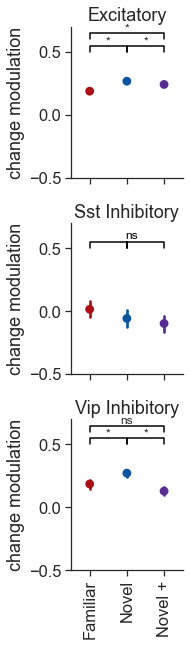

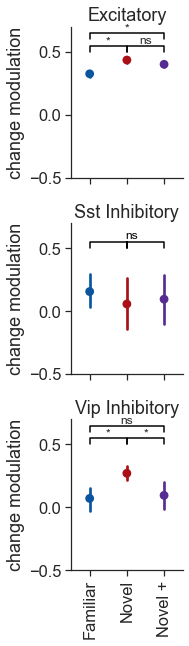

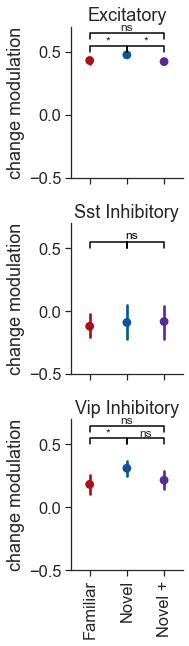

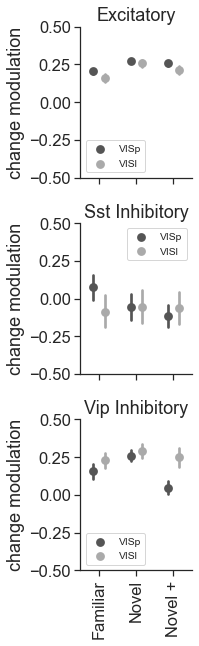

...

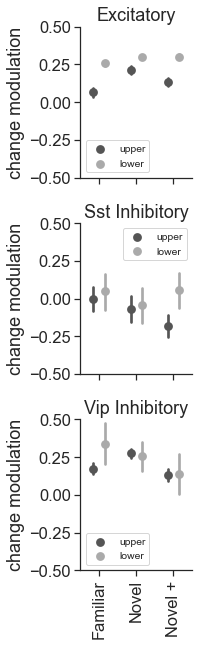

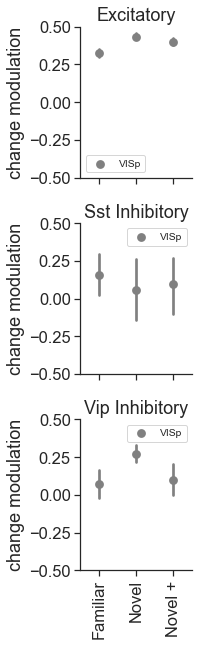

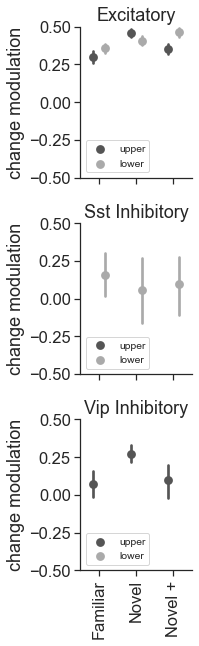

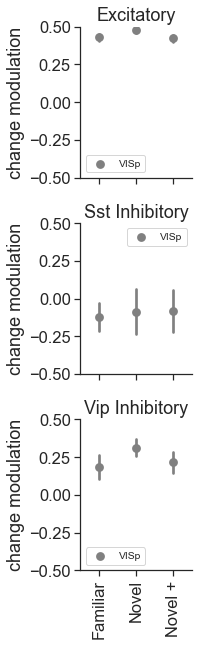

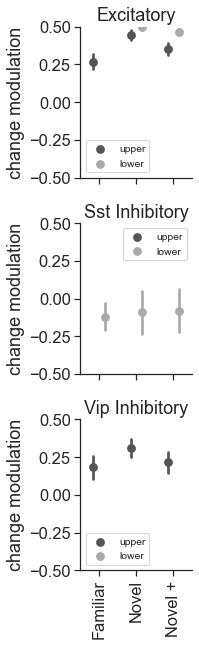

In [ ]:
metric = 'change_modulation_index'
ylabel = 'change modulation'
event_type = 'changes'

ylims = (-0.5, 0.5)


metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### reliability

please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats


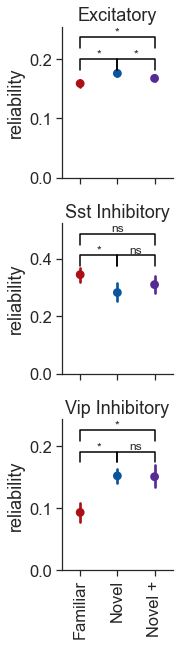

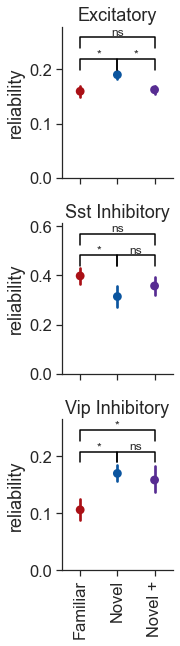

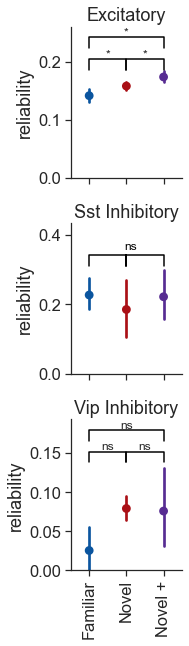

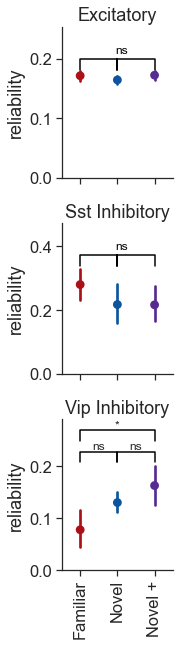

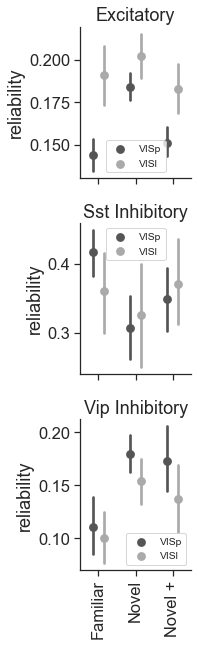

...

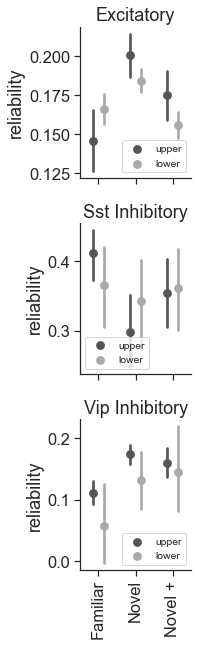

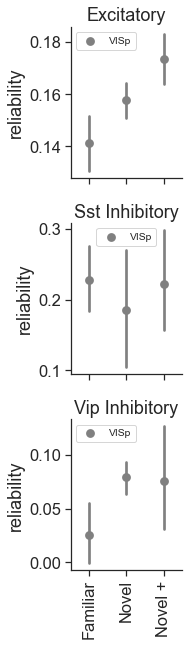

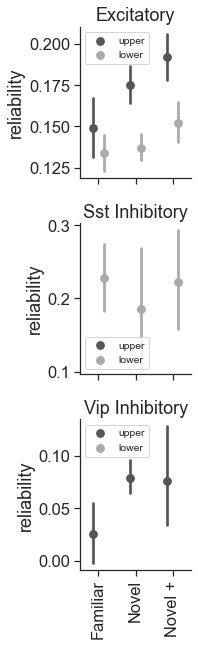

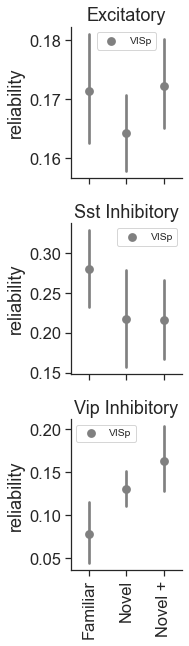

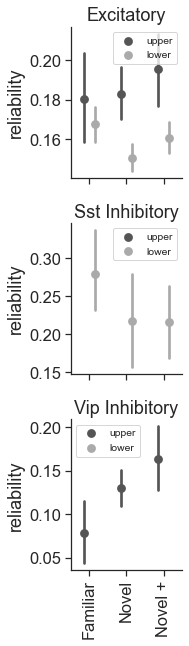

In [ ]:
metric = 'reliability'
ylabel = 'reliability'
event_type = 'changes'

ylims = None

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### lifetime sparseness

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


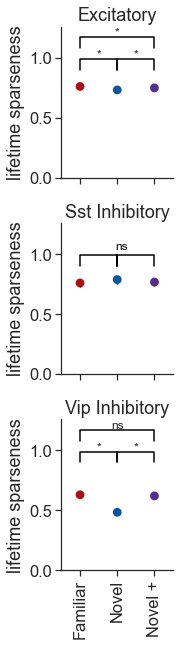

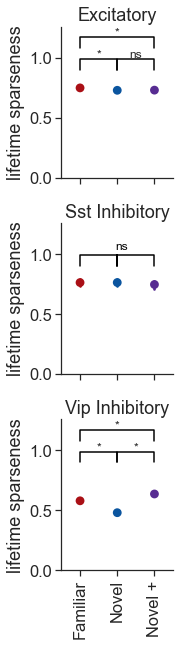

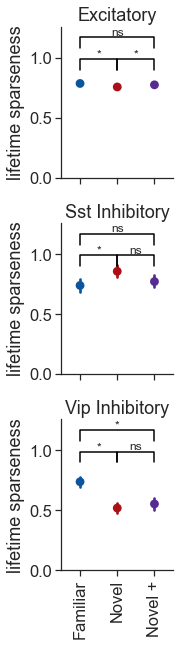

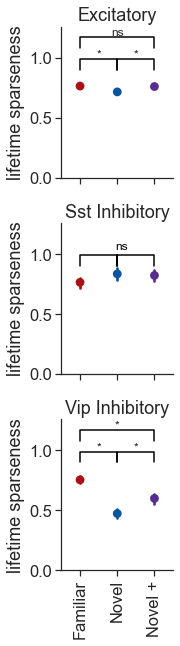

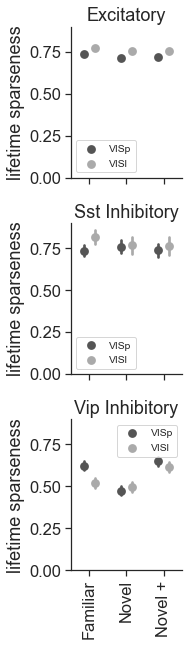

...

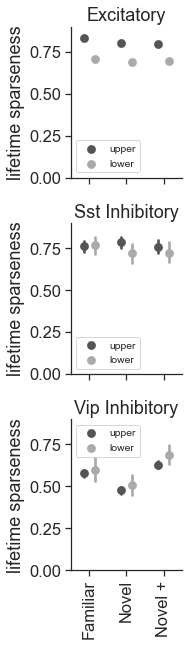

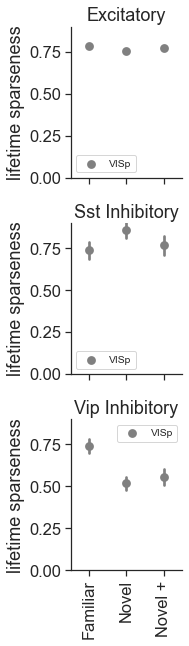

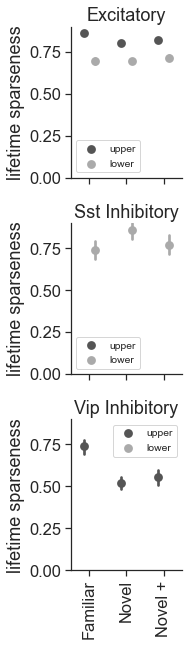

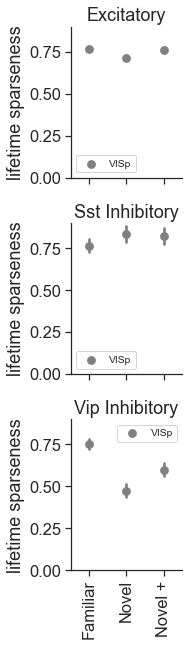

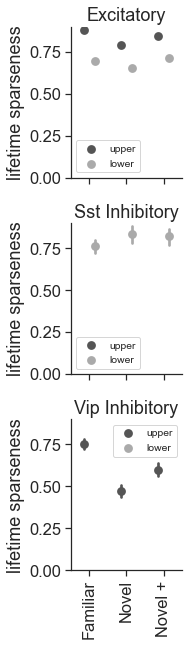

In [ ]:
metric = 'lifetime_sparseness'
ylabel = 'lifetime sparseness'
event_type = 'changes'

ylims = (-0.001, 0.9)

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### experience modulation of change response

402 experiments in metric_data after merging with cells_table


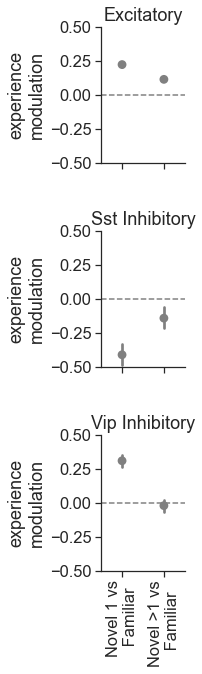

In [ ]:

metric = 'change_response'
event_type = 'changes'

metric_data = cm.compute_experience_modulation_index(change_metrics_table, metric, cells_table)
metric_data = metric_data.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(metric_data, event_type, save_dir=None)


In [ ]:
ophys_experiment_ids = experiments_table.index.values

condition = 'omissions'
stimuli = 'all_images'
session_subset = 'full_session'
    
omission_metrics_table = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


 20%|██        | 82/402 [00:17<00:53,  5.94it/s]

problem for experiment 988542529
problem for experiment 989191384


 23%|██▎       | 92/402 [00:19<00:47,  6.52it/s]

problem for experiment 994790561


 29%|██▊       | 115/402 [00:24<00:59,  4.78it/s]

problem for experiment 877669822


 38%|███▊      | 152/402 [00:32<01:24,  2.97it/s]

problem for experiment 994082680


 51%|█████     | 205/402 [00:42<00:31,  6.20it/s]

problem for experiment 991852002


 52%|█████▏    | 209/402 [00:43<00:37,  5.09it/s]

problem for experiment 991852001


 54%|█████▍    | 218/402 [00:45<00:38,  4.79it/s]

problem for experiment 991852004


 55%|█████▍    | 221/402 [00:46<00:31,  5.72it/s]

problem for experiment 991852005


 64%|██████▍   | 258/402 [00:53<00:30,  4.76it/s]

problem for experiment 977978321


 68%|██████▊   | 272/402 [00:56<00:25,  5.07it/s]

problem for experiment 981178537


 71%|███████   | 285/402 [00:58<00:23,  4.99it/s]

problem for experiment 882551937
problem for experiment 882968566


 72%|███████▏  | 288/402 [00:59<00:15,  7.23it/s]

problem for experiment 882551947


 77%|███████▋  | 309/402 [01:03<00:21,  4.40it/s]

problem for experiment 1043831389


 82%|████████▏ | 328/402 [01:07<00:11,  6.21it/s]

problem for experiment 1051249031
problem for experiment 1051423446


 90%|█████████ | 362/402 [01:14<00:07,  5.14it/s]

problem for experiment 1078904675


100%|██████████| 402/402 [01:23<00:00,  4.84it/s]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\pandas\core\generic.py:2718: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['condition', 'data_type', 'exception', 'filter_events', 'interpolate',
       'ophys_experiment_id', 'session_subset', 'stimuli', 'use_events'],
      dtype='object')]

  encoding=encoding,


there are 384 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To s

removing 1 problematic experiments


In [ ]:
print(len(experiments_table.index.values))

NameError: name 'experiments_table' is not defined

In [ ]:
print(len(omission_metrics_table.ophys_experiment_id.unique()))

NameError: name 'omission_metrics_table' is not defined

### save descriptive stats

In [ ]:
conditions = ['cell_type', 'experience_level']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)

conditions = ['cell_type', 'experience_level', 'targeted_structure']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)


conditions = ['cell_type', 'experience_level', 'layer']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)


conditions = ['cell_type', 'experience_level', 'targeted_structure', 'layer']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)

NameError: name 'condition' is not defined

### mean response

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


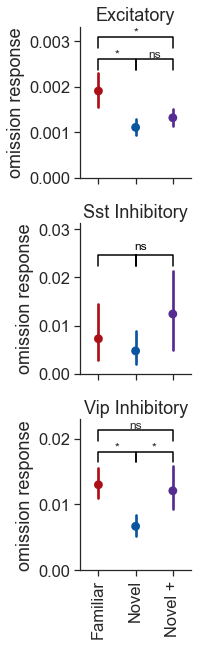

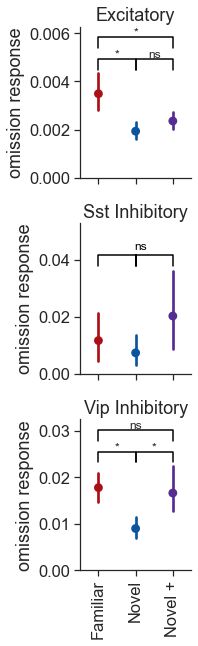

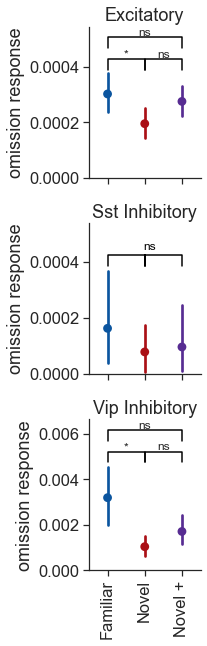

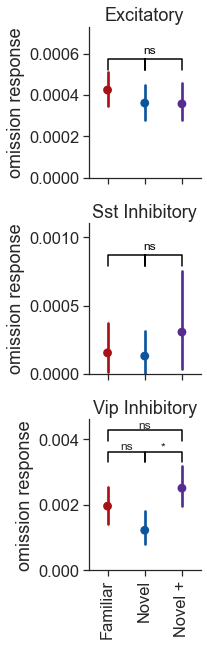

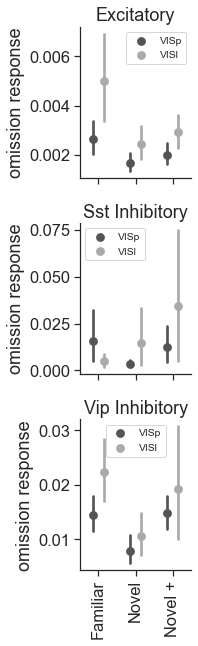

...

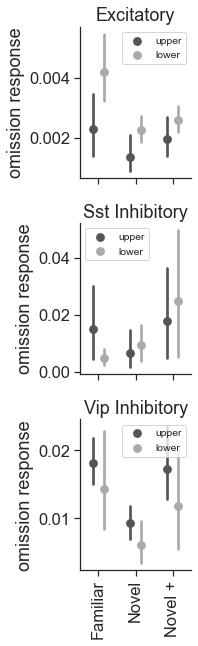

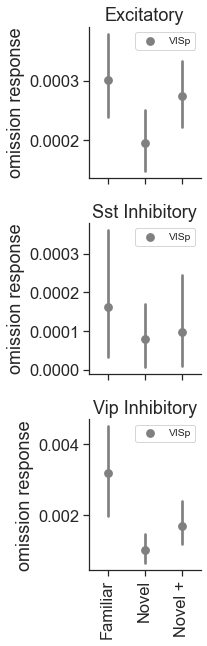

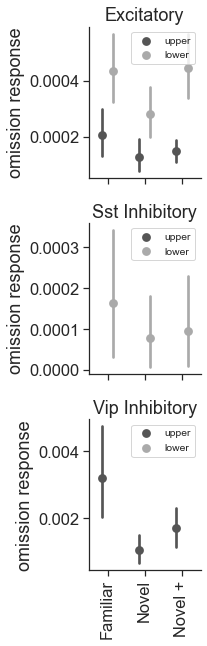

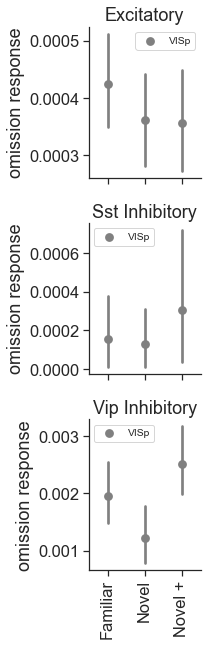

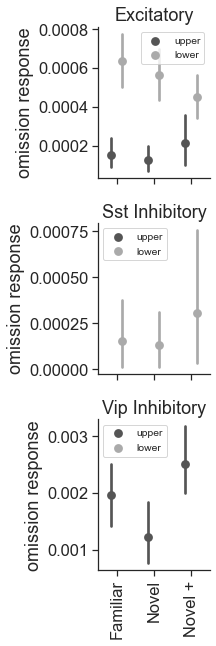

In [ ]:
metric = 'omission_response'
ylabel = 'omission response'
# ylabel = 'event magnitude'
event_type = 'omissions'

ylims = None #(-0.001, 0.025)

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel='omission response', ylims=ylims, add_zero_line=False, save_dir=save_dir)

### reliability 

please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


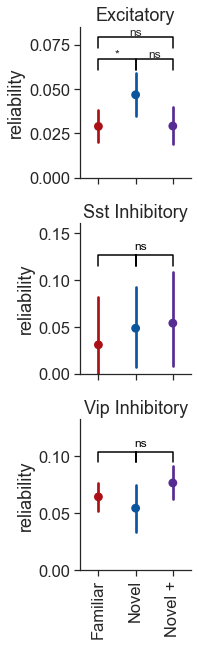

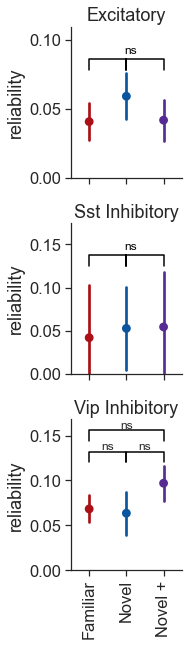

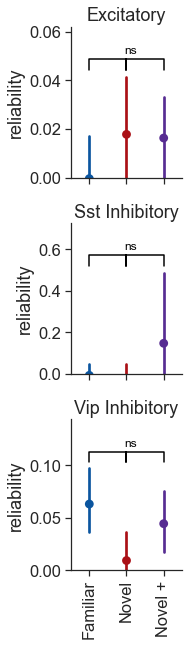

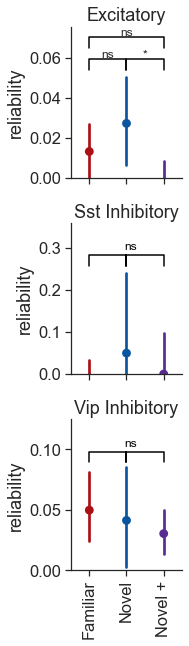

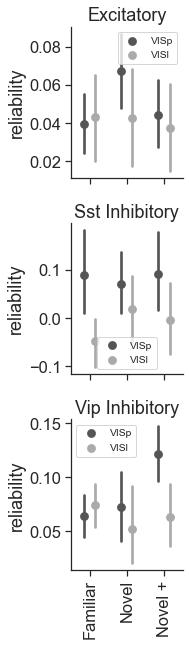

...

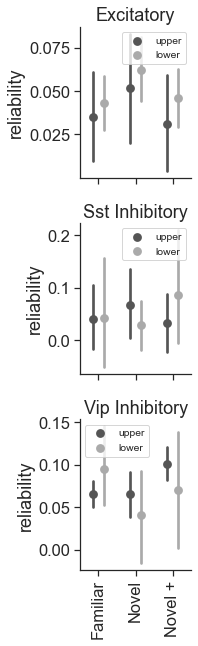

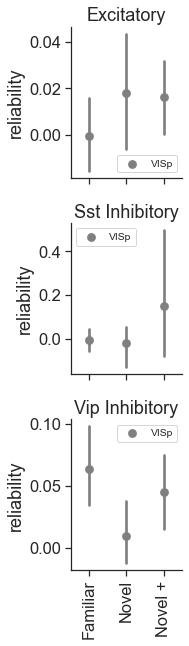

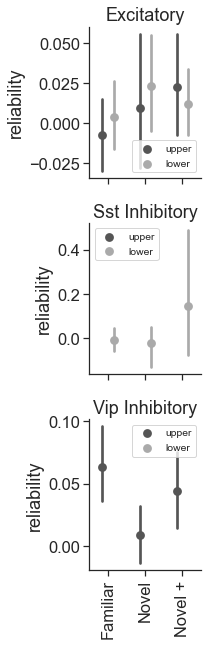

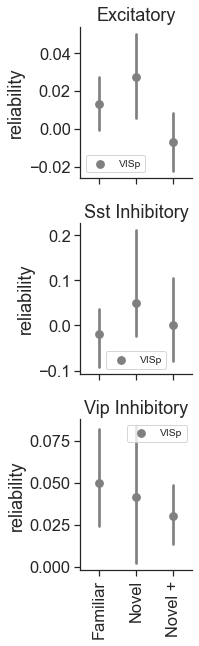

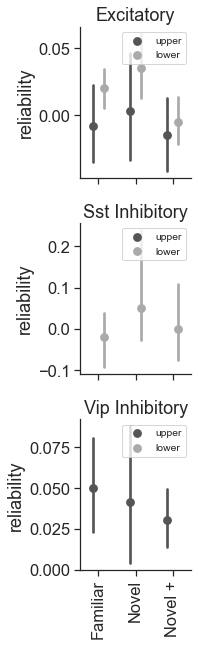

In [ ]:
metric = 'reliability'
ylabel = 'reliability'

ylims = None

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


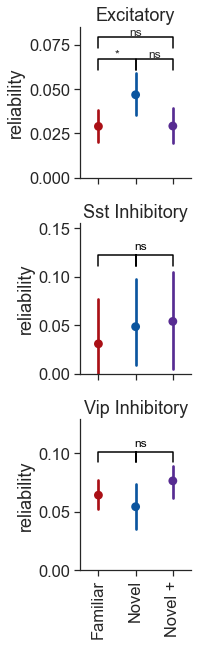

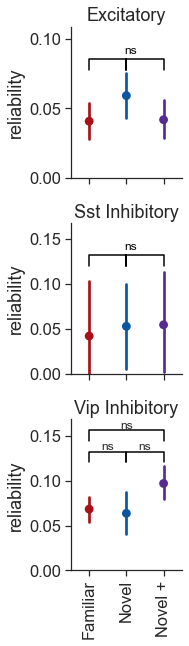

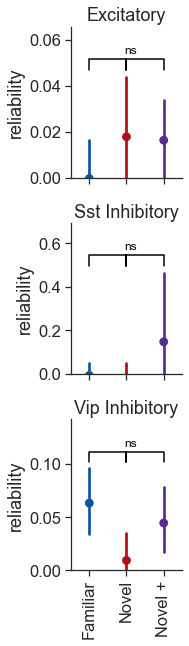

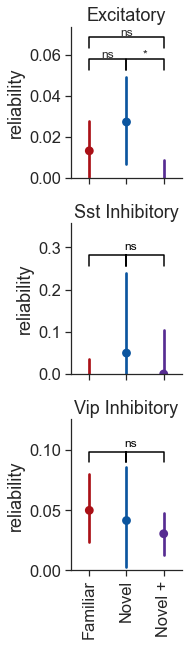

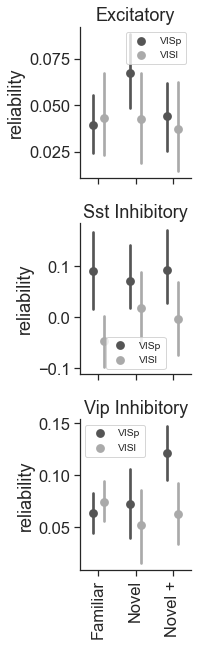

...

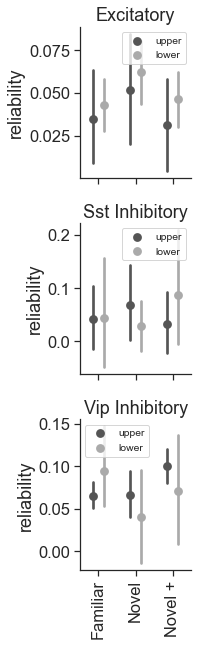

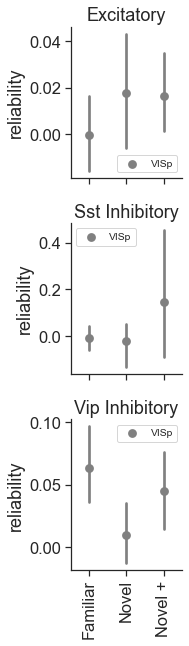

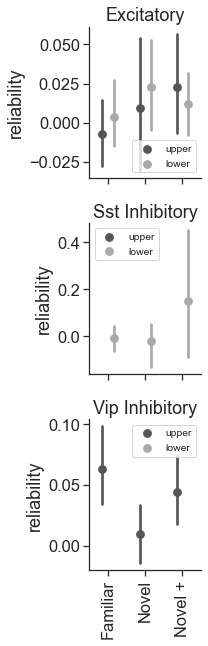

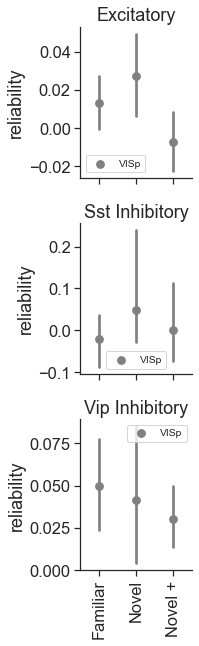

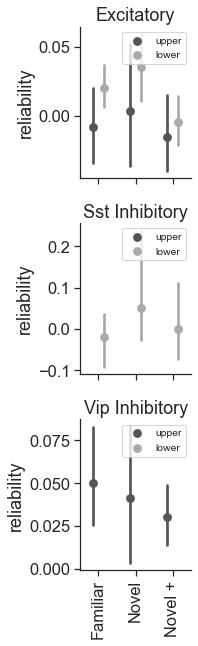

In [ ]:
metric = 'reliability'
ylabel = 'reliability'

ylims = None

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### running modulation

saving_stats
saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
saving_stats


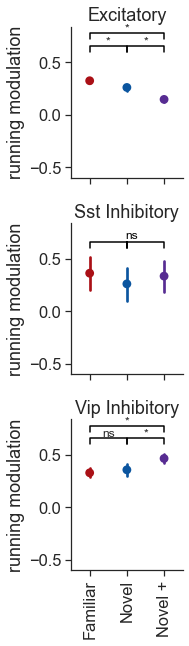

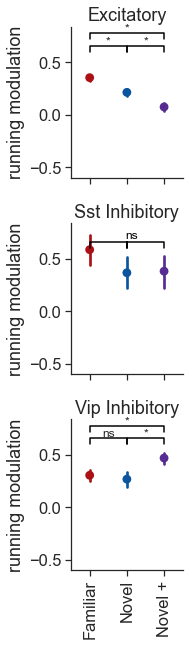

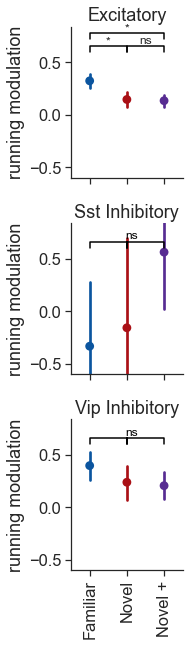

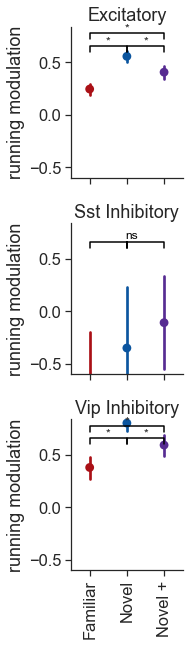

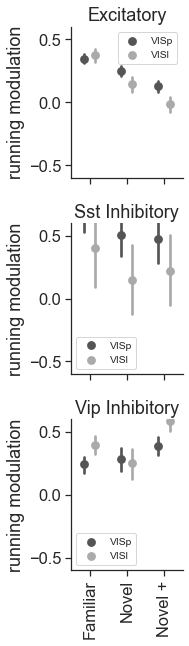

...

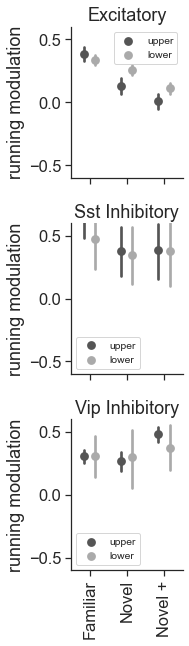

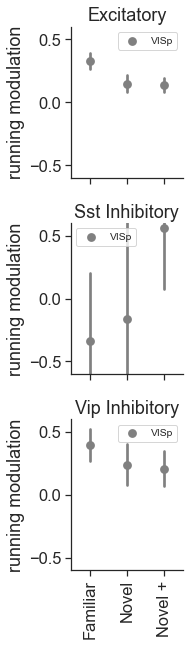

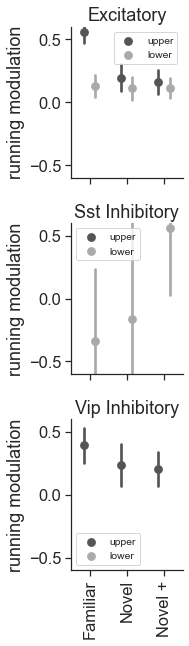

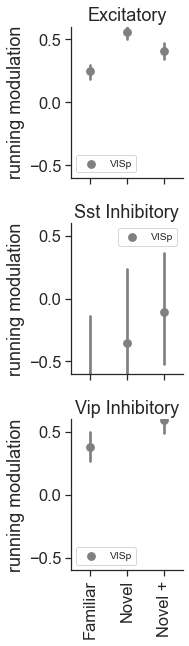

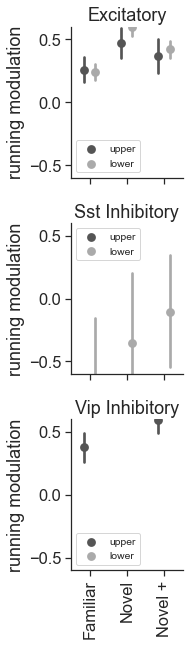

In [ ]:
metric = 'running_modulation_index'
ylabel = 'running modulation'
event_type = 'omissions'

ylims = (-0.6, 0.6)

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### omission modulation by experience

384 experiments in metric_data after merging with cells_table


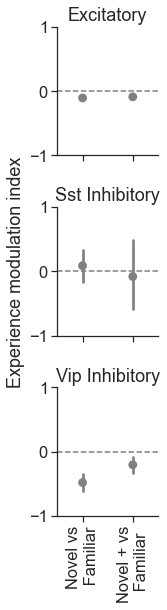

In [ ]:
metric = 'omission_response'
event_type = 'omissions'

metric_data = cm.compute_experience_modulation_index(omission_metrics_table, metric, platform_cells_table)
metric_data = metric_data.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(metric_data, event_type, save_dir=None)


# Behavior

### running speed

### changes

In [66]:
# params for stim response df creation
event_type = 'all'
data_type = 'running_speed'

interpolate = False
output_sampling_rate = None

# params for mean response df creation
conditions = ['ophys_experiment_id', 'is_change']

inclusion_criteria = 'platform_experiment_table' 

running_speed_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

running_speed_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria,
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

running_speed_mdf = running_speed_mdf[running_speed_mdf.is_change==True]
running_speed_mdf = running_speed_mdf.drop_duplicates(subset='behavior_session_id')
# running_speed_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in running_speed_mdf.experience_level.values]


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\original_frame_rate
mean_response_df_running_speed_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\original_frame_rate\mean_response_df_running_speed_all_is_change_platform_experiment_table.pkl
there are 1880 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


In [67]:
# running_speed_mdf = running_speed_mdf[running_speed_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(running_speed_mdf))

202


In [68]:
len(running_speed_mdf.mouse_id.unique())

66

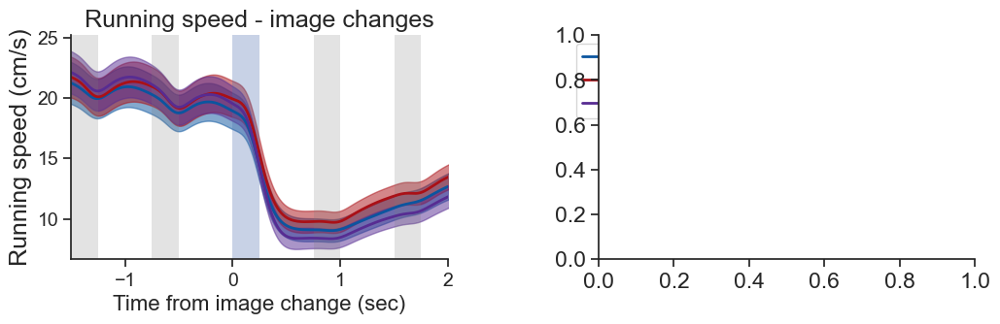

In [151]:
df = running_speed_mdf.copy()
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes',
                                                        axes_column, hue_column, horizontal=True, ylabel='Running speed (cm/s)',
                                                        xlim_seconds=xlim_seconds, interval_sec=1, xlabel='Time from image change (sec)',
                                                        palette=palette, ax=None, title='Running speed - image changes', 
                                                        suptitle=None, save_dir=save_dir, folder=folder, suffix=suffix)


saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Running speed (cm/s)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

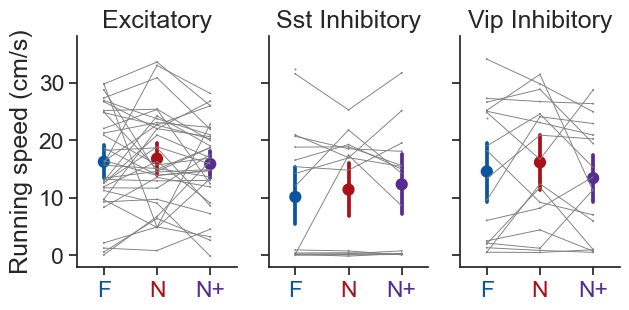

In [146]:
# mean response across experience levels 
metric = 'mean_response'
# ylabel = 'avg. running speed\nafter changes (cm/s)'
ylabel = 'Running speed (cm/s)'

event_type = 'running_speed_changes'

ylims = (-2, 35)

metrics_table = running_speed_mdf.copy()

ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
                                            horiz=True, abbreviate_exp=True, plot_type='pointplot', 
                                            show_containers=True, show_ns=False, save_dir=save_dir)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:940: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=ct_data, size=3, alpha=0.5, jitter=0.2,


saving_stats


<AxesSubplot:ylabel='Running speed (cm/s)'>

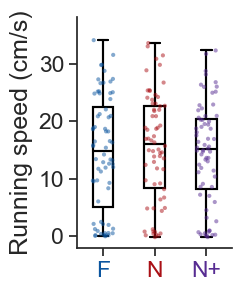

In [147]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Running speed (cm/s)'
event_type = 'changes'

ylims = (-2, 35)

metrics_table = running_speed_mdf.copy()

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
                                            abbreviate_exp=True, stripplot=True, show_ns=False, add_zero_line=False, save_dir=save_dir)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

In [18]:
# df = running_speed_mdf.copy()
# xlim_seconds=[-1, 1.5]

# ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='changes', suffix=running_speed_suffix,
#                                                                save_dir=save_dir, folder=folder, ax=None)


                                               
# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='changes', suffix=running_speed_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in running_speed_mdf.project_code.unique():
    
#     df = running_speed_mdf[running_speed_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='running speed\n(cm/s)',
#                                                                   data_type='running_speed', event_type='changes',
#                                                                   suffix=running_speed_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

In [19]:
# df = running_speed_mdf.copy()
# xlim_seconds=[-1, 1.5]

# axes_column = 'cell_type'
# hue_column = 'experience_level'
# palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# # xlim_seconds=[-1, 0.75]

# suffix = '_omissions_overlay_'+project_code+'_matched_to_Scientifica'

# ax = ppf.plot_population_averages_for_conditions(df, 'running_speed', 'changes',
#                                                         axes_column, hue_column, horizontal=True,
#                                                         xlim_seconds=xlim_seconds, interval_sec=0.5,
#                                                         palette=palette, ax=None, title=None, suptitle=None,
#                                                         save_dir=save_dir, folder=folder, suffix=suffix)


### omissions

In [148]:
# params for stim response df creation
event_type = 'all'
data_type = 'running_speed'

interpolate = False
output_sampling_rate = None

# params for mean response df creation
conditions = ['ophys_experiment_id', 'omitted']


running_speed_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

running_speed_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

running_speed_omission_mdf = running_speed_omission_mdf[running_speed_omission_mdf.omitted==True]
running_speed_omission_mdf = running_speed_omission_mdf.drop_duplicates(subset='behavior_session_id')
# running_speed_omission_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in running_speed_omission_mdf.experience_level.values]

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\original_frame_rate
mean_response_df_running_speed_all_omitted_platform_experiment_table.pkl


  6%|▌         | 1/18 [00:00<00:02,  7.16it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_G


 22%|██▏       | 4/18 [00:00<00:00, 14.75it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_B_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:00<00:00, 17.01it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_G
no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_A


 61%|██████    | 11/18 [00:00<00:00, 17.98it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_H
no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_A_passive


100%|██████████| 18/18 [00:01<00:00, 15.65it/s]


no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_H_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_A
no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_H


 28%|██▊       | 5/18 [00:00<00:00, 38.86it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_A
no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_G
no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_A_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_G_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_A


 89%|████████▉ | 16/18 [00:00<00:00, 38.59it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_G
no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_H
no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_B_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_H_passive


100%|██████████| 18/18 [00:00<00:00, 42.63it/s]


no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_H


 22%|██▏       | 4/18 [00:00<00:00, 30.78it/s]

no multi_session_df for VisualBehavior OPHYS_1_images_B
no multi_session_df for VisualBehavior OPHYS_1_images_G
no multi_session_df for VisualBehavior OPHYS_2_images_B_passive
no multi_session_df for VisualBehavior OPHYS_2_images_G_passive


 44%|████▍     | 8/18 [00:00<00:00, 31.34it/s]

no multi_session_df for VisualBehavior OPHYS_3_images_B


100%|██████████| 18/18 [00:00<00:00, 38.77it/s]

no multi_session_df for VisualBehavior OPHYS_3_images_G
no multi_session_df for VisualBehavior OPHYS_4_images_A
no multi_session_df for VisualBehavior OPHYS_4_images_H
no multi_session_df for VisualBehavior OPHYS_5_images_A_passive
no multi_session_df for VisualBehavior OPHYS_5_images_H_passive
no multi_session_df for VisualBehavior OPHYS_6_images_A
no multi_session_df for VisualBehavior OPHYS_6_images_H



 17%|█▋        | 3/18 [00:00<00:00, 24.00it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_B
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_B_passive


 50%|█████     | 9/18 [00:00<00:00, 23.67it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_B
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_B


 83%|████████▎ | 15/18 [00:00<00:00, 24.95it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_B_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_B


100%|██████████| 18/18 [00:00<00:00, 23.37it/s]


saving multi session df to pkl
there are 1880 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


In [149]:
# running_speed_omission_mdf = running_speed_omission_mdf[running_speed_omission_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(running_speed_omission_mdf))

202


In [22]:
# df = running_speed_omission_mdf.copy()
# xlim_seconds = [-1, 1.5]

# ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='omissions', suffix=running_speed_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='omissions', suffix=running_speed_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in running_speed_mdf.project_code.unique():
    
#     df = running_speed_mdf[running_speed_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='running speed\n(cm/s)',
#                                                                   data_type='running_speed', event_type='omissions',
#                                                                   suffix=running_speed_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

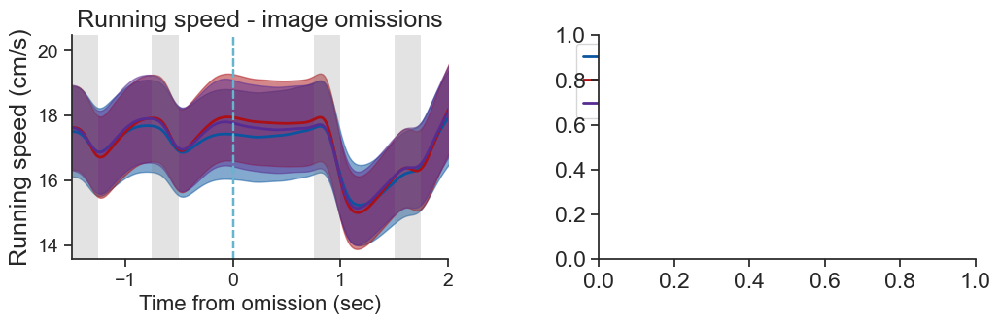

In [150]:
df = running_speed_omission_mdf.copy()
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'running_speed', 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Running speed - image omissions', 
                                                        suptitle=None, ylabel='Running speed (cm/s)', xlabel='Time from omission (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Running speed (cm/s)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

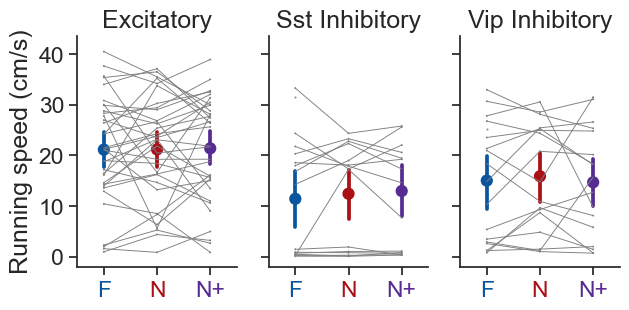

In [154]:
# mean response across experience levels 
metric = 'mean_response'
# ylabel = 'avg. running speed\nafter omissions (cm/s)'
ylabel = 'Running speed (cm/s)'

event_type = 'omissions'

ylims = (-2, 40)

metrics_table = running_speed_omission_mdf.copy()

ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
                                            abbreviate_exp=True, plot_type='pointplot', horiz=True, show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:940: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=ct_data, size=3, alpha=0.5, jitter=0.2,


saving_stats


<AxesSubplot:ylabel='Running speed (cm/s)'>

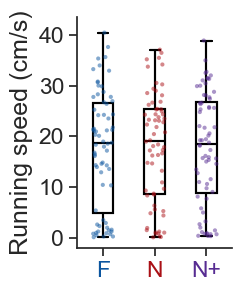

In [153]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Running speed (cm/s)'
event_type = 'omissions'
data_type = 'running_speed'

ylims = (-2, 40)

metrics_table = running_speed_omission_mdf.copy()

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            abbreviate_exp=True, show_ns=False, stripplot=True, add_zero_line=False, save_dir=save_dir)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

saving_stats


<AxesSubplot:ylabel='running speed (cm/s)'>

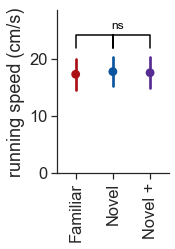

In [ ]:
# # mean response across experience levels 
# metric = 'mean_response'
# ylabel = 'running speed (cm/s)'
# event_type = 'omissions'

# ylims = (0, 22)

# metrics_table = running_speed_omission_mdf.copy()

# ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
#                                             pointplot=True, add_zero_line=False, save_dir=save_dir)

### pupil width

In [157]:
# params for stim response df creation
event_type = 'all'
data_type = 'pupil_width'

interpolate = True
output_sampling_rate = 30

# params for mean response df creation
conditions = ['ophys_experiment_id', 'is_change']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

pupil_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

pupil_mdf = pupil_mdf[pupil_mdf.is_change==True]
pupil_mdf = pupil_mdf.drop_duplicates(subset='behavior_session_id')
# pupil_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in pupil_mdf.experience_level.values]

# limit to platform xpts
# pupil_mdf = pupil_mdf[pupil_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(pupil_mdf))

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_pupil_width_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_pupil_width_all_is_change_platform_experiment_table.pkl
there are 1550 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 223 experiments in the multi_session_df after limiting to platform experiments
there are 223 experiments after filtering for inclusion criteria -  platform_experiment_table
161


In [ ]:
# df = pupil_mdf.copy()
# xlim_seconds = [-1, 1.5]

# ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type='pupil_width', event_type='changes', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type=data_type, event_type='changes', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in pupil_mdf.project_code.unique():
    
#     df = pupil_mdf[pupil_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='pupil width\n(normalized)',
#                                                                   data_type=data_type, event_type='changes',
#                                                                   suffix=pupil_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

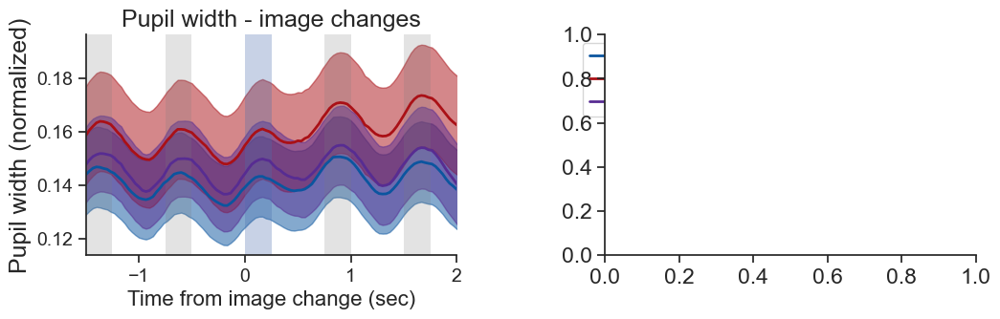

In [158]:
df = pupil_mdf.copy()
# set baselin to 0 instead of 1
df['mean_trace'] = [mean_trace-1 for mean_trace in df.mean_trace.values]

df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'pupil_width', 'changes',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Pupil width - image changes', 
                                                        suptitle=None, ylabel='Pupil width (normalized)', 
                                                        xlabel='Time from image change (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Pupil width (norm.)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

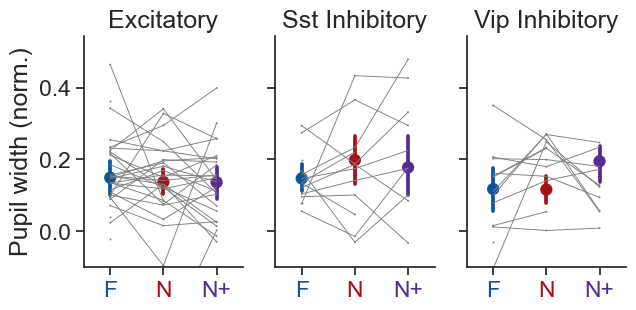

In [159]:
# mean response across experience levels 
metric = 'mean_response'
# ylabel = 'avg. pupil width\nafter changes\n(normalized)'
ylabel = 'Pupil width (norm.)'

event_type = 'changes'

ylims = (-0.1, 0.5)

metrics_table = pupil_mdf.copy()
# set baseline to 0 instead of 1
metrics_table['mean_response'] = metrics_table.mean_response - 1

ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'pupil_width', ylabel=ylabel, ylims=ylims, 
                                            abbreviate_exp=True, plot_type='pointplot', horiz=True, show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:940: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=ct_data, size=3, alpha=0.5, jitter=0.2,


saving_stats


<AxesSubplot:ylabel='Pupil width (norm.)'>

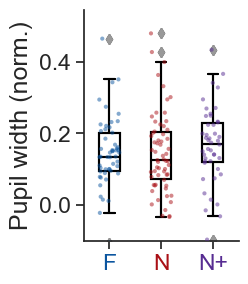

In [160]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Pupil width (norm.)'
event_type = 'changes'

ylims = (-0.1, 0.5)

metrics_table = pupil_mdf.copy()
# set baseline to 0 instead of 1
metrics_table['mean_response'] = metrics_table.mean_response - 1

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'pupil_width', ylabel=ylabel, ylims=ylims, 
                                            abbreviate_exp=True, stripplot=True, show_ns=False, add_zero_line=False, save_dir=save_dir)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, 'pupil_width', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

### omissions

In [163]:
# params for stim response df creation
event_type = 'all'
data_type = 'pupil_width'

interpolate = True
output_sampling_rate = 30

# params for mean response df creation
conditions = ['ophys_experiment_id', 'omitted']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

pupil_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

pupil_omission_mdf = pupil_omission_mdf[pupil_omission_mdf.omitted==True]
pupil_omission_mdf = pupil_omission_mdf.drop_duplicates(subset='behavior_session_id')
pupil_omission_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in pupil_omission_mdf.experience_level.values]

# limit to platform xpts
pupil_omission_mdf = pupil_omission_mdf[pupil_omission_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(pupil_omission_mdf))

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_pupil_width_all_omitted_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_pupil_width_all_omitted_platform_experiment_table.pkl
there are 1544 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 223 experiments in the multi_session_df after limiting to platform experiments
there are 223 experiments after filtering for inclusion criteria -  platform_experiment_table
161


In [ ]:
# df = pupil_omission_mdf.copy()
# xlim_seconds = [-1, 1.5]

# ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type=data_type, event_type='omissions', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type=data_type, event_type='omissions', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in pupil_mdf.project_code.unique():
    
#     df = pupil_mdf[pupil_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='pupil width\n(normalized)',
#                                                                   data_type=data_type, event_type='omissions',
#                                                                   suffix=pupil_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

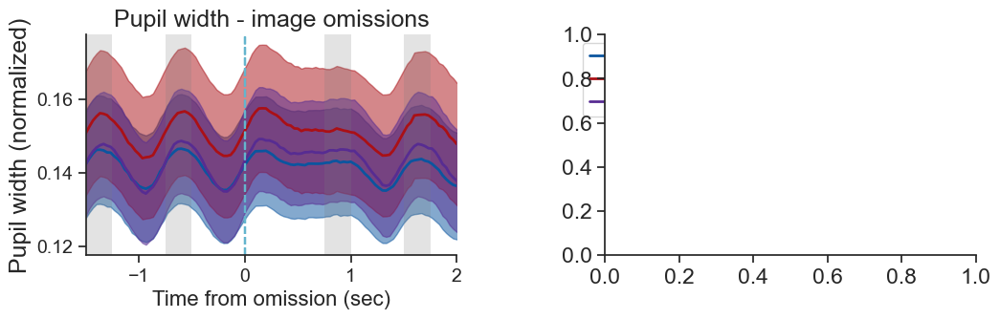

In [164]:
df = pupil_omission_mdf.copy()
# set baseline to zero instead of 1
df['mean_trace'] = [mean_trace-1 for mean_trace in df.mean_trace.values]
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'pupil_width', 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Pupil width - image omissions', 
                                                        suptitle=None, ylabel='Pupil width (normalized)', xlabel='Time from omission (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Pupil width (norm.)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

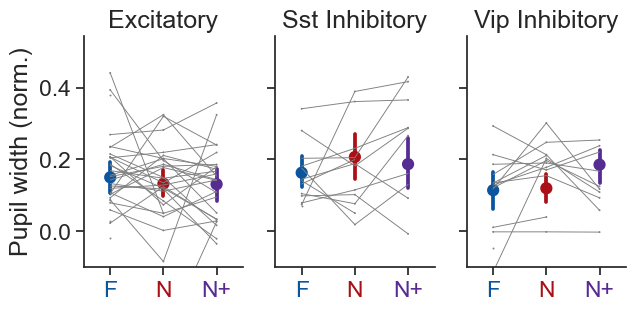

In [165]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'avg. pupil width\nafter omissions\n(normalized)'
ylabel = 'Pupil width (norm.)'

event_type = 'omissions'

ylims = (-0.1, 0.5)

metrics_table = pupil_omission_mdf.copy()
# set baseline to 0 instead of 1
metrics_table['mean_response'] = metrics_table.mean_response - 1

ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'pupil_width', ylabel=ylabel, ylims=ylims, 
                                            abbreviate_exp=True, plot_type='pointplot', horiz=True, show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:940: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=ct_data, size=3, alpha=0.5, jitter=0.2,


saving_stats


<AxesSubplot:ylabel='Pupil width (norm.)'>

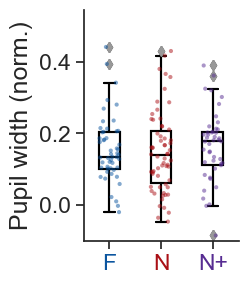

In [166]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Pupil width (norm.)'
event_type = 'omissions'

ylims = (-0.1, 0.5)

metrics_table = pupil_omission_mdf.copy()
# set baseline to 0 instead of 1
metrics_table['mean_response'] = metrics_table.mean_response - 1

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'pupil_width',
                                                        ylabel=ylabel, ylims=ylims, show_ns=False,
                                            abbreviate_exp=True, stripplot=True, add_zero_line=False, save_dir=save_dir)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, 'pupil_width', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

### lick rate

In [167]:
# params for stim response df creation
event_type = 'all'
data_type = 'lick_rate'

interpolate = False
output_sampling_rate = None

# params for mean response df creation
conditions = ['ophys_experiment_id', 'is_change']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

lick_rate_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

lick_rate_mdf = lick_rate_mdf[lick_rate_mdf.is_change==True]
lick_rate_mdf = lick_rate_mdf.drop_duplicates(subset='behavior_session_id')

# limit to platform xpts
lick_rate_mdf = lick_rate_mdf[lick_rate_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(lick_rate_mdf))

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\original_frame_rate
mean_response_df_lick_rate_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\original_frame_rate\mean_response_df_lick_rate_all_is_change_platform_experiment_table.pkl
there are 1602 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table
202


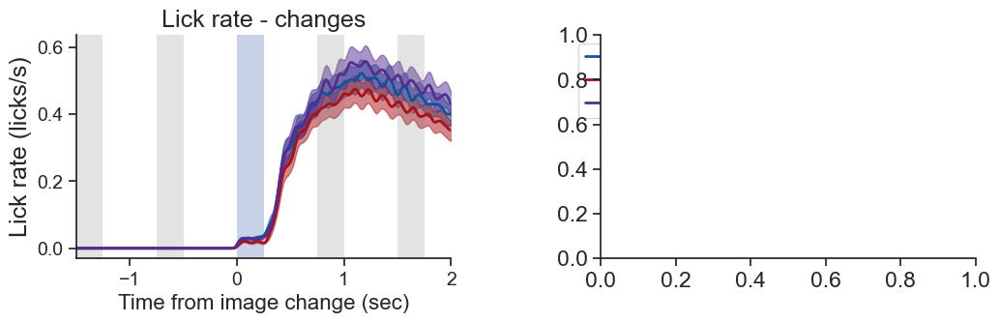

In [168]:
df = lick_rate_mdf.copy()
# put in units of licks / sec
df['mean_trace'] = [mean_trace*10 for mean_trace in df.mean_trace.values]
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'lick_rate', 'changes',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Lick rate - changes', 
                                                        suptitle=None, ylabel='Lick rate (licks/s)',  xlabel='Time from image change (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Lick rate (licks/s)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

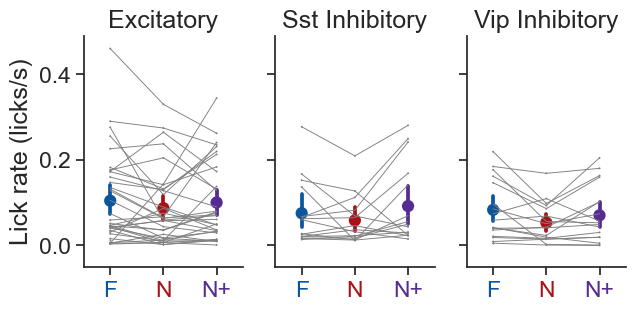

In [170]:
# mean response across experience levels 
metric = 'mean_response'
# ylabel = 'avg. lick rate\nafter changes'
ylabel = 'Lick rate (licks/s)'
event_type = 'changes'

ylims = (-0.05, 0.45)

metrics_table = lick_rate_mdf.copy()
# put in units of licks / sec
metrics_table['mean_response'] = metrics_table.mean_response * 10


ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'lick_rate', ylabel=ylabel, ylims=ylims, 
                                            abbreviate_exp=True, plot_type='pointplot', horiz=True,  show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:940: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=ct_data, size=3, alpha=0.5, jitter=0.2,


saving_stats


<AxesSubplot:ylabel='Lick rate (licks/s)'>

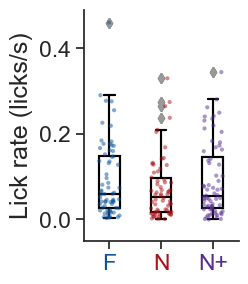

In [172]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Lick rate (licks/s)'
event_type = 'changes'

ylims = (-0.05, 0.45)

metrics_table = lick_rate_mdf.copy()
# put in units of licks / sec
metrics_table['mean_response'] = metrics_table.mean_response * 10


ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'pupil_width',
                                                        ylabel=ylabel, ylims=ylims, show_ns=False,
                                                        abbreviate_exp=True, stripplot=True, add_zero_line=False, save_dir=save_dir)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, 'pupil_width', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

In [173]:
# params for stim response df creation
event_type = 'all'
data_type = 'lick_rate'

interpolate = False
output_sampling_rate = None

# params for mean response df creation
conditions = ['ophys_experiment_id', 'omitted']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

lick_rate_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

lick_rate_omission_mdf = lick_rate_omission_mdf[lick_rate_omission_mdf.omitted==True]
lick_rate_omission_mdf = lick_rate_omission_mdf.drop_duplicates(subset='behavior_session_id')
# lick_rate_omission_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in lick_rate_omission_mdf.experience_level.values]

# limit to platform xpts
lick_rate_omission_mdf = lick_rate_omission_mdf[lick_rate_omission_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(lick_rate_omission_mdf))

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\original_frame_rate
mean_response_df_lick_rate_all_omitted_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\original_frame_rate\mean_response_df_lick_rate_all_omitted_platform_experiment_table.pkl
there are 1602 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table
202


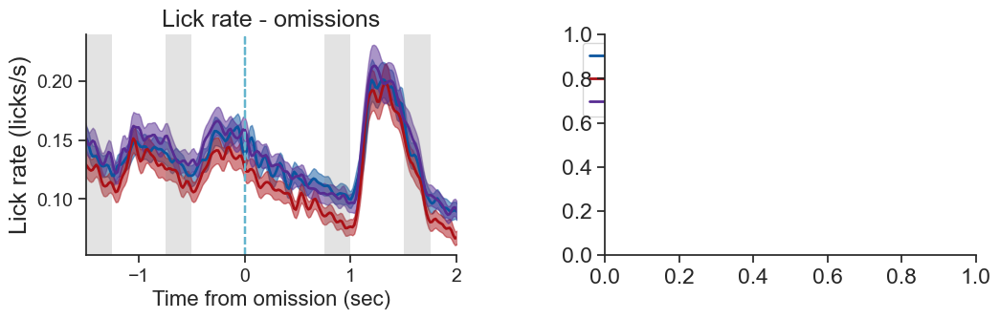

In [174]:
df = lick_rate_omission_mdf.copy()
# put in units of licks / sec
df['mean_trace'] = [mean_trace*10 for mean_trace in df.mean_trace.values]
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'lick_rate', 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Lick rate - omissions', 
                                                        suptitle=None, ylabel='Lick rate (licks/s)',  xlabel='Time from omission (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Lick rate (licks/s)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

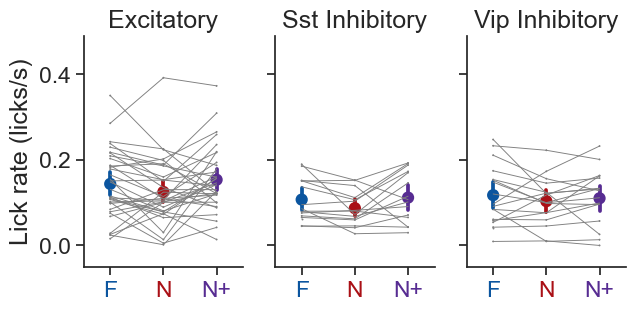

In [175]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Lick rate (licks/s)'
event_type = 'omissions'

ylims = (-0.05, 0.45)

metrics_table = lick_rate_omission_mdf.copy()
# put in units of licks / sec
metrics_table['mean_response'] = metrics_table.mean_response * 10


ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'lick_rate', ylabel=ylabel, ylims=ylims, 
                                            abbreviate_exp=True, plot_type='pointplot', horiz=True, show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:940: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=ct_data, size=3, alpha=0.5, jitter=0.2,


saving_stats


<AxesSubplot:ylabel='Lick rate (licks/s)'>

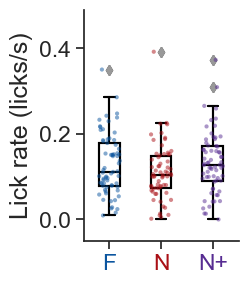

In [176]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Lick rate (licks/s)'
event_type = 'omissions'

ylims = (-0.05, 0.45)

metrics_table = lick_rate_omission_mdf.copy()
# put in units of licks / sec
metrics_table['mean_response'] = metrics_table.mean_response * 10


ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'pupil_width',
                                                        ylabel=ylabel, ylims=ylims, show_ns=False,
                                                        abbreviate_exp=True,stripplot=True, add_zero_line=False, save_dir=save_dir)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, 'pupil_width', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)